Estimating metallicity using supervised learning. The features used are the spectra of stars. They can be thought as a feature vector and treated indepedeent, althought neighboring features are not fully independent in practice. 
The spectra used here are already corrected for (velocity) shifts. Thus in constrats to the classification and velocity projects no shifts are needed here. On the other hand this projects has clearly less labelled data, only 107 in the current rather strict selection.  

In [110]:
import numpy as np
import scipy as sp

import pandas as pd
#unneded ones are currently included 
from scipy import stats
from scipy.stats import norm, skew #for some statistics
from scipy.special import boxcox1p
from sklearn.linear_model import ElasticNet, Lasso,  BayesianRidge, LassoLarsIC
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestRegressor,  GradientBoostingRegressor
from sklearn.kernel_ridge import KernelRidge
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import RobustScaler
from sklearn import preprocessing #for scaling data
from sklearn.base import BaseEstimator, TransformerMixin, RegressorMixin, clone
from sklearn.model_selection import KFold, cross_val_score, train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split
from sklearn.linear_model import ElasticNet, Lasso,  Ridge, BayesianRidge, LassoLarsIC
from sklearn.kernel_ridge import KernelRidge
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.ensemble import VotingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.inspection import permutation_importance
from sklearn.metrics import confusion_matrix
from sklearn.pipeline import make_pipeline
from matplotlib import pyplot as plt
from matplotlib.pyplot import figure

from sklearn.decomposition import PCA

import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Conv1D
from tensorflow.keras.layers import MaxPooling1D
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Embedding

import seaborn as sns

import xgboost as xgb

from astropy.io import fits

from functions1 import *  # own functions

import logging
logging.getLogger("tensorflow").setLevel(logging.ERROR)

Now we load the features for all stars and select the onces which have metallicity labels. 

In [111]:
#labels for orientation, mostly ids matter here 
vel=np.loadtxt("velocities_pyas_2templ_all.txt")
print(f"shape of general labels {np.shape(vel)}")
#features
xall=np.loadtxt("shifted_spectra_pyas_2templ_all.txt")
print(f"shape of features {np.shape(xall)}")
#two files with the ids of the stars and label labels in different formats
cal1=np.loadtxt("met_nuc.txt")
print(f"shape of calibrator1 {np.shape(cal1)}")
cal2=np.loadtxt("met_cals.txt")
print(f"shape of calibrator2 {np.shape(cal2)}")

#combine calibrators into same shape, collecting data on ids (can be multiple), S/N and the target label metallicity
calall=np.zeros((37,107))
c=0
for i in range(np.shape(cal1)[1]):
    print(f"star {i}")
    calall[0,c]=1
    calall[1,c]=cal1[0,i]    
    calall[2,c]=cal1[9,i]
    calall[3,c]=cal1[3,i]
    calall[4:6,c]=cal1[1:3,i]
    calall[28,c]=cal1[11,i] #Teff
    calall[29,c]=1 #its source apogee is 1 
    calall[30,c]=cal1[10,i] #logg   
    calall[31,c]=cal1[12,i] #alpha
    calall[32:34,c]= cal1[4:6,i] #coordinates 
    r=np.sqrt((calall[1,c]-vel[4])**2+(calall[4,c]-vel[8])**2+(calall[5,c]-vel[9])**2+(calall[3,c]-vel[10])**2)
    s=np.argmin(r)
    #print(r[s]) 
    calall[6,c]=vel[7,s]
    print(f"s/n of exp 1 is {calall[6,c]}")
    calall[7,c]=s
    c+=1
    #get the ones with multiple data sets
    for j in range(2):
        if cal1[14+2*j,i]!=0:
            calall[0,c-1]+=1
            calall[8+4*j:10+4*j,c-1]=cal1[14+2*j:16+2*j,i]
            r=np.sqrt((cal1[0,i]-vel[4])**2+(vel[8]-cal1[14+2*j,i])**2+(vel[9]-cal1[15+2*j,i])**2+(cal1[3,i]-vel[10])**2)
            s=np.argmin(r)
            #print(r[s])
            calall[10+4*j,c-1]=vel[7,s]
            calall[11+4*j,c-1]=s
            print(f"s/n of exp {j+2} is {calall[10+4*j,c-1]}")
        

print(calall[0:8,0:c].T)   
#now data set 2 
for i in range(np.shape(cal2)[1]):
    print(f"star {i}")
    calall[0,c]=cal2[0,i]
    calall[1,c]=3 #all sources 3   
    calall[2,c]=cal2[36,i]
    calall[3,c]=1 #all are level one
    calall[28,c]=cal2[32,i] #Teff
    calall[29,c]=cal2[35,i] #its source apogee is 1 , 2 Gaia , 3 GES
    calall[30,c]=cal2[31,i] #logg   
    calall[31,c]=cal2[33,i] #alpha
    calall[32:34,c]=cal2[22:24,i]  #coordinates     
    
    for j in range(int(cal2[0,i])):
        calall[4+4*j:6+4*j,c]=cal2[1+2*j:3+2*j,i]
        r=np.sqrt((calall[1,c]-vel[4])**2+(cal2[1+2*j,i]-vel[8])**2+(cal2[2+2*j,i]-vel[9])**2+(calall[3,c]-vel[10])**2)
        s=np.argmin(r)
        print(r[s])
        calall[6+4*j,c]=vel[7,s]
        print(f"s/n of exp {j+1} is {calall[6+4*j,c]}")
        calall[7+4*j,c]=s
    c+=1
    
print(f"number of stars {c}")  
#This file contains the mask and some information used for normalization
resselb=np.loadtxt('norm_mask_v1.txt')

shape of general labels (20, 4748)
shape of features (3072, 4748)
shape of calibrator1 (18, 23)
shape of calibrator2 (37, 84)
star 0
s/n of exp 1 is 84.93251198271109
star 1
s/n of exp 1 is 61.27718963887163
star 2
s/n of exp 1 is 94.28685354637321
star 3
s/n of exp 1 is 82.82941179076919
star 4
s/n of exp 1 is 81.24136913365675
star 5
s/n of exp 1 is 87.03196494035535
s/n of exp 2 is 73.35351937676714
s/n of exp 3 is 78.41684043083046
star 6
s/n of exp 1 is 76.20845331648766
s/n of exp 2 is 89.67876979884284
s/n of exp 3 is 87.5733850498604
star 7
s/n of exp 1 is 45.867832595242
s/n of exp 2 is 72.0095613963618
s/n of exp 3 is 71.07280972798034
star 8
s/n of exp 1 is 47.29908564456481
s/n of exp 2 is 58.60690381083618
s/n of exp 3 is 67.31444730270522
star 9
s/n of exp 1 is 67.59564092137683
s/n of exp 2 is 60.57285497121124
s/n of exp 3 is 62.88290630456617
star 10
s/n of exp 1 is 50.014664089607365
s/n of exp 2 is 66.31461599113013
s/n of exp 3 is 67.10179508782983
star 11
s/n of ex

In [37]:
#checking the (row) numbers in the selection file
print(np.shape(resselb))
print(resselb[0])

(10, 2790)
[ 150.  151.  152. ... 2937. 2938. 2939.]


We now combining the several exposoures of the star star weighted. That makes sample spliiting easier and
also avoid that some samples are only by noise different and others also by intrinsic properties. 

In [38]:
#needs numpy, scitiklearn linear regression
#arguments,
# spectrum to be normalized, wavelength of it, good pixels (are 1) one is saved in norm_mask_v1.txt (all 3 are 1 d arrays of same length)
#misses numpy as function when loaded in notebook
#applies polynom regression to select pixels, the pixels are select from a median spectram as being in the 0.7 to 0.9
#quantile comared to the local range
def norm(spec,wave, select, lima, limb, poly):
    import numpy as np
    c=0
    ar=np.zeros((int(poly+1),np.shape(spec)[0])) #for fitting
    ar2=np.zeros((int(poly+1),np.shape(spec)[0])) #for applying
    for i in range(np.shape(spec)[0]):
        for j in range(poly):
            ar2[j+1,i]=(wave[i]-(lima+limb)/2)**(j+1)        
            if select[i]==1 and wave[i]>lima and wave[i]<limb:
                ar[0,c]=spec[i]
                for j in range(poly):
                    ar[j+1,c]=(wave[i]-(lima+limb)/2)**(j+1)
                c+=1
    ar=ar[:,0:c]
    regr=LinearRegression()

    regr.fit(ar[1:int(1+poly),:].T,ar[0,:])
    pred = regr.predict(ar[1:int(1+poly),:].T)
    pred2 = regr.predict(ar2[1:int(1+poly),:].T)  
    std=np.std(ar[0,:]-pred)
    coef=np.zeros((int(poly+1)))
    coef[0]=regr.intercept_
    coef[1:int(poly+1)]=regr.coef_
    norm=spec/pred2
    #return normalized spectrum, coefficienst of polynom and standard deviation of (fit-spectrum) in selected range
    return norm, coef, std

Now we are getting the features, in two versions. One is linearly noramalized, one with a third order polynom.
Both use about the same range for normalizations. There no larger range used for normalization because outside there is either
too much signal there or too much noise. 

In [39]:
x=np.zeros((3072,107))
#normalized features
xnorm=np.zeros((2790,107))
#final labels plus some basic properties more now
tar2=np.zeros((9,107))

for i in range(np.shape(calall)[1]):
    tar2[0,i]=calall[0,i]
    tar2[1,i]=calall[2,i]
    tar2[3:9,i]=calall[28:34,i]    
    if calall[0,i]==1:
        #single exposures are just comied
        print(f"star {i} only 1 exposure")
        #linear npormalized which is just slecting the spectra because it was already linearly normalized
        x[:,i]=xall[:,int(calall[7,i])]
        #applying 3rd order normalization
        xb=xall[int(min(resselb[0])):int(max(resselb[0])+1),int(calall[7,i])]
        xnorm[:,i]=norm(xb,resselb[3],resselb[9],2.07,2.30,3)[0]
        tar2[2,i]=calall[6,i]
    else:
        #several expousres are weighted combined using S/N**2
        print(f"star {i} {round(calall[0,i])} exposures")
        #weights
        w=np.zeros((int(calall[0,i])))
        #targets
        ar=np.zeros((int(calall[0,i]),3072))
        ar2=np.zeros((int(calall[0,i]),2790))
        #variance weighted 
        w2=0
        for j in range(np.shape(w)[0]):
            w[j]=calall[6+4*j,i]**2
            w2+=calall[6+4*j,i]**2
            ar[j,:]=xall[:,int(calall[7+4*j,i])]
            xb=xall[int(min(resselb[0])):int(max(resselb[0])+1),int(calall[7+4*j,i])]
            ar2[j,:]=norm(xb,resselb[3],resselb[9],2.07,2.30,3)[0]
        w=w/np.sum(w)  
        tar2[2,i]=np.sqrt(w2)
        tar2[3:9,i]=calall[28:34,i]
        print(f"weight vector is {w}")  
        for j in range(np.shape(w)[0]):       
             x[:,i]+=ar[j,:]*w[j] 
             xnorm[:,i]+=ar2[j,:]*w[j]   
#final labels rows are n_exp, metallicity, total s/N, Teff, source, logg, alpha, ra, dec
print(f"final labels {tar2.T}")     
np.savetxt("cal_properties_fin1.txt",tar2)

star 0 only 1 exposure
star 1 only 1 exposure
star 2 only 1 exposure
star 3 only 1 exposure
star 4 only 1 exposure
star 5 3 exposures
weight vector is [0.39648051 0.28164768 0.32187181]
star 6 3 exposures
weight vector is [0.26988704 0.37372747 0.35638549]
star 7 3 exposures
weight vector is [0.17048293 0.4201891  0.40932797]
star 8 3 exposures
weight vector is [0.21926473 0.33663622 0.44409906]
star 9 3 exposures
weight vector is [0.37475253 0.30092847 0.32431901]
star 10 3 exposures
weight vector is [0.2193933 0.3856978 0.3949089]
star 11 3 exposures
weight vector is [0.39224858 0.32351062 0.2842408 ]
star 12 3 exposures
weight vector is [0.36334622 0.31863826 0.31801552]
star 13 3 exposures
weight vector is [0.33620356 0.26463695 0.39915949]
star 14 3 exposures
weight vector is [0.19425413 0.41876578 0.3869801 ]
star 15 3 exposures
weight vector is [0.53974308 0.25661077 0.20364614]
star 16 3 exposures
weight vector is [0.36885412 0.31527028 0.3158756 ]
star 17 only 1 exposure
star 

[3424.505 4169.097 3586.159 3310.605 3295.038 3715.507 3373.125 3562.355
 3274.75  3845.104 3883.951 3252.098 4010.873 3800.727 3457.877 3888.951
 3400.978 3416.396 3739.456 3440.148 3782.128 4821.916 4364.298 3813.712
 4003.267 3763.657 3490.547 3567.887 3361.012 3654.485 4211.3   3889.373
 4125.072 3801.857 3414.254 4129.799 3676.196 3809.05  3451.821 4156.714
 4215.212 4278.947 3346.82  4241.329 4342.872 4034.331 4035.319 4135.229
 3649.49  3910.45  3767.023 3928.037 4236.099 4319.711 4068.817    0.
 4250.       0.       0.       0.       0.       0.       0.       0.
    0.       0.    3852.       0.       0.       0.    3769.    3412.
    0.    4309.    4565.    4595.       0.       0.       0.       0.
 3985.528    0.    4250.    3798.658    0.       0.       0.       0.
    0.       0.       0.    3893.463    0.       0.       0.       0.
 3916.227    0.    4187.    4542.    5179.    4194.    4369.       0.
 4510.       0.    3297.151]
median S/N is 111.11


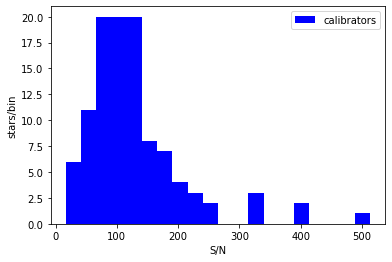

In [40]:
print(calall[28])
print(f"median S/N is {round(np.median(tar2[2]),2)}")
plt.figure(1) 
plt.hist(tar2[2],color='blue',bins = 20,label='calibrators')
plt.ylabel("stars/bin")
plt.xlabel("S/N")
plt.legend(loc="best")

There are 107 calibrators. The signal to noise is usually 100 or higher. That should be a good one.

In [41]:
#get feature axis number version and physical meaning (micron) and some statistic, 
res=np.zeros((8,3072))
for i in range(3072):
    res[0,i]=i
    res[1,i]= np.count_nonzero(x[i]==0)/c
    res[3,i]=1.92499995231628+i* 0.000187174489838071  #wavelength in micron 
    res[2,i]=np.mean(x[i])   
    res[4,i]=np.median(x[i])   
    res[5,i]=np.std(x[i])   
    res[6,i]=np.quantile(x[i],0.25)      
    res[7,i]=np.quantile(x[i],0.75)      

Plotting the full data.

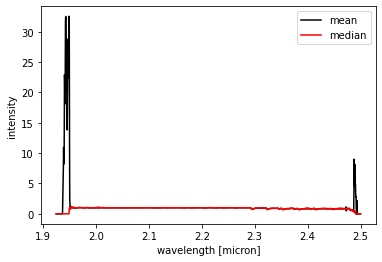

In [42]:
plt.plot(res[3],res[2],'-',color='black',label='mean')
plt.plot(res[3],res[4],'-',color='red',label='median')
plt.xlabel("wavelength [micron]")
plt.ylabel("intensity")
plt.legend(loc="best")


The very borders are obviously not good. Zooming in on the good data.

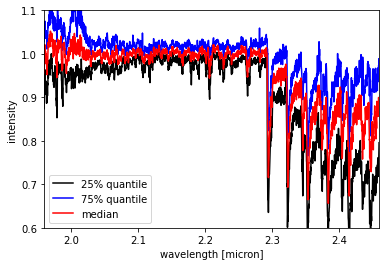

In [43]:
plt.plot(res[3],res[6],'-',color='black',label='25% quantile')
plt.plot(res[3],res[7],'-',color='blue',label='75% quantile')
plt.plot(res[3],res[4],'-',color='red',label='median')
plt.xlabel("wavelength [micron]")
plt.ylabel("intensity")
plt.xlim(1.96,2.46)
plt.ylim(0.6,1.1)
plt.legend(loc="best")


It is less clear what else is not good. We start with a conservative selection: we use 2.08 to 2.304 micron because the spectrum is normalized between about 2.08 and 2.29, and we still want to include the strongfeature at 2.295 micron. Also the scatter increase bewlow about 2.05 micron.

We select between 828 and 2025
(1197, 107)
(8, 1197)


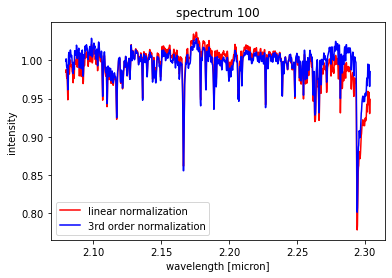

In [44]:
#selecting for normalized
low=np.argmin(abs(res[3]-2.08))
high=np.argmin(abs(res[3]-2.304))
print(f"We select between {low} and {high}")
xsel=x[low:high]
ressel=res[:,low:high] #propagate wavelength
print(np.shape(xsel))
#now selecting for normalized
lown=np.argmin(abs(resselb[3]-2.08))
highn=np.argmin(abs(resselb[3]-2.304))
xseln=xnorm[lown:highn]
#plot one spectrum with linear and 3rd order normalization to check whether normalization worked 
plt.plot(ressel[3],xsel[:,100],'-',color='red',label='linear normalization')
plt.plot(ressel[3],xseln[:,100],'-',color='blue',label='3rd order normalization')
plt.xlabel("wavelength [micron]")
plt.ylabel("intensity")
plt.title("spectrum 100")
#plt.xlim(2.29,2.30)
plt.legend(loc="best")
np.savetxt('calibrator_spectra_caseb_linear.txt', xsel)
np.savetxt('calibrator_spectra_caseb_3rdorder.txt', xseln)
#statistic of normalized data
resn2=np.zeros((8,np.shape(xseln)[0]))
for i in range(np.shape(xseln)[0]):
    resn2[0,i]=ressel[0,i]
    resn2[1,i]= np.count_nonzero(xseln[i]==0)/c
    resn2[3,i]=ressel[3,i]
    resn2[2,i]=np.mean(xseln[i])   
    resn2[4,i]=np.median(xseln[i])   
    resn2[5,i]=np.std(xseln[i])   
    resn2[6,i]=np.quantile(xseln[i],0.25)      
    resn2[7,i]=np.quantile(xseln[i],0.75) 
print(np.shape(resn2))  
np.savetxt('calibrator_statistic_caseb_3rdorder.txt', resn2)

Plotting the selected range with linear normalization.

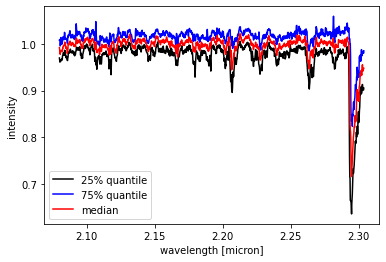

In [45]:
plt.plot(ressel[3],ressel[6],'-',color='black',label='25% quantile')
plt.plot(ressel[3],ressel[7],'-',color='blue',label='75% quantile')
plt.plot(ressel[3],ressel[4],'-',color='red',label='median')
plt.xlabel("wavelength [micron]")
plt.ylabel("intensity")
plt.legend(loc="best")


Looking on some examples. Also for checking for problems visually. 

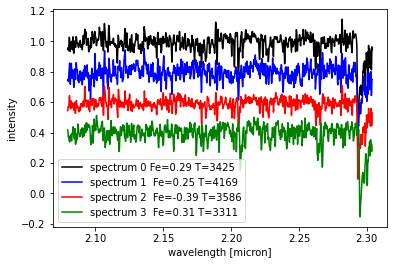

In [46]:
#plotting spectra to look for bad ones 
plt.plot(ressel[3],xseln[:,0],'-',color='black',label=f'spectrum 0 Fe={round(tar2[1,0],2)} T={round(tar2[3,0])}')
plt.plot(ressel[3],xseln[:,1]-0.2,'-',color='blue',label=f'spectrum 1  Fe={round(tar2[1,1],2)} T={round(tar2[3,1])}')
plt.plot(ressel[3],xseln[:,2]-0.4,'-',color='red',label=f'spectrum 2  Fe={round(tar2[1,2],2)} T={round(tar2[3,2])}')
plt.plot(ressel[3],xseln[:,3]-0.6,'-',color='green',label=f'spectrum 3  Fe={round(tar2[1,3],2)} T={round(tar2[3,3])}')
plt.xlabel("wavelength [micron]")
plt.ylabel("intensity")
plt.legend(loc="best")
#weak wave on no 0 
#other problmes using too many star derived labels, better clusters? to see wehther problem, 

In [ ]:
plt.plot(ressel[3],xseln[:,4],'-',color='black',label=f'spectrum 4 Fe={round(tar2[1,4],2)} T={round(tar2[3,4])}')
plt.plot(ressel[3],xseln[:,5]-0.2,'-',color='blue',label=f'spectrum 5  Fe={round(tar2[1,5],2)} T={round(tar2[3,5])}')
plt.plot(ressel[3],xseln[:,6]-0.4,'-',color='red',label=f'spectrum 6  Fe={round(tar2[1,6],2)} T={round(tar2[3,6])}')
plt.plot(ressel[3],xseln[:,7]-0.6,'-',color='green',label=f'spectrum 7  Fe={round(tar2[1,7],2)} T={round(tar2[3,7])}')
plt.xlabel("wavelength [micron]")
plt.ylabel("intensity")
plt.legend(loc="best")
#varying S/n likely matters

In [117]:
print(xsel[:1])
print(tar2[1])

[[0.93829933 0.95832723 0.91272559 1.00707833 0.93555888 0.91651975
  0.96645725 0.98046713 0.96910205 0.9877047  1.01593523 0.97515489
  1.02898509 0.96035841 0.96161081 0.99508943 0.94651846 1.00268271
  0.99207166 0.93462911 0.95859395 0.99377667 1.00052852 1.01497133
  0.97760846 0.98563827 1.05566874 0.97158056 0.99900861 1.00113744
  1.00632025 1.04721193 1.00209615 1.03579493 0.96948684 0.98234188
  0.95445413 1.00847516 0.92408955 0.91358793 0.99735702 0.88643094
  1.02762609 1.01668945 0.90899646 0.9851581  0.92918617 0.99889627
  0.96589622 1.05324252 0.95878598 1.00281857 1.11082099 0.97960126
  0.92662856 0.99128035 1.00489234 0.98505719 1.00795577 0.98917356
  0.98814474 0.98800438 0.99679079 1.00098237 0.98039822 1.03288144
  0.98551655 1.05332152 0.97118641 0.97170095 0.97011797 1.0051534
  1.0082887  0.95682296 0.96256361 1.00013951 1.05439642 1.0311298
  1.0023394  1.04105787 1.00389098 1.00579212 1.00553291 1.01939035
  1.0049958  1.03928684 1.03774351 1.01754416 0.98

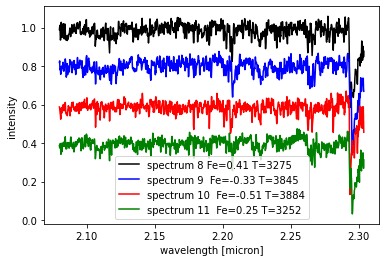

In [48]:
plt.plot(ressel[3],xseln[:,8],'-',color='black',label=f'spectrum 8 Fe={round(tar2[1,8],2)} T={round(tar2[3,8])}')
plt.plot(ressel[3],xseln[:,9]-0.2,'-',color='blue',label=f'spectrum 9  Fe={round(tar2[1,9],2)} T={round(tar2[3,9])}')
plt.plot(ressel[3],xseln[:,10]-0.4,'-',color='red',label=f'spectrum 10  Fe={round(tar2[1,10],2)} T={round(tar2[3,10])}')
plt.plot(ressel[3],xseln[:,11]-0.6,'-',color='green',label=f'spectrum 11  Fe={round(tar2[1,11],2)} T={round(tar2[3,11])}')
plt.xlabel("wavelength [micron]")
plt.ylabel("intensity")
plt.legend(loc="best")
#wave on 11 probably

In [49]:
#pca transformed data 
cal3p=np.loadtxt("calibrators_3rdorder_pca_transformed.txt")
cal1p=np.loadtxt("calibrators_linear_pca_transformed.txt")
#relative large test size because overall number is not large 
cal1p_train, cal1p_test, cal3p_train, cal3p_test, xsel_train, xsel_test, xseln_train, xseln_test, y_train, y_test, tar2_train, tar2_test  = train_test_split(cal1p,cal3p,np.transpose(xsel), np.transpose(xseln), tar2[1], np.transpose(tar2), test_size=0.3, random_state=42)
print(f"shape of features {np.shape(xsel_train)}")
print(f"shape of labels {np.shape(y_train)}")

shape of features (74, 1197)
shape of labels (74,)


In [50]:
#xgboost
modelx1 = xgb.XGBRegressor(n_estimators=1000, max_depth=7, eta=0.1, subsample=0.7, colsample_bytree=0.8)

In [51]:
modelx1.fit(xseln_train,y_train)


XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.8, enable_categorical=False,
             eta=0.1, gamma=0, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.100000001,
             max_delta_step=0, max_depth=7, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=1000, n_jobs=8,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=0.7,
             tree_method='exact', validate_parameters=1, verbosity=None)

standard deviation of training is 0.00025009914784303815
standard deviation of test is 0.38026649937359697


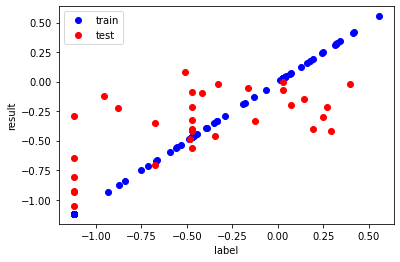

In [52]:
predtrainx1= modelx1.predict(xseln_train)
predtestx1 = modelx1.predict(xseln_test)
print(F"standard deviation of training is {np.std(y_train-predtrainx1)}")
print(F"standard deviation of test is {np.std(y_test-predtestx1)}")
plt.plot(y_train,predtrainx1,'o',color='blue',label='train')
plt.plot(y_test,predtestx1,'o',color='red',label='test')
plt.xlabel("label")
plt.ylabel("result")
plt.legend(loc="best")

This rather standard xgboost version is clearly overfitting the data. 

That below is the best case of the extrapolation below. 

In [53]:
modelx2 = xgb.XGBRegressor(n_estimators=1000, max_depth=7, eta=0.1, subsample=0.2, colsample_bytree=0.8)
modelx2.fit(xseln_train,y_train)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.8, enable_categorical=False,
             eta=0.1, gamma=0, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.100000001,
             max_delta_step=0, max_depth=7, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=1000, n_jobs=8,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=0.2,
             tree_method='exact', validate_parameters=1, verbosity=None)

standard deviation of training is 0.00035418626120872537
standard deviation of test is 0.33323777552512623


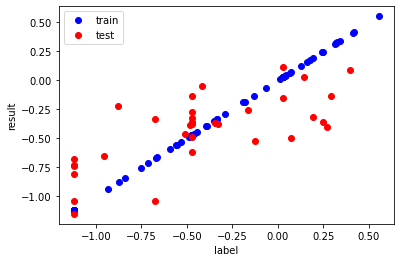

In [54]:
predtrainx2= modelx2.predict(xseln_train)
predtestx2 = modelx2.predict(xseln_test)
print(F"standard deviation of training is {np.std(y_train-predtrainx2)}")
print(F"standard deviation of test is {np.std(y_test-predtestx2)}")
plt.plot(y_train,predtrainx2,'o',color='blue',label='train')
plt.plot(y_test,predtestx2,'o',color='red',label='test')
plt.xlabel("label")
plt.ylabel("result")
plt.legend(loc="best")

In [55]:
resx2=np.zeros((3,70))
for i in range(70):
    print(i)
    sub=i/100+0.01
    resx2[0,i]=sub
    modelx2 = xgb.XGBRegressor(n_estimators=1000, max_depth=7, eta=0.1, subsample=sub, colsample_bytree=0.8)
    modelx2.fit(xseln_train,y_train)
    predtrainx2= modelx2.predict(xseln_train)
    predtestx2 = modelx2.predict(xseln_test)
    resx2[1,i]=np.std(y_train-predtrainx2)
    resx2[2,i]=np.std(y_test-predtestx2)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69


0.33323777552512623
0.2


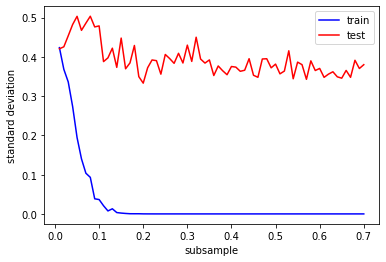

In [56]:
plt.plot(resx2[0,:],resx2[1,:],'-',color='blue',label='train')
plt.plot(resx2[0,:],resx2[2,:],'-',color='red',label='test')
plt.xlabel("subsample")
plt.ylabel("standard deviation")
plt.legend(loc="best")
print(min(resx2[2]))
print(resx2[0,np.argmin(resx2[2])])

Decreasing the subsample reduces the overfit as visible in the score for test, but at the same time the score for test is usually also getting worse. The fluctutation in are likely just random. A best value in test of 0.33 is also not particular good. It is not surprising that xgboost has problem with this data set which has clearly more information than we have labels. There we now average neighboring labels together. 

In [57]:
#combining 9 pixels
print(np.shape(xseln_train))
print(np.shape(xseln_test))
print(1197/9)
xseln9_train=np.zeros((74,133))
for i in range(np.shape(xseln_train)[0]):
    for j in range(133):
        xseln9_train[i,j]=np.mean(xseln_train[i,int(0+j*9):int(9*(j+1))])

xseln9_test=np.zeros((33,133))
for i in range(np.shape(xseln_test)[0]):
    for j in range(133):
        xseln9_test[i,j]=np.mean(xseln_test[i,int(0+j*9):int(9*(j+1))])     
#combing 19 pixels
print(1197/19)
xseln19_train=np.zeros((74,63))
for i in range(np.shape(xseln_train)[0]):
    for j in range(63):
        xseln19_train[i,j]=np.mean(xseln_train[i,int(0+j*19):int(19*(j+1))])

xseln19_test=np.zeros((33,63))
for i in range(np.shape(xseln_test)[0]):
    for j in range(63):
        xseln19_test[i,j]=np.mean(xseln_test[i,int(0+j*19):int(19*(j+1))])  
print("checking whether mean was preserved as it should")
print(f"mean of origunal data {np.mean(xseln_train)}")   
print(f"mean of 9 feature combination {np.mean(xseln9_train)}")
print(f"mean of 9 feature combination {np.mean(xseln19_train)}") 

(74, 1197)
(33, 1197)
133.0
63.0
checking whether mean was preserved as it should
mean of origunal data 0.9889698306156466
mean of 9 feature combination 0.9889698306156466
mean of 9 feature combination 0.9889698306156466


In [58]:
modelx2b = xgb.XGBRegressor(n_estimators=1000, max_depth=7, eta=0.1, subsample=0.2, colsample_bytree=0.8)
modelx2b.fit(xseln9_train,y_train)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=0.8, enable_categorical=False,
             eta=0.1, gamma=0, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.100000001,
             max_delta_step=0, max_depth=7, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=1000, n_jobs=8,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=0.2,
             tree_method='exact', validate_parameters=1, verbosity=None)

standard deviation of training is 0.0003691117465802432
standard deviation of test is 0.3884222423525378


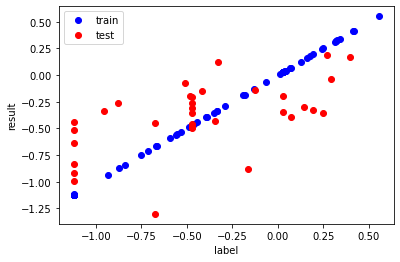

In [59]:
predtrainx2= modelx2b.predict(xseln9_train)
predtestx2 = modelx2b.predict(xseln9_test)
print(F"standard deviation of training is {np.std(y_train-predtrainx2)}")
print(F"standard deviation of test is {np.std(y_test-predtestx2)}")
plt.plot(y_train,predtrainx2,'o',color='blue',label='train')
plt.plot(y_test,predtestx2,'o',color='red',label='test')
plt.xlabel("label")
plt.ylabel("result")
plt.legend(loc="best")

In [60]:
modelx2c = xgb.XGBRegressor(n_estimators=1000, max_depth=7, eta=0.1, subsample=0.2, colsample_bytree=1.0)
modelx2c.fit(xseln19_train,y_train)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1.0, enable_categorical=False,
             eta=0.1, gamma=0, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.100000001,
             max_delta_step=0, max_depth=7, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=1000, n_jobs=8,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=1, scale_pos_weight=1, subsample=0.2,
             tree_method='exact', validate_parameters=1, verbosity=None)

standard deviation of training is 0.00044971725057026335
standard deviation of test is 0.41806703389168665


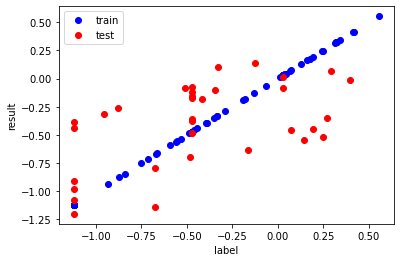

In [61]:
predtrainx2= modelx2c.predict(xseln19_train)
predtestx2 = modelx2c.predict(xseln19_test)
print(F"standard deviation of training is {np.std(y_train-predtrainx2)}")
print(F"standard deviation of test is {np.std(y_test-predtestx2)}")
plt.plot(y_train,predtrainx2,'o',color='blue',label='train')
plt.plot(y_test,predtestx2,'o',color='red',label='test')
plt.xlabel("label")
plt.ylabel("result")
plt.legend(loc="best")
#Jon Spline on PCAed data 
#see https://www.analyticsvidhya.com/blog/2018/03/introduction-regression-splines-python-codes/

Does not improve easily, it still overfits. Other parameters need to be explored.

In [62]:
modelx2c = xgb.XGBRegressor(n_estimators=1000, max_depth=7, eta=0.1, subsample=0.2, colsample_bytree=1.0, reg_lambda=300)
modelx2c.fit(xseln19_train,y_train)

XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1.0, enable_categorical=False,
             eta=0.1, gamma=0, gpu_id=-1, importance_type=None,
             interaction_constraints='', learning_rate=0.100000001,
             max_delta_step=0, max_depth=7, min_child_weight=1, missing=nan,
             monotone_constraints='()', n_estimators=1000, n_jobs=8,
             num_parallel_tree=1, predictor='auto', random_state=0, reg_alpha=0,
             reg_lambda=300, scale_pos_weight=1, subsample=0.2,
             tree_method='exact', validate_parameters=1, verbosity=None)

standard deviation of training is 0.30554887371551487
standard deviation of test is 0.39617954205113076


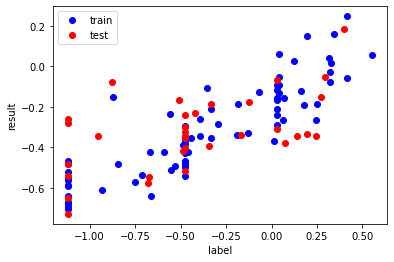

In [63]:
predtrainx2= modelx2c.predict(xseln19_train)
predtestx2 = modelx2c.predict(xseln19_test)
print(F"standard deviation of training is {np.std(y_train-predtrainx2)}")
print(F"standard deviation of test is {np.std(y_test-predtestx2)}")
plt.plot(y_train,predtrainx2,'o',color='blue',label='train')
plt.plot(y_test,predtestx2,'o',color='red',label='test')
plt.xlabel("label")
plt.ylabel("result")
plt.legend(loc="best")

It looks now better which larger regularization lambda but the scatter is large and it is also visisble the obtained results do not use the full range of the input labels. 

Likely a three is not the best approach in this case, because the data has more connections between neighboring features than assume by a three. Also not perfect normalization can possible be corrected by a neural network. Now we use a small neural network. 

In [95]:
model1 = Sequential(
    [              
        tf.keras.Input(shape=(1197,)),  
        Dense(3, activation="relu", name="layer1"),   
        Dense(1, activation = 'linear',name="layer2")
    ], name = "model1"
) 


In [96]:
model1.summary()

Model: "model1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 layer1 (Dense)              (None, 3)                 3594      
                                                                 
 layer2 (Dense)              (None, 1)                 4         
                                                                 
Total params: 3,598
Trainable params: 3,598
Non-trainable params: 0
_________________________________________________________________


In [97]:
model1.compile(
    loss=tf.keras.losses.MeanSquaredError(), 
    optimizer=tf.keras.optimizers.SGD(learning_rate=0.01),  #that is standard gradient, should be easier to controll
)
#SGD does also not work even learning rate of 0.999 gets into the same minimum just slower 
trainre=xsel_train[0:1197].reshape(74,1197) 
testre=xsel_test[0:1197].reshape(33,1197) 

In [98]:
#we use the full sample as batch size, since the data is small enough that it fits fats and the reduces variance 
#between different batches
trainre=xsel_train[0:1197].reshape(74,1197) 
testre=xsel_test[0:1197].reshape(33,1197) 
res1=np.zeros((6,40))
#tf.keras.utils.set_random_seed(1306)
for i in range(40):
    print(i)
    model1.fit(
        xsel_train,y_train,
        epochs=160,batch_size=74
        )
    prediction1tr = model1.predict(trainre)
    prediction1te = model1.predict(testre)
    res1[0,i]=i
    res1[1,i]=(i+1)*160
    res1[2,i]=np.std(y_train-prediction1tr[:,0])
    res1[3,i]=np.std(y_test-prediction1te[:,0])
    res1[4,i]=np.mean((y_train-prediction1tr[:,0])**2)
    res1[5,i]=np.mean((y_test-prediction1te[:,0])**2)                   

0
Epoch 1/160
1/1 [==============================] - 0s 198ms/step - loss: 0.3319
Epoch 2/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2798
Epoch 3/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2652
Epoch 4/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2496
Epoch 5/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2425
Epoch 6/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2376
Epoch 7/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2355
Epoch 8/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2342
Epoch 9/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2336
Epoch 10/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2332
Epoch 11/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2330
Epoch 12/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2329
Epoch 13/160
1/1 [==============================] - 0s 4m

1/1 [==============================] - 0s 4ms/step - loss: 0.2257
Epoch 105/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2256
Epoch 106/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2255
Epoch 107/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2254
Epoch 108/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2253
Epoch 109/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2252
Epoch 110/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2252
Epoch 111/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2251
Epoch 112/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2250
Epoch 113/160
1/1 [==============================] - 0s 8ms/step - loss: 0.2249
Epoch 114/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2248
Epoch 115/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2247
Epoch 116/160
1/1 [==============================] - 0

Epoch 46/160
1/1 [==============================] - 0s 4ms/step - loss: 0.2160
Epoch 47/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2159
Epoch 48/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2158
Epoch 49/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2157
Epoch 50/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2155
Epoch 51/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2154
Epoch 52/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2153
Epoch 53/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2152
Epoch 54/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2151
Epoch 55/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2150
Epoch 56/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2148
Epoch 57/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2147
Epoch 58/160
1/1 [==============================] - 

1/1 [==============================] - 0s 7ms/step - loss: 0.2296
Epoch 150/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2296
Epoch 151/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2295
Epoch 152/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2295
Epoch 153/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2295
Epoch 154/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2295
Epoch 155/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2295
Epoch 156/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2295
Epoch 157/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2295
Epoch 158/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2295
Epoch 159/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2294
Epoch 160/160
2/2 [==============================] - 0s 2ms/step
2
Epoch 1/160
1/1 [==============================] - 0s 5ms/step - lo

1/1 [==============================] - 0s 7ms/step - loss: 0.2281
Epoch 92/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2281
Epoch 93/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2280
Epoch 94/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2280
Epoch 95/160
1/1 [==============================] - 0s 8ms/step - loss: 0.2280
Epoch 96/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2280
Epoch 97/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2280
Epoch 98/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2279
Epoch 99/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2279
Epoch 100/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2279
Epoch 101/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2279
Epoch 102/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2279
Epoch 103/160
1/1 [==============================] - 0s 7ms/st

1/1 [==============================] - 0s 5ms/step - loss: 0.2256
Epoch 33/160
1/1 [==============================] - 0s 8ms/step - loss: 0.2256
Epoch 34/160
1/1 [==============================] - 0s 8ms/step - loss: 0.2255
Epoch 35/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2255
Epoch 36/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2255
Epoch 37/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2254
Epoch 38/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2254
Epoch 39/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2254
Epoch 40/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2253
Epoch 41/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2253
Epoch 42/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2253
Epoch 43/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2252
Epoch 44/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 4ms/step - loss: 0.2210
Epoch 136/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2209
Epoch 137/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2209
Epoch 138/160
1/1 [==============================] - 0s 8ms/step - loss: 0.2208
Epoch 139/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2208
Epoch 140/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2207
Epoch 141/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2206
Epoch 142/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2206
Epoch 143/160
1/1 [==============================] - 0s 4ms/step - loss: 0.2205
Epoch 144/160
1/1 [==============================] - 0s 8ms/step - loss: 0.2205
Epoch 145/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2204
Epoch 146/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2203
Epoch 147/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 5ms/step - loss: 0.2127
Epoch 78/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2126
Epoch 79/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2125
Epoch 80/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2124
Epoch 81/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2123
Epoch 82/160
1/1 [==============================] - 0s 8ms/step - loss: 0.2122
Epoch 83/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2121
Epoch 84/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2120
Epoch 85/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2119
Epoch 86/160
1/1 [==============================] - 0s 8ms/step - loss: 0.2118
Epoch 87/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2116
Epoch 88/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2115
Epoch 89/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 5ms/step - loss: 0.1991
Epoch 19/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1989
Epoch 20/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1987
Epoch 21/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1985
Epoch 22/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1984
Epoch 23/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1982
Epoch 24/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1980
Epoch 25/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1979
Epoch 26/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1977
Epoch 27/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1975
Epoch 28/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1974
Epoch 29/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1972
Epoch 30/160
1/1 [==============================] - 0s 7ms/step -

1/1 [==============================] - 0s 5ms/step - loss: 0.2371
Epoch 122/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2369
Epoch 123/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2367
Epoch 124/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2365
Epoch 125/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2363
Epoch 126/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2362
Epoch 127/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2360
Epoch 128/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2358
Epoch 129/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2357
Epoch 130/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2355
Epoch 131/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2354
Epoch 132/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2352
Epoch 133/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 7ms/step - loss: 0.2320
Epoch 64/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2320
Epoch 65/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2320
Epoch 66/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 67/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 68/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 69/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 70/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 71/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 72/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 73/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 74/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 75/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 5/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 6/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 7/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 8/160
1/1 [==============================] - 0s 17ms/step - loss: 0.2319
Epoch 9/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 10/160
1/1 [==============================] - 0s 8ms/step - loss: 0.2319
Epoch 11/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 12/160
1/1 [==============================] - 0s 8ms/step - loss: 0.2319
Epoch 13/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 14/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 15/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 16/160
1/1 [==============================] - 0s 7ms/step - los

1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 108/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 109/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 110/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 111/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 112/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 113/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 114/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 115/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 116/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 117/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 118/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 119/160
1/1 [==============================] - 0

Epoch 49/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 50/160
1/1 [==============================] - 0s 4ms/step - loss: 0.2319
Epoch 51/160
1/1 [==============================] - 0s 4ms/step - loss: 0.2319
Epoch 52/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 53/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 54/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 55/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 56/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 57/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 58/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 59/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 60/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 61/160
1/1 [==============================] - 

1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 153/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 154/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 155/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 156/160
1/1 [==============================] - 0s 8ms/step - loss: 0.2319
Epoch 157/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 158/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 159/160
1/1 [==============================] - 0s 8ms/step - loss: 0.2319
Epoch 160/160
2/2 [==============================] - 0s 3ms/step
9
Epoch 1/160
1/1 [==============================] - 0s 8ms/step - loss: 0.2319
Epoch 2/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 3/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 4/160
1/1 [==============================] - 0s 6ms/step - loss: 0.

1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 95/160
1/1 [==============================] - 0s 4ms/step - loss: 0.2319
Epoch 96/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 97/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 98/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 99/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 100/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 101/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 102/160
1/1 [==============================] - 0s 8ms/step - loss: 0.2319
Epoch 103/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 104/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 105/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 106/160
1/1 [==============================] - 0s 7ms

1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 36/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 37/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 38/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 39/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 40/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 41/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 42/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 43/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 44/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 45/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 46/160
1/1 [==============================] - 0s 3ms/step - loss: 0.2319
Epoch 47/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 139/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 140/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 141/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 142/160
1/1 [==============================] - 0s 4ms/step - loss: 0.2319
Epoch 143/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 144/160
1/1 [==============================] - 0s 4ms/step - loss: 0.2319
Epoch 145/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 146/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 147/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 148/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 149/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 150/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 81/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 82/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 83/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 84/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 85/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 86/160
1/1 [==============================] - 0s 4ms/step - loss: 0.2319
Epoch 87/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 88/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 89/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 90/160
1/1 [==============================] - 0s 4ms/step - loss: 0.2319
Epoch 91/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 92/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 22/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 23/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 24/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 25/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 26/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 27/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 28/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 29/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 30/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 31/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 32/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 33/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 125/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 126/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 127/160
1/1 [==============================] - 0s 9ms/step - loss: 0.2319
Epoch 128/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 129/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 130/160
1/1 [==============================] - 0s 4ms/step - loss: 0.2319
Epoch 131/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 132/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 133/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 134/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 135/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 136/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 67/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 68/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 69/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 70/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 71/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 72/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 73/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 74/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 75/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 76/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 77/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 78/160
1/1 [==============================] - 0s 5ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 8/160
1/1 [==============================] - 0s 8ms/step - loss: 0.2319
Epoch 9/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 10/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 11/160
1/1 [==============================] - 0s 4ms/step - loss: 0.2319
Epoch 12/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 13/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 14/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 15/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 16/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 17/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 18/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 19/160
1/1 [==============================] - 0s 7ms/step - l

1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 111/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 112/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 113/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 114/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 115/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 116/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 117/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 118/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 119/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 120/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 121/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 122/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 53/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 54/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 55/160
1/1 [==============================] - 0s 4ms/step - loss: 0.2319
Epoch 56/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 57/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 58/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 59/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 60/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 61/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 62/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 63/160
1/1 [==============================] - 0s 4ms/step - loss: 0.2319
Epoch 64/160
1/1 [==============================] - 0s 5ms/step -

1/1 [==============================] - 0s 8ms/step - loss: 0.2319
Epoch 156/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 157/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 158/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 159/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 160/160
2/2 [==============================] - 0s 2ms/step
16
Epoch 1/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 2/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 3/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 4/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 5/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 6/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 7/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319


1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 98/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 99/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 100/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 101/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 102/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 103/160
1/1 [==============================] - 0s 8ms/step - loss: 0.2319
Epoch 104/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 105/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 106/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 107/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 108/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 109/160
1/1 [==============================] - 0s 

1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 39/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 40/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 41/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 42/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 43/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 44/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 45/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 46/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 47/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 48/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 49/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 50/160
1/1 [==============================] - 0s 5ms/step -

1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 142/160
1/1 [==============================] - 0s 4ms/step - loss: 0.2319
Epoch 143/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 144/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 145/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 146/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 147/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 148/160
1/1 [==============================] - 0s 11ms/step - loss: 0.2319
Epoch 149/160
1/1 [==============================] - 0s 4ms/step - loss: 0.2319
Epoch 150/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 151/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 152/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 153/160
1/1 [==============================] - 

1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 84/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 85/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 86/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 87/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 88/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 89/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 90/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 91/160
1/1 [==============================] - 0s 4ms/step - loss: 0.2319
Epoch 92/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 93/160
1/1 [==============================] - 0s 4ms/step - loss: 0.2319
Epoch 94/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 95/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 25/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 26/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 27/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 28/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 29/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 30/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 31/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 32/160
1/1 [==============================] - 0s 8ms/step - loss: 0.2319
Epoch 33/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 34/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 35/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 36/160
1/1 [==============================] - 0s 7ms/step -

1/1 [==============================] - 0s 9ms/step - loss: 0.2319
Epoch 128/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 129/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 130/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 131/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 132/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 133/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 134/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 135/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 136/160
1/1 [==============================] - 0s 8ms/step - loss: 0.2319
Epoch 137/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 138/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 139/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 4ms/step - loss: 0.2319
Epoch 70/160
1/1 [==============================] - 0s 8ms/step - loss: 0.2319
Epoch 71/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 72/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 73/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 74/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 75/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 76/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 77/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 78/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 79/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 80/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 81/160
1/1 [==============================] - 0s 7ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 11/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 12/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 13/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 14/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 15/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 16/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 17/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 18/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 19/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 20/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 21/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 22/160
1/1 [==============================] - 0s 7ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 114/160
1/1 [==============================] - 0s 4ms/step - loss: 0.2319
Epoch 115/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 116/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 117/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 118/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 119/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 120/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 121/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 122/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 123/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 124/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 125/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 56/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 57/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 58/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 59/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 60/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 61/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 62/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 63/160
1/1 [==============================] - 0s 8ms/step - loss: 0.2319
Epoch 64/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 65/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 66/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 67/160
1/1 [==============================] - 0s 7ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 159/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 160/160
2/2 [==============================] - 0s 2ms/step
23
Epoch 1/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 2/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 3/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 4/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 5/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 6/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 7/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 8/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 9/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 10/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch

1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 101/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 102/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 103/160
1/1 [==============================] - 0s 4ms/step - loss: 0.2319
Epoch 104/160
1/1 [==============================] - 0s 4ms/step - loss: 0.2319
Epoch 105/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 106/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 107/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 108/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 109/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 110/160
1/1 [==============================] - 0s 4ms/step - loss: 0.2319
Epoch 111/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 112/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 42/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 43/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 44/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 45/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 46/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 47/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 48/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 49/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 50/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 51/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 52/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 53/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 145/160
1/1 [==============================] - 0s 9ms/step - loss: 0.2319
Epoch 146/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 147/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 148/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 149/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 150/160
1/1 [==============================] - 0s 8ms/step - loss: 0.2319
Epoch 151/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 152/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 153/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 154/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 155/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 156/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 9ms/step - loss: 0.2319
Epoch 87/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 88/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 89/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 90/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 91/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 92/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 93/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 94/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 95/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 96/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 97/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 98/160
1/1 [==============================] - 0s 5ms/step -

1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 28/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 29/160
1/1 [==============================] - 0s 8ms/step - loss: 0.2319
Epoch 30/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 31/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 32/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 33/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 34/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 35/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 36/160
1/1 [==============================] - 0s 4ms/step - loss: 0.2319
Epoch 37/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 38/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 39/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 131/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 132/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 133/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 134/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 135/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 136/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 137/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 138/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 139/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 140/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 141/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 142/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 73/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 74/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 75/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 76/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 77/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 78/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 79/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 80/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 81/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 82/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 83/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 84/160
1/1 [==============================] - 0s 11ms/step 

1/1 [==============================] - 0s 8ms/step - loss: 0.2319
Epoch 14/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 15/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 16/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 17/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 18/160
1/1 [==============================] - 0s 8ms/step - loss: 0.2319
Epoch 19/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 20/160
1/1 [==============================] - 0s 8ms/step - loss: 0.2319
Epoch 21/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 22/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 23/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 24/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 25/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 117/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 118/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 119/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 120/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 121/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 122/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 123/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 124/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 125/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 126/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 127/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 128/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 59/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 60/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 61/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 62/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 63/160
1/1 [==============================] - 0s 8ms/step - loss: 0.2319
Epoch 64/160
1/1 [==============================] - 0s 9ms/step - loss: 0.2319
Epoch 65/160
1/1 [==============================] - 0s 8ms/step - loss: 0.2319
Epoch 66/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 67/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 68/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 69/160
1/1 [==============================] - 0s 9ms/step - loss: 0.2319
Epoch 70/160
1/1 [==============================] - 0s 6ms/step -

2/2 [==============================] - 0s 2ms/step
30
Epoch 1/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 2/160
1/1 [==============================] - 0s 8ms/step - loss: 0.2319
Epoch 3/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 4/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 5/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 6/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 7/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 8/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 9/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 10/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 11/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 12/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 1

1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 104/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 105/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 106/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 107/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 108/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 109/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 110/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 111/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 112/160
1/1 [==============================] - 0s 4ms/step - loss: 0.2319
Epoch 113/160
1/1 [==============================] - 0s 8ms/step - loss: 0.2319
Epoch 114/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 115/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 4ms/step - loss: 0.2319
Epoch 45/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 46/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 47/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 48/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 49/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 50/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 51/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 52/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 53/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 54/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 55/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 56/160
1/1 [==============================] - 0s 5ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 148/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 149/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 150/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 151/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 152/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 153/160
1/1 [==============================] - 0s 8ms/step - loss: 0.2319
Epoch 154/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 155/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 156/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 157/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 158/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 159/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 4ms/step - loss: 0.2319
Epoch 90/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 91/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 92/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 93/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 94/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 95/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 96/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 97/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 98/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 99/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 100/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 101/160
1/1 [==============================] - 0s 7ms/step

1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 31/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 32/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 33/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 34/160
1/1 [==============================] - 0s 8ms/step - loss: 0.2319
Epoch 35/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 36/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 37/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 38/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 39/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 40/160
1/1 [==============================] - 0s 4ms/step - loss: 0.2319
Epoch 41/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 42/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 4ms/step - loss: 0.2319
Epoch 134/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 135/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 136/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 137/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 138/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 139/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 140/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 141/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 142/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 143/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 144/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 145/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 76/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 77/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 78/160
1/1 [==============================] - 0s 4ms/step - loss: 0.2319
Epoch 79/160
1/1 [==============================] - 0s 4ms/step - loss: 0.2319
Epoch 80/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 81/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 82/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 83/160
1/1 [==============================] - 0s 4ms/step - loss: 0.2319
Epoch 84/160
1/1 [==============================] - 0s 4ms/step - loss: 0.2319
Epoch 85/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 86/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 87/160
1/1 [==============================] - 0s 4ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 17/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 18/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 19/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 20/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 21/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 22/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 23/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 24/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 25/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 26/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 27/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 28/160
1/1 [==============================] - 0s 5ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 120/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 121/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 122/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 123/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 124/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 125/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 126/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 127/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 128/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 129/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 130/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 131/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 62/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 63/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 64/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 65/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 66/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 67/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 68/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 69/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 70/160
1/1 [==============================] - 0s 8ms/step - loss: 0.2319
Epoch 71/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 72/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 73/160
1/1 [==============================] - 0s 5ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 3/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 4/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 5/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 6/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 7/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 8/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 9/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 10/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 11/160
1/1 [==============================] - 0s 8ms/step - loss: 0.2319
Epoch 12/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 13/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 14/160
1/1 [==============================] - 0s 4ms/step - loss: 

1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 106/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 107/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 108/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 109/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 110/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 111/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 112/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 113/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 114/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 115/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 116/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 117/160
1/1 [==============================] - 0

Epoch 47/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 48/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 49/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 50/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 51/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 52/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 53/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 54/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 55/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 56/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 57/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 58/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 59/160
1/1 [==============================] - 

1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 151/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 152/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 153/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 154/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 155/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 156/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 157/160
1/1 [==============================] - 0s 4ms/step - loss: 0.2319
Epoch 158/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 159/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 160/160
2/2 [==============================] - 0s 3ms/step
39
Epoch 1/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 2/160
1/1 [==============================] - 0s 6ms/step - los

1/1 [==============================] - 0s 8ms/step - loss: 0.2319
Epoch 93/160
1/1 [==============================] - 0s 8ms/step - loss: 0.2319
Epoch 94/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 95/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 96/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 97/160
1/1 [==============================] - 0s 9ms/step - loss: 0.2319
Epoch 98/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 99/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 100/160
1/1 [==============================] - 0s 11ms/step - loss: 0.2319
Epoch 101/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 102/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2319
Epoch 103/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 104/160
1/1 [==============================] - 0s 8ms/

Currently and often predicts the same for all. That is local minnimum. Results seem to depend on 
which random number the fit starts. 

2/2 [==============================] - 0s 2ms/step


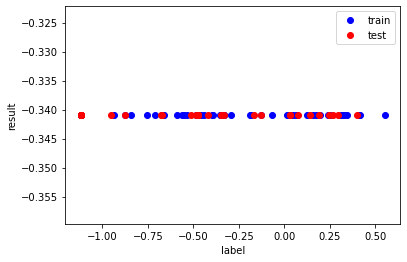

In [99]:
#often predicts just the same for all 
#np.savetxt("met_nn_v1_f2.txt",res1) #was better but jumped out again 
np.savetxt("met_nn_v1_f3.txt",res1)
prediction1tr = model1.predict(trainre)
prediction1te = model1.predict(testre)
plt.plot(y_train,prediction1tr,'o',color='blue',label='train')
plt.plot(y_test,prediction1te,'o',color='red',label='test')
plt.xlabel("label")
plt.ylabel("result")
plt.legend(loc="best")


In [102]:
print(f"standard deviation of train is {np.std(y_train-prediction1tr[:,0])}")
print(f"standard deviation of test is {np.std(y_test-prediction1te[:,0])}")
print(f"MSE of train is {np.mean((y_train-prediction1tr[:,0])**2)}")
print(f"MSE of test is {np.mean((y_test-prediction1te[:,0])**2)}")

standard deviation of train is 0.48153228034901996
standard deviation of test is 0.46719958989260685
MSE of train is 0.23187333701860918
MSE of test is 0.2248353052980955


The standard deviation is the usual measure in astronomy. A past (very different) calibration of me achieved a standard deviation of 0.32.  

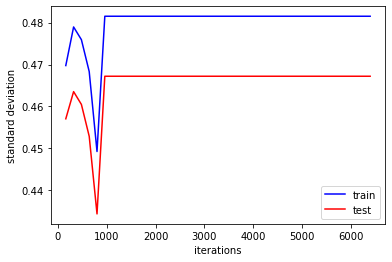

In [103]:
plt.plot(res1[1,:],res1[2,:],'-',color='blue',label='train')
plt.plot(res1[1,:],res1[3,:],'-',color='red',label='test')
plt.xlabel("iterations")
plt.ylabel("standard deviation")
plt.legend(loc="best")

We scale now the data to see whether the fit is then less ofteh trapped in this local minimum. 

In [104]:
scaler = preprocessing.StandardScaler().fit(xsel_train)
xsel_trainscaled = scaler.transform(xsel_train)
xsel_testscaled = scaler.transform(xsel_test)

In [105]:
model1b = Sequential(
    [              
        tf.keras.Input(shape=(1197,)),  
        Dense(3, activation="relu", name="layer1"),   
        Dense(1, activation = 'linear',name="layer2")
    ], name = "model1b"
) 
model1b.summary()

Model: "model1b"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 layer1 (Dense)              (None, 3)                 3594      
                                                                 
 layer2 (Dense)              (None, 1)                 4         
                                                                 
Total params: 3,598
Trainable params: 3,598
Non-trainable params: 0
_________________________________________________________________


In [106]:
model1b.compile(
    loss=tf.keras.losses.MeanSquaredError(), 
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.01),  
)

In [107]:
#we use the full sample as batch size, since the data is small enough that it fits fats and the reduces variance 
#between different batches
trainresc=xsel_trainscaled[0:1197].reshape(74,1197) 
testresc=xsel_testscaled[0:1197].reshape(33,1197) 
res1b=np.zeros((6,100))
#tf.keras.utils.set_random_seed(1306)
for i in range(100):
    print(i)
    model1b.fit(
        xsel_trainscaled,y_train,
        epochs=20,batch_size=74
        )
    prediction1btr = model1b.predict(trainresc)
    prediction1bte = model1b.predict(testresc)
    res1b[0,i]=i
    res1b[1,i]=(i+1)*10
    res1b[2,i]=np.std(y_train-prediction1btr[:,0])
    res1b[3,i]=np.std(y_test-prediction1bte[:,0])
    res1b[4,i]=np.mean((y_train-prediction1btr[:,0])**2)
    res1b[5,i]=np.mean((y_test-prediction1bte[:,0])**2)   
#is really slow when results are collected at every step    

0
Epoch 1/20
1/1 [==============================] - 0s 223ms/step - loss: 0.7524
Epoch 2/20
1/1 [==============================] - 0s 5ms/step - loss: 0.4272
Epoch 3/20
1/1 [==============================] - 0s 6ms/step - loss: 0.4976
Epoch 4/20
1/1 [==============================] - 0s 6ms/step - loss: 0.4460
Epoch 5/20
1/1 [==============================] - 0s 6ms/step - loss: 0.3058
Epoch 6/20
1/1 [==============================] - 0s 9ms/step - loss: 0.2842
Epoch 7/20
1/1 [==============================] - 0s 6ms/step - loss: 0.2587
Epoch 8/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1832
Epoch 9/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1280
Epoch 10/20
1/1 [==============================] - 0s 8ms/step - loss: 0.0903
Epoch 11/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0656
Epoch 12/20
1/1 [==============================] - 0s 5ms/step - loss: 0.0628
Epoch 13/20
1/1 [==============================] - 0s 7ms/step - loss

2/2 [==============================] - 0s 2ms/step
5
Epoch 1/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0091
Epoch 2/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0090
Epoch 3/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0089
Epoch 4/20
1/1 [==============================] - 0s 4ms/step - loss: 0.0088
Epoch 5/20
1/1 [==============================] - 0s 9ms/step - loss: 0.0088
Epoch 6/20
1/1 [==============================] - 0s 5ms/step - loss: 0.0087
Epoch 7/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0086
Epoch 8/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0086
Epoch 9/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0085
Epoch 10/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0084
Epoch 11/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0083
Epoch 12/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0082
Epoch 13/20
1/1 [===

Epoch 20/20
2/2 [==============================] - 0s 2ms/step
10
Epoch 1/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0073
Epoch 2/20
1/1 [==============================] - 0s 5ms/step - loss: 0.0073
Epoch 3/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0073
Epoch 4/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0073
Epoch 5/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0073
Epoch 6/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0073
Epoch 7/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0073
Epoch 8/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0073
Epoch 9/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0073
Epoch 10/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0073
Epoch 11/20
1/1 [==============================] - 0s 8ms/step - loss: 0.0073
Epoch 12/20
1/1 [==============================] - 0s 5ms/step - loss: 0.0073
Epoch 1

1/1 [==============================] - 0s 8ms/step - loss: 0.0073
Epoch 19/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0073
Epoch 20/20
2/2 [==============================] - 0s 2ms/step
15
Epoch 1/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0073
Epoch 2/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0073
Epoch 3/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0073
Epoch 4/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0073
Epoch 5/20
1/1 [==============================] - 0s 5ms/step - loss: 0.0073
Epoch 6/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0073
Epoch 7/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0073
Epoch 8/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0073
Epoch 9/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0073
Epoch 10/20
1/1 [==============================] - 0s 9ms/step - loss: 0.0073
Epoch 11/20
1/1 [==

1/1 [==============================] - 0s 6ms/step - loss: 0.0073
Epoch 18/20
1/1 [==============================] - 0s 5ms/step - loss: 0.0073
Epoch 19/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0073
Epoch 20/20
2/2 [==============================] - 0s 3ms/step
20
Epoch 1/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0073
Epoch 2/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0073
Epoch 3/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0073
Epoch 4/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0073
Epoch 5/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0073
Epoch 6/20
1/1 [==============================] - 0s 5ms/step - loss: 0.0073
Epoch 7/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0073
Epoch 8/20
1/1 [==============================] - 0s 5ms/step - loss: 0.0073
Epoch 9/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0073
Epoch 10/20
1/1 [==

1/1 [==============================] - 0s 6ms/step - loss: 0.0073
Epoch 17/20
1/1 [==============================] - 0s 4ms/step - loss: 0.0073
Epoch 18/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0073
Epoch 19/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0073
Epoch 20/20
2/2 [==============================] - 0s 2ms/step
25
Epoch 1/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0073
Epoch 2/20
1/1 [==============================] - 0s 5ms/step - loss: 0.0073
Epoch 3/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0073
Epoch 4/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0073
Epoch 5/20
1/1 [==============================] - 0s 8ms/step - loss: 0.0073
Epoch 6/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0073
Epoch 7/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0073
Epoch 8/20
1/1 [==============================] - 0s 5ms/step - loss: 0.0073
Epoch 9/20
1/1 [==

1/1 [==============================] - 0s 6ms/step - loss: 0.0073
Epoch 16/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0073
Epoch 17/20
1/1 [==============================] - 0s 5ms/step - loss: 0.0073
Epoch 18/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0073
Epoch 19/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0073
Epoch 20/20
2/2 [==============================] - 0s 2ms/step
30
Epoch 1/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0073
Epoch 2/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0073
Epoch 3/20
1/1 [==============================] - 0s 9ms/step - loss: 0.0073
Epoch 4/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0073
Epoch 5/20
1/1 [==============================] - 0s 5ms/step - loss: 0.0073
Epoch 6/20
1/1 [==============================] - 0s 5ms/step - loss: 0.0073
Epoch 7/20
1/1 [==============================] - 0s 5ms/step - loss: 0.0073
Epoch 8/20
1/1 [=

1/1 [==============================] - 0s 6ms/step - loss: 0.0073
Epoch 15/20
1/1 [==============================] - 0s 5ms/step - loss: 0.0073
Epoch 16/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0073
Epoch 17/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0073
Epoch 18/20
1/1 [==============================] - 0s 5ms/step - loss: 0.0073
Epoch 19/20
1/1 [==============================] - 0s 8ms/step - loss: 0.0073
Epoch 20/20
2/2 [==============================] - 0s 2ms/step
35
Epoch 1/20
1/1 [==============================] - 0s 5ms/step - loss: 0.0073
Epoch 2/20
1/1 [==============================] - 0s 5ms/step - loss: 0.0073
Epoch 3/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0073
Epoch 4/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0073
Epoch 5/20
1/1 [==============================] - 0s 5ms/step - loss: 0.0073
Epoch 6/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0073
Epoch 7/20
1/1 [

1/1 [==============================] - 0s 6ms/step - loss: 0.0073
Epoch 14/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0073
Epoch 15/20
1/1 [==============================] - 0s 5ms/step - loss: 0.0073
Epoch 16/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0073
Epoch 17/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0073
Epoch 18/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0073
Epoch 19/20
1/1 [==============================] - 0s 5ms/step - loss: 0.0073
Epoch 20/20
2/2 [==============================] - 0s 3ms/step
40
Epoch 1/20
1/1 [==============================] - 0s 5ms/step - loss: 0.0073
Epoch 2/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0073
Epoch 3/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0073
Epoch 4/20
1/1 [==============================] - 0s 8ms/step - loss: 0.0073
Epoch 5/20
1/1 [==============================] - 0s 4ms/step - loss: 0.0073
Epoch 6/20
1/1 

1/1 [==============================] - 0s 8ms/step - loss: 0.0073
Epoch 13/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0073
Epoch 14/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0073
Epoch 15/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0073
Epoch 16/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0073
Epoch 17/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0073
Epoch 18/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0073
Epoch 19/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0073
Epoch 20/20
2/2 [==============================] - 0s 3ms/step
45
Epoch 1/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0073
Epoch 2/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0073
Epoch 3/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0073
Epoch 4/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0073
Epoch 5/20
1/1

1/1 [==============================] - 0s 5ms/step - loss: 0.0092
Epoch 12/20
1/1 [==============================] - 0s 8ms/step - loss: 0.0110
Epoch 13/20
1/1 [==============================] - 0s 5ms/step - loss: 0.0106
Epoch 14/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0106
Epoch 15/20
1/1 [==============================] - 0s 5ms/step - loss: 0.0107
Epoch 16/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0107
Epoch 17/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0104
Epoch 18/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0105
Epoch 19/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0105
Epoch 20/20
2/2 [==============================] - 0s 4ms/step
50
Epoch 1/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0104
Epoch 2/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0102
Epoch 3/20
1/1 [==============================] - 0s 8ms/step - loss: 0.0102
Epoch 4/20
1/

1/1 [==============================] - 0s 7ms/step - loss: 0.0075
Epoch 11/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0075
Epoch 12/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0075
Epoch 13/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0075
Epoch 14/20
1/1 [==============================] - 0s 8ms/step - loss: 0.0075
Epoch 15/20
1/1 [==============================] - 0s 5ms/step - loss: 0.0075
Epoch 16/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0075
Epoch 17/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0075
Epoch 18/20
1/1 [==============================] - 0s 5ms/step - loss: 0.0075
Epoch 19/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0075
Epoch 20/20
2/2 [==============================] - 0s 3ms/step
55
Epoch 1/20
1/1 [==============================] - 0s 5ms/step - loss: 0.0075
Epoch 2/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0075
Epoch 3/20
1

1/1 [==============================] - 0s 8ms/step - loss: 0.0075
Epoch 10/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0075
Epoch 11/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0075
Epoch 12/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0075
Epoch 13/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0075
Epoch 14/20
1/1 [==============================] - 0s 8ms/step - loss: 0.0075
Epoch 15/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0075
Epoch 16/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0075
Epoch 17/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0075
Epoch 18/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0075
Epoch 19/20
1/1 [==============================] - 0s 5ms/step - loss: 0.0075
Epoch 20/20
2/2 [==============================] - 0s 4ms/step
60
Epoch 1/20
1/1 [==============================] - 0s 5ms/step - loss: 0.0075
Epoch 2/20


1/1 [==============================] - 0s 6ms/step - loss: 0.0075
Epoch 9/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0075
Epoch 10/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0075
Epoch 11/20
1/1 [==============================] - 0s 10ms/step - loss: 0.0075
Epoch 12/20
1/1 [==============================] - 0s 8ms/step - loss: 0.0075
Epoch 13/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0075
Epoch 14/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0075
Epoch 15/20
1/1 [==============================] - 0s 4ms/step - loss: 0.0075
Epoch 16/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0075
Epoch 17/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0075
Epoch 18/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0075
Epoch 19/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0075
Epoch 20/20
2/2 [==============================] - 0s 2ms/step
65
Epoch 1/20

Epoch 7/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0075
Epoch 8/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0075
Epoch 9/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0075
Epoch 10/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0075
Epoch 11/20
1/1 [==============================] - 0s 5ms/step - loss: 0.0075
Epoch 12/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0075
Epoch 13/20
1/1 [==============================] - 0s 5ms/step - loss: 0.0075
Epoch 14/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0075
Epoch 15/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0075
Epoch 16/20
1/1 [==============================] - 0s 8ms/step - loss: 0.0075
Epoch 17/20
1/1 [==============================] - 0s 8ms/step - loss: 0.0075
Epoch 18/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0075
Epoch 19/20
1/1 [==============================] - 0s 6ms/step - lo

1/1 [==============================] - 0s 6ms/step - loss: 0.0075
Epoch 6/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0075
Epoch 7/20
1/1 [==============================] - 0s 8ms/step - loss: 0.0075
Epoch 8/20
1/1 [==============================] - 0s 4ms/step - loss: 0.0075
Epoch 9/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0075
Epoch 10/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0075
Epoch 11/20
1/1 [==============================] - 0s 5ms/step - loss: 0.0075
Epoch 12/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0075
Epoch 13/20
1/1 [==============================] - 0s 8ms/step - loss: 0.0075
Epoch 14/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0075
Epoch 15/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0075
Epoch 16/20
1/1 [==============================] - 0s 5ms/step - loss: 0.0075
Epoch 17/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0075
Ep

1/1 [==============================] - 0s 10ms/step - loss: 0.0075
Epoch 5/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0075
Epoch 6/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0075
Epoch 7/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0075
Epoch 8/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0075
Epoch 9/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0075
Epoch 10/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0075
Epoch 11/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0075
Epoch 12/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0075
Epoch 13/20
1/1 [==============================] - 0s 8ms/step - loss: 0.0075
Epoch 14/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0075
Epoch 15/20
1/1 [==============================] - 0s 8ms/step - loss: 0.0075
Epoch 16/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0075
Ep

Epoch 3/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0118
Epoch 4/20
1/1 [==============================] - 0s 8ms/step - loss: 0.0106
Epoch 5/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0094
Epoch 6/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0090
Epoch 7/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0094
Epoch 8/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0096
Epoch 9/20
1/1 [==============================] - 0s 8ms/step - loss: 0.0088
Epoch 10/20
1/1 [==============================] - 0s 8ms/step - loss: 0.0078
Epoch 11/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0079
Epoch 12/20
1/1 [==============================] - 0s 8ms/step - loss: 0.0086
Epoch 13/20
1/1 [==============================] - 0s 5ms/step - loss: 0.0086
Epoch 14/20
1/1 [==============================] - 0s 5ms/step - loss: 0.0078
Epoch 15/20
1/1 [==============================] - 0s 7ms/step - loss: 

1/1 [==============================] - 0s 10ms/step - loss: 0.0075
Epoch 2/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0075
Epoch 3/20
1/1 [==============================] - 0s 8ms/step - loss: 0.0075
Epoch 4/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0075
Epoch 5/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0075
Epoch 6/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0075
Epoch 7/20
1/1 [==============================] - 0s 8ms/step - loss: 0.0075
Epoch 8/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0075
Epoch 9/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0075
Epoch 10/20
1/1 [==============================] - 0s 8ms/step - loss: 0.0075
Epoch 11/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0075
Epoch 12/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0075
Epoch 13/20
1/1 [==============================] - 0s 5ms/step - loss: 0.0075
Epoch

2/2 [==============================] - 0s 3ms/step
94
Epoch 1/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0075
Epoch 2/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0075
Epoch 3/20
1/1 [==============================] - 0s 5ms/step - loss: 0.0075
Epoch 4/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0075
Epoch 5/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0075
Epoch 6/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0075
Epoch 7/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0075
Epoch 8/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0075
Epoch 9/20
1/1 [==============================] - 0s 8ms/step - loss: 0.0075
Epoch 10/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0075
Epoch 11/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0075
Epoch 12/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0075
Epoch 13/20
1/1 [==

1/1 [==============================] - 0s 9ms/step - loss: 0.0075
Epoch 20/20
2/2 [==============================] - 0s 2ms/step
99
Epoch 1/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0075
Epoch 2/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0075
Epoch 3/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0075
Epoch 4/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0075
Epoch 5/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0075
Epoch 6/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0075
Epoch 7/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0075
Epoch 8/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0075
Epoch 9/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0075
Epoch 10/20
1/1 [==============================] - 0s 7ms/step - loss: 0.0075
Epoch 11/20
1/1 [==============================] - 0s 6ms/step - loss: 0.0075
Epoch 12/20
1/1 [==

It converges now better. 

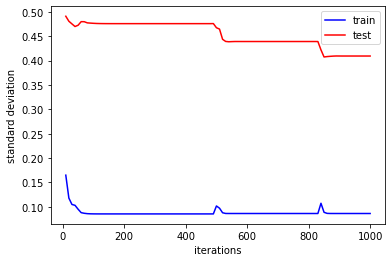

In [108]:
plt.plot(res1b[1,:],res1b[2,:],'-',color='blue',label='train')
plt.plot(res1b[1,:],res1b[3,:],'-',color='red',label='test')
plt.xlabel("iterations")
plt.ylabel("standard deviation")
plt.legend(loc="best")

label-prediction for train [ 7.67707814e-10  1.23977661e-07 -1.23679638e-08  1.50688583e-01
  1.82723999e-08  5.59234619e-08  1.63269043e-07 -1.09987259e-07
 -6.06727600e-08  1.11427307e-07 -7.74002075e-08 -1.60026550e-07
  9.37366486e-08  3.46279144e-08  2.01311111e-07  1.23977661e-07
 -3.31163406e-07 -3.83911133e-07 -3.75709534e-07 -1.19209290e-09
 -1.17225647e-07 -5.36842346e-08  2.43186951e-07 -1.26523972e-07
 -3.81755829e-08 -1.28364563e-07 -8.63075256e-09  8.15343857e-08
  9.51385498e-08 -3.74221802e-08 -2.05497742e-07 -1.41286850e-08
  2.43186951e-07 -4.98681417e-01 -2.58998871e-07 -4.32491301e-09
 -5.00297546e-08 -2.33650208e-07  4.53565832e-02 -2.89082527e-08
  4.76837148e-09  4.39584255e-09  9.22203064e-09 -3.57911417e-01
 -2.33650208e-07  2.96368583e-01  4.39858317e-03  2.43186951e-07
 -2.14576721e-08  1.05361938e-07  4.39858317e-03  1.23977661e-07
  2.43186951e-07 -1.69591904e-07  9.01031494e-09 -1.28560066e-07
 -5.03826141e-08  2.24268583e-01 -5.42068481e-08 -1.23184168e-0

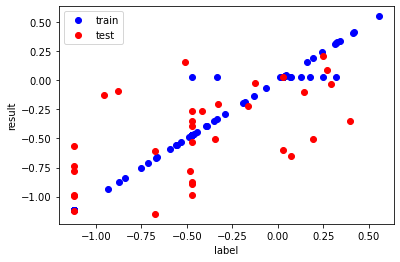

In [109]:
plt.plot(y_train,prediction1btr[:,0],'o',color='blue',label='train')
plt.plot(y_test,prediction1bte[:,0],'o',color='red',label='test')
plt.xlabel("label")
plt.ylabel("result")
plt.legend(loc="best")
print(f"label-prediction for train {(y_train-prediction1btr[:,0])}")
print(f"label-prediction for test {(y_test-prediction1bte[:,0])}")
#looks now much worse for the test sample than any before , maybe solved when no overfitting,
#but does not lookd good
#depends on run but is clearly sensitive 
#obtaining scores at every steps is slow and does also not converge
#robust and standard scaler are similar, both not good
#looks bad does the scaling work, it seems scaling is applied corrected. 

Looks not good even on train. Some 

In [33]:
print(f"standard deviation of train is {np.std(y_train-prediction1btr[:,0])}")
print(f"standard deviation of test is {np.std(y_test-prediction1bte[:,0])}")
print(f"MSE of train is {np.mean((y_train-prediction1btr[:,0])**2)}")
print(f"MSE of test is {np.mean((y_test-prediction1bte[:,0])**2)}")

standard deviation of train is 0.22339753623125766
standard deviation of test is 0.7741717228808426
MSE of train is 0.04990645919449941
MSE of test is 0.6257973323825343


The scatter and MSE is clearly smaller in the traing set than in the test set. Thus, there is clear overfitting already in this very simple neural network. Thus regulaization need to be added. 

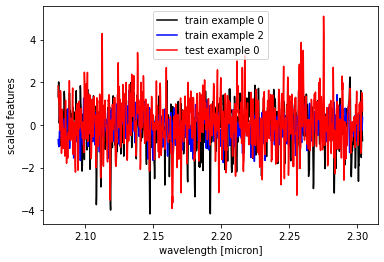

In [47]:
plt.plot(ressel[3],xsel_trainscaled[0],'-',color='black',label='train example 0')
plt.plot(ressel[3],xsel_trainscaled[2],'-',color='blue',label='train example 2')
plt.plot(ressel[3],xsel_testscaled[0],'-',color='red',label='test example 0')
plt.xlabel("wavelength [micron]")
plt.ylabel("scaled features")
plt.legend(loc="best")
#not surprising the scaled features are not good to look at 

We are now increasing the number of neurons in the first layer. 

In [53]:
model2= Sequential(
    [              
        tf.keras.Input(shape=(1197,)),  
        Dense(5, activation="relu", name="layer1"),   
        Dense(1, activation = 'linear',name="layer2")
    ], name = "model2"
) 

In [54]:
model2.summary()

Model: "model2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 layer1 (Dense)              (None, 5)                 5990      
                                                                 
 layer2 (Dense)              (None, 1)                 6         
                                                                 
Total params: 5,996
Trainable params: 5,996
Non-trainable params: 0
_________________________________________________________________


In [55]:
model2.compile(
    loss=tf.keras.losses.MeanSquaredError(), 
    optimizer=tf.keras.optimizers.Adam(0.001),
)


In [56]:
res2=np.zeros((6,40))
#tf.keras.utils.set_random_seed(1306)
for i in range(40):
    print(i)
    model2.fit(
        xsel_train,y_train,
        epochs=160,batch_size=74
        )
    prediction2tr = model2.predict(trainre)
    prediction2te = model2.predict(testre)
    res2[0,i]=i
    res2[1,i]=(i+1)*160
    res2[2,i]=np.std(y_train-prediction2tr[:,0])
    res2[3,i]=np.std(y_test-prediction2te[:,0])
    res2[4,i]=np.mean((y_train-prediction2tr[:,0])**2)
    res2[5,i]=np.mean((y_test-prediction2te[:,0])**2)  

0
Epoch 1/160
1/1 [==============================] - 0s 233ms/step - loss: 32.0676
Epoch 2/160
1/1 [==============================] - 0s 4ms/step - loss: 4.1308
Epoch 3/160
1/1 [==============================] - 0s 6ms/step - loss: 0.4531
Epoch 4/160
1/1 [==============================] - 0s 6ms/step - loss: 3.4553
Epoch 5/160
1/1 [==============================] - 0s 7ms/step - loss: 6.4377
Epoch 6/160
1/1 [==============================] - 0s 6ms/step - loss: 7.0243
Epoch 7/160
1/1 [==============================] - 0s 6ms/step - loss: 5.5059
Epoch 8/160
1/1 [==============================] - 0s 6ms/step - loss: 3.1652
Epoch 9/160
1/1 [==============================] - 0s 6ms/step - loss: 1.1968
Epoch 10/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2937
Epoch 11/160
1/1 [==============================] - 0s 7ms/step - loss: 0.5321
Epoch 12/160
1/1 [==============================] - 0s 5ms/step - loss: 1.4608
Epoch 13/160
1/1 [==============================] - 0s 7

Epoch 46/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2301
Epoch 47/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2299
Epoch 48/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2297
Epoch 49/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2295
Epoch 50/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2293
Epoch 51/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2292
Epoch 52/160
1/1 [==============================] - 0s 8ms/step - loss: 0.2290
Epoch 53/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2288
Epoch 54/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2286
Epoch 55/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2285
Epoch 56/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2283
Epoch 57/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2281
Epoch 58/160
1/1 [==============================] - 

1/1 [==============================] - 0s 6ms/step - loss: 0.2112
Epoch 150/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2110
Epoch 151/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2108
Epoch 152/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2107
Epoch 153/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2105
Epoch 154/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2103
Epoch 155/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2101
Epoch 156/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2099
Epoch 157/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2097
Epoch 158/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2095
Epoch 159/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2094
Epoch 160/160
2/2 [==============================] - 0s 3ms/step
2
Epoch 1/160
1/1 [==============================] - 0s 6ms/step - lo

1/1 [==============================] - 0s 6ms/step - loss: 0.1752
Epoch 33/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1750
Epoch 34/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1749
Epoch 35/160
1/1 [==============================] - 0s 3ms/step - loss: 0.1747
Epoch 36/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1745
Epoch 37/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1744
Epoch 38/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1742
Epoch 39/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1741
Epoch 40/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1739
Epoch 41/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1737
Epoch 42/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1736
Epoch 43/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1734
Epoch 44/160
1/1 [==============================] - 0s 5ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.1457
Epoch 78/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1456
Epoch 79/160
1/1 [==============================] - 0s 8ms/step - loss: 0.1455
Epoch 80/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1453
Epoch 81/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1452
Epoch 82/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1451
Epoch 83/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1450
Epoch 84/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1448
Epoch 85/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1447
Epoch 86/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1446
Epoch 87/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1445
Epoch 88/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1444
Epoch 89/160
1/1 [==============================] - 0s 7ms/step -

1/1 [==============================] - 0s 4ms/step - loss: 0.1240
Epoch 122/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1239
Epoch 123/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1238
Epoch 124/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1237
Epoch 125/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1236
Epoch 126/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1236
Epoch 127/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1235
Epoch 128/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1234
Epoch 129/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1233
Epoch 130/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1232
Epoch 131/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1231
Epoch 132/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1230
Epoch 133/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 7ms/step - loss: 0.1080
Epoch 5/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 6/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1079
Epoch 7/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1078
Epoch 8/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1078
Epoch 9/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1077
Epoch 10/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1076
Epoch 11/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1076
Epoch 12/160
1/1 [==============================] - 0s 8ms/step - loss: 0.1075
Epoch 13/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1074
Epoch 14/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1073
Epoch 15/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1073
Epoch 16/160
1/1 [==============================] - 0s 6ms/step - loss

Epoch 49/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0955
Epoch 50/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0954
Epoch 51/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0954
Epoch 52/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0953
Epoch 53/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0953
Epoch 54/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0952
Epoch 55/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0951
Epoch 56/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0951
Epoch 57/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0950
Epoch 58/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0950
Epoch 59/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0949
Epoch 60/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0949
Epoch 61/160
1/1 [==============================] - 

1/1 [==============================] - 0s 5ms/step - loss: 0.0901
Epoch 153/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0900
Epoch 154/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0900
Epoch 155/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0899
Epoch 156/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0899
Epoch 157/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0898
Epoch 158/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0898
Epoch 159/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0897
Epoch 160/160
2/2 [==============================] - 0s 3ms/step
9
Epoch 1/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0896
Epoch 2/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0896
Epoch 3/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0895
Epoch 4/160
1/1 [==============================] - 0s 6ms/step - loss: 0.

1/1 [==============================] - 0s 7ms/step - loss: 0.0806
Epoch 36/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0806
Epoch 37/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0806
Epoch 38/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0805
Epoch 39/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0805
Epoch 40/160
1/1 [==============================] - 0s 4ms/step - loss: 0.0804
Epoch 41/160
1/1 [==============================] - 0s 8ms/step - loss: 0.0804
Epoch 42/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0803
Epoch 43/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0803
Epoch 44/160
1/1 [==============================] - 0s 8ms/step - loss: 0.0803
Epoch 45/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0802
Epoch 46/160
1/1 [==============================] - 0s 8ms/step - loss: 0.0802
Epoch 47/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 4ms/step - loss: 0.0725
Epoch 81/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0724
Epoch 82/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0724
Epoch 83/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0723
Epoch 84/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0723
Epoch 85/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0723
Epoch 86/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0722
Epoch 87/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0722
Epoch 88/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0722
Epoch 89/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0721
Epoch 90/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0721
Epoch 91/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0720
Epoch 92/160
1/1 [==============================] - 0s 7ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.0654
Epoch 125/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0653
Epoch 126/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0653
Epoch 127/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0653
Epoch 128/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0653
Epoch 129/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0652
Epoch 130/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0652
Epoch 131/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0652
Epoch 132/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0651
Epoch 133/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0651
Epoch 134/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0651
Epoch 135/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0650
Epoch 136/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 7ms/step - loss: 0.0592
Epoch 8/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0592
Epoch 9/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0591
Epoch 10/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0591
Epoch 11/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0591
Epoch 12/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0591
Epoch 13/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0590
Epoch 14/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0590
Epoch 15/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0590
Epoch 16/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0590
Epoch 17/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0589
Epoch 18/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0589
Epoch 19/160
1/1 [==============================] - 0s 7ms/step - l

1/1 [==============================] - 0s 6ms/step - loss: 0.0537
Epoch 53/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0536
Epoch 54/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0536
Epoch 55/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0536
Epoch 56/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0536
Epoch 57/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0535
Epoch 58/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0535
Epoch 59/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0535
Epoch 60/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0535
Epoch 61/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0534
Epoch 62/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0534
Epoch 63/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0534
Epoch 64/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 5ms/step - loss: 0.0511
Epoch 156/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0511
Epoch 157/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0511
Epoch 158/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0510
Epoch 159/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0510
Epoch 160/160
2/2 [==============================] - 0s 2ms/step
16
Epoch 1/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0510
Epoch 2/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0509
Epoch 3/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0509
Epoch 4/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0509
Epoch 5/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0509
Epoch 6/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0508
Epoch 7/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0508


1/1 [==============================] - 0s 6ms/step - loss: 0.0464
Epoch 39/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0464
Epoch 40/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0463
Epoch 41/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0463
Epoch 42/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0463
Epoch 43/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0463
Epoch 44/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0462
Epoch 45/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0462
Epoch 46/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0462
Epoch 47/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0462
Epoch 48/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0462
Epoch 49/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0461
Epoch 50/160
1/1 [==============================] - 0s 5ms/step -

1/1 [==============================] - 0s 7ms/step - loss: 0.0420
Epoch 84/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0420
Epoch 85/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0419
Epoch 86/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0419
Epoch 87/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0419
Epoch 88/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0419
Epoch 89/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0419
Epoch 90/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0418
Epoch 91/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0418
Epoch 92/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0418
Epoch 93/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0418
Epoch 94/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0417
Epoch 95/160
1/1 [==============================] - 0s 7ms/step -

1/1 [==============================] - 0s 7ms/step - loss: 0.0385
Epoch 128/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0385
Epoch 129/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0385
Epoch 130/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0385
Epoch 131/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0384
Epoch 132/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0384
Epoch 133/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0384
Epoch 134/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0384
Epoch 135/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0384
Epoch 136/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0384
Epoch 137/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0383
Epoch 138/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0383
Epoch 139/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 6ms/step - loss: 0.0360
Epoch 11/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0374
Epoch 12/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0372
Epoch 13/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0358
Epoch 14/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0355
Epoch 15/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0363
Epoch 16/160
1/1 [==============================] - 0s 4ms/step - loss: 0.0367
Epoch 17/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0360
Epoch 18/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0354
Epoch 19/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0356
Epoch 20/160
1/1 [==============================] - 0s 8ms/step - loss: 0.0361
Epoch 21/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0360
Epoch 22/160
1/1 [==============================] - 0s 7ms/step -

1/1 [==============================] - 0s 5ms/step - loss: 0.0327
Epoch 56/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0327
Epoch 57/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0327
Epoch 58/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0326
Epoch 59/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0326
Epoch 60/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0326
Epoch 61/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0326
Epoch 62/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0326
Epoch 63/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0326
Epoch 64/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0326
Epoch 65/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0325
Epoch 66/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0325
Epoch 67/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 4ms/step - loss: 0.0328
Epoch 159/160
1/1 [==============================] - 0s 4ms/step - loss: 0.0316
Epoch 160/160
2/2 [==============================] - 0s 2ms/step
23
Epoch 1/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0349
Epoch 2/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0332
Epoch 3/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0315
Epoch 4/160
1/1 [==============================] - 0s 8ms/step - loss: 0.0322
Epoch 5/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0335
Epoch 6/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0332
Epoch 7/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0318
Epoch 8/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0315
Epoch 9/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0324
Epoch 10/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0327
Epoch

1/1 [==============================] - 0s 5ms/step - loss: 0.0292
Epoch 42/160
1/1 [==============================] - 0s 8ms/step - loss: 0.0292
Epoch 43/160
1/1 [==============================] - 0s 8ms/step - loss: 0.0292
Epoch 44/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0292
Epoch 45/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0292
Epoch 46/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0292
Epoch 47/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0292
Epoch 48/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0292
Epoch 49/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0291
Epoch 50/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0291
Epoch 51/160
1/1 [==============================] - 0s 4ms/step - loss: 0.0291
Epoch 52/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0291
Epoch 53/160
1/1 [==============================] - 0s 7ms/step -

1/1 [==============================] - 0s 5ms/step - loss: 0.0273
Epoch 87/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0273
Epoch 88/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0273
Epoch 89/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0273
Epoch 90/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0272
Epoch 91/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0272
Epoch 92/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0272
Epoch 93/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0272
Epoch 94/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0272
Epoch 95/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0272
Epoch 96/160
1/1 [==============================] - 0s 4ms/step - loss: 0.0272
Epoch 97/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0272
Epoch 98/160
1/1 [==============================] - 0s 7ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.0803
Epoch 131/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0723
Epoch 132/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0376
Epoch 133/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0264
Epoch 134/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0469
Epoch 135/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0602
Epoch 136/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0452
Epoch 137/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0267
Epoch 138/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0307
Epoch 139/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0448
Epoch 140/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0439
Epoch 141/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0304
Epoch 142/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 6ms/step - loss: 0.0238
Epoch 14/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0238
Epoch 15/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0238
Epoch 16/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0238
Epoch 17/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0238
Epoch 18/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0237
Epoch 19/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0237
Epoch 20/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0237
Epoch 21/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0237
Epoch 22/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0237
Epoch 23/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0237
Epoch 24/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0237
Epoch 25/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.0223
Epoch 59/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0223
Epoch 60/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0223
Epoch 61/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0223
Epoch 62/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0223
Epoch 63/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0223
Epoch 64/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0223
Epoch 65/160
1/1 [==============================] - 0s 4ms/step - loss: 0.0223
Epoch 66/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0223
Epoch 67/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0223
Epoch 68/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0223
Epoch 69/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0223
Epoch 70/160
1/1 [==============================] - 0s 7ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.0209
Epoch 104/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0209
Epoch 105/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0209
Epoch 106/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0210
Epoch 107/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0210
Epoch 108/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0212
Epoch 109/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0215
Epoch 110/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0219
Epoch 111/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0227
Epoch 112/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0241
Epoch 113/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0266
Epoch 114/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0308
Epoch 115/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 6ms/step - loss: 0.0196
Epoch 148/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0196
Epoch 149/160
1/1 [==============================] - 0s 8ms/step - loss: 0.0196
Epoch 150/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0196
Epoch 151/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0196
Epoch 152/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0196
Epoch 153/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0196
Epoch 154/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0196
Epoch 155/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0196
Epoch 156/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0196
Epoch 157/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0195
Epoch 158/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0195
Epoch 159/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 7ms/step - loss: 0.0185
Epoch 31/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0185
Epoch 32/160
1/1 [==============================] - 0s 8ms/step - loss: 0.0185
Epoch 33/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0185
Epoch 34/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0185
Epoch 35/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0185
Epoch 36/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0185
Epoch 37/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0185
Epoch 38/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0185
Epoch 39/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0185
Epoch 40/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0185
Epoch 41/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0184
Epoch 42/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.0173
Epoch 76/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0173
Epoch 77/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0173
Epoch 78/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0173
Epoch 79/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0173
Epoch 80/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0173
Epoch 81/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0174
Epoch 82/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0174
Epoch 83/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0175
Epoch 84/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0177
Epoch 85/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0180
Epoch 86/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0185
Epoch 87/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.0164
Epoch 120/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0164
Epoch 121/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0164
Epoch 122/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0164
Epoch 123/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0164
Epoch 124/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0164
Epoch 125/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0164
Epoch 126/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0164
Epoch 127/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0164
Epoch 128/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0164
Epoch 129/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0163
Epoch 130/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0163
Epoch 131/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 6ms/step - loss: 0.0159
Epoch 62/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0159
Epoch 63/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0159
Epoch 64/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0159
Epoch 65/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0158
Epoch 66/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0158
Epoch 67/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0158
Epoch 68/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0158
Epoch 69/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0158
Epoch 70/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0158
Epoch 71/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0158
Epoch 72/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0158
Epoch 73/160
1/1 [==============================] - 0s 5ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.0150
Epoch 106/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0150
Epoch 107/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0150
Epoch 108/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0150
Epoch 109/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0150
Epoch 110/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0150
Epoch 111/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0150
Epoch 112/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0150
Epoch 113/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0150
Epoch 114/160
1/1 [==============================] - 0s 4ms/step - loss: 0.0150
Epoch 115/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0150
Epoch 116/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0150
Epoch 117/160
1/1 [==============================] - 0

Epoch 47/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0146
Epoch 48/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0145
Epoch 49/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0145
Epoch 50/160
1/1 [==============================] - 0s 8ms/step - loss: 0.0145
Epoch 51/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0145
Epoch 52/160
1/1 [==============================] - 0s 8ms/step - loss: 0.0145
Epoch 53/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0145
Epoch 54/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0145
Epoch 55/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0145
Epoch 56/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0145
Epoch 57/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0145
Epoch 58/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0145
Epoch 59/160
1/1 [==============================] - 

1/1 [==============================] - 0s 6ms/step - loss: 0.0145
Epoch 151/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0143
Epoch 152/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0148
Epoch 153/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0151
Epoch 154/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0147
Epoch 155/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0142
Epoch 156/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0143
Epoch 157/160
1/1 [==============================] - 0s 4ms/step - loss: 0.0147
Epoch 158/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0147
Epoch 159/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0144
Epoch 160/160
2/2 [==============================] - 0s 3ms/step
39
Epoch 1/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0143
Epoch 2/160
1/1 [==============================] - 0s 5ms/step - los

model 2
2/2 [==============================] - 0s 2ms/step
standard deviation of train is 0.654042926965689
standard deviation of test is 0.5837762563797232


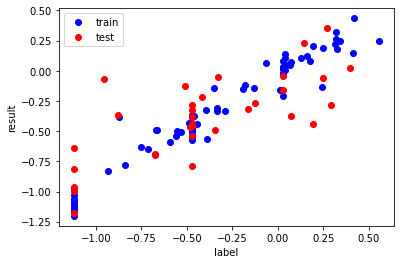

In [57]:
print("model 2")
trainre=xsel_train[0:1197].reshape(74,1197) 
testre=xsel_test[0:1197].reshape(33,1197) 
prediction2tr = model2.predict(trainre)
prediction2te = model2.predict(testre)
plt.plot(y_train,prediction2tr,'o',color='blue',label='train')
plt.plot(y_test,prediction2te,'o',color='red',label='test')
plt.xlabel("label")
plt.ylabel("result")
plt.legend(loc="best")
print(f"standard deviation of train is {np.std(y_train-prediction2tr)}")
print(f"standard deviation of test is {np.std(y_test-prediction2te)}")

 best standard deviation of tets is 0.2917861101354372


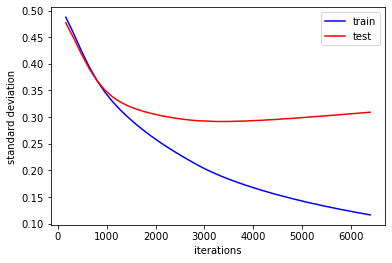

In [60]:
plt.plot(res2[1,:],res2[2,:],'-',color='blue',label='train')
plt.plot(res2[1,:],res2[3,:],'-',color='red',label='test')
plt.xlabel("iterations")
plt.ylabel("standard deviation")
plt.legend(loc="best")
print(f" best standard deviation of tets is {min(res2[3])}")

In [ ]:
plt.plot(res1b[1,:],res1b[2,:],'-',color='blue',label='train')
plt.plot(res1b[1,:],res1b[3,:],'-',color='red',label='test')
plt.xlabel("iterations")
plt.ylabel("standard deviation")
plt.legend(loc="best")

Not much has changed,results still depend on random numbers used for start. Maybe a litlle less dependent in it. When the fit avoids the local minimum, the metrics of train get clearly smaller than on test. The ones on test atcually get larger again. Thus there is overfitting.  

Trying even more neurons in first layer. 

In [61]:
model3= Sequential(
    [              
        tf.keras.Input(shape=(1197,)),  
        Dense(15, activation="relu", name="layer1"),   
        Dense(1, activation = 'linear',name="layer2")
    ], name = "model3"
) 
model3.summary()

Model: "model3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 layer1 (Dense)              (None, 15)                17970     
                                                                 
 layer2 (Dense)              (None, 1)                 16        
                                                                 
Total params: 17,986
Trainable params: 17,986
Non-trainable params: 0
_________________________________________________________________


In [62]:
model3.compile(
    loss=tf.keras.losses.MeanSquaredError(), 
    optimizer=tf.keras.optimizers.Adam(0.001),
)


In [63]:
res3=np.zeros((6,40))
#tf.keras.utils.set_random_seed(1306)
for i in range(40):
    print(i)
    model3.fit(
        xsel_train,y_train,
        epochs=160,batch_size=74
        )
    prediction3tr = model3.predict(trainre)
    prediction3te = model3.predict(testre)
    res3[0,i]=i
    res3[1,i]=(i+1)*160
    res3[2,i]=np.std(y_train-prediction3tr[:,0])
    res3[3,i]=np.std(y_test-prediction3te[:,0])
    res3[4,i]=np.mean((y_train-prediction3tr[:,0])**2)
    res3[5,i]=np.mean((y_test-prediction3te[:,0])**2)  


0
Epoch 1/160
1/1 [==============================] - 0s 234ms/step - loss: 1.2648
Epoch 2/160
1/1 [==============================] - 0s 6ms/step - loss: 1.4650
Epoch 3/160
1/1 [==============================] - 0s 6ms/step - loss: 1.0523
Epoch 4/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2507
Epoch 5/160
1/1 [==============================] - 0s 6ms/step - loss: 0.6761
Epoch 6/160
1/1 [==============================] - 0s 5ms/step - loss: 0.9286
Epoch 7/160
1/1 [==============================] - 0s 7ms/step - loss: 0.5125
Epoch 8/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2453
Epoch 9/160
1/1 [==============================] - 0s 7ms/step - loss: 0.4596
Epoch 10/160
1/1 [==============================] - 0s 6ms/step - loss: 0.6534
Epoch 11/160
1/1 [==============================] - 0s 6ms/step - loss: 0.4957
Epoch 12/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2704
Epoch 13/160
1/1 [==============================] - 0s 6m

Epoch 46/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1779
Epoch 47/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1775
Epoch 48/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1772
Epoch 49/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1768
Epoch 50/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1764
Epoch 51/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1761
Epoch 52/160
1/1 [==============================] - 0s 8ms/step - loss: 0.1757
Epoch 53/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1754
Epoch 54/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1750
Epoch 55/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1747
Epoch 56/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1743
Epoch 57/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1739
Epoch 58/160
1/1 [==============================] - 

1/1 [==============================] - 0s 6ms/step - loss: 0.1447
Epoch 150/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1445
Epoch 151/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1442
Epoch 152/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1439
Epoch 153/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1436
Epoch 154/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1434
Epoch 155/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1431
Epoch 156/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1428
Epoch 157/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1425
Epoch 158/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1423
Epoch 159/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1420
Epoch 160/160
2/2 [==============================] - 0s 2ms/step
2
Epoch 1/160
1/1 [==============================] - 0s 5ms/step - lo

1/1 [==============================] - 0s 6ms/step - loss: 0.1030
Epoch 33/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1029
Epoch 34/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1028
Epoch 35/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1026
Epoch 36/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1025
Epoch 37/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1023
Epoch 38/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1022
Epoch 39/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1020
Epoch 40/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1019
Epoch 41/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1017
Epoch 42/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1016
Epoch 43/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1015
Epoch 44/160
1/1 [==============================] - 0s 4ms/step -

1/1 [==============================] - 0s 7ms/step - loss: 0.0795
Epoch 78/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0794
Epoch 79/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0793
Epoch 80/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0792
Epoch 81/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0791
Epoch 82/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0790
Epoch 83/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0789
Epoch 84/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0788
Epoch 85/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0788
Epoch 86/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0787
Epoch 87/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0786
Epoch 88/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0785
Epoch 89/160
1/1 [==============================] - 0s 7ms/step -

1/1 [==============================] - 0s 5ms/step - loss: 0.0759
Epoch 122/160
1/1 [==============================] - 0s 8ms/step - loss: 0.0704
Epoch 123/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0648
Epoch 124/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0714
Epoch 125/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0705
Epoch 126/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0645
Epoch 127/160
1/1 [==============================] - 0s 4ms/step - loss: 0.0680
Epoch 128/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0697
Epoch 129/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0649
Epoch 130/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0658
Epoch 131/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0684
Epoch 132/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0655
Epoch 133/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 6ms/step - loss: 0.0555
Epoch 5/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0555
Epoch 6/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0554
Epoch 7/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0554
Epoch 8/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0553
Epoch 9/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0553
Epoch 10/160
1/1 [==============================] - 0s 8ms/step - loss: 0.0552
Epoch 11/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0552
Epoch 12/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0552
Epoch 13/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0551
Epoch 14/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0551
Epoch 15/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0550
Epoch 16/160
1/1 [==============================] - 0s 7ms/step - loss

Epoch 49/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0491
Epoch 50/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0490
Epoch 51/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0490
Epoch 52/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0490
Epoch 53/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0489
Epoch 54/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0489
Epoch 55/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0489
Epoch 56/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0489
Epoch 57/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0488
Epoch 58/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0488
Epoch 59/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0488
Epoch 60/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0487
Epoch 61/160
1/1 [==============================] - 

1/1 [==============================] - 0s 8ms/step - loss: 0.0461
Epoch 153/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0461
Epoch 154/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0460
Epoch 155/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0460
Epoch 156/160
1/1 [==============================] - 0s 4ms/step - loss: 0.0460
Epoch 157/160
1/1 [==============================] - 0s 4ms/step - loss: 0.0459
Epoch 158/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0459
Epoch 159/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0459
Epoch 160/160
2/2 [==============================] - 0s 2ms/step
9
Epoch 1/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0458
Epoch 2/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0458
Epoch 3/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0458
Epoch 4/160
1/1 [==============================] - 0s 5ms/step - loss: 0.

1/1 [==============================] - 0s 5ms/step - loss: 0.0418
Epoch 36/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0417
Epoch 37/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0417
Epoch 38/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0417
Epoch 39/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0417
Epoch 40/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0417
Epoch 41/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0416
Epoch 42/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0416
Epoch 43/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0416
Epoch 44/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0416
Epoch 45/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0415
Epoch 46/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0415
Epoch 47/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 8ms/step - loss: 0.0382
Epoch 81/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0386
Epoch 82/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0395
Epoch 83/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0387
Epoch 84/160
1/1 [==============================] - 0s 4ms/step - loss: 0.0380
Epoch 85/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0387
Epoch 86/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0389
Epoch 87/160
1/1 [==============================] - 0s 4ms/step - loss: 0.0382
Epoch 88/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0380
Epoch 89/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0385
Epoch 90/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0385
Epoch 91/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0379
Epoch 92/160
1/1 [==============================] - 0s 5ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.0346
Epoch 125/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0346
Epoch 126/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0345
Epoch 127/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0345
Epoch 128/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0345
Epoch 129/160
1/1 [==============================] - 0s 4ms/step - loss: 0.0345
Epoch 130/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0345
Epoch 131/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0345
Epoch 132/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0344
Epoch 133/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0344
Epoch 134/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0344
Epoch 135/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0344
Epoch 136/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 7ms/step - loss: 0.0319
Epoch 8/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0319
Epoch 9/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0319
Epoch 10/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0319
Epoch 11/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0319
Epoch 12/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0319
Epoch 13/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0319
Epoch 14/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0318
Epoch 15/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0318
Epoch 16/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0318
Epoch 17/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0318
Epoch 18/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0318
Epoch 19/160
1/1 [==============================] - 0s 7ms/step - l

1/1 [==============================] - 0s 6ms/step - loss: 0.0606
Epoch 53/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1211
Epoch 54/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0997
Epoch 55/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0381
Epoch 56/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0415
Epoch 57/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0844
Epoch 58/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0770
Epoch 59/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0360
Epoch 60/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0370
Epoch 61/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0654
Epoch 62/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0592
Epoch 63/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0325
Epoch 64/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.0283
Epoch 156/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0283
Epoch 157/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0283
Epoch 158/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0283
Epoch 159/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0283
Epoch 160/160
2/2 [==============================] - 0s 3ms/step
16
Epoch 1/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0282
Epoch 2/160
1/1 [==============================] - 0s 8ms/step - loss: 0.0282
Epoch 3/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0282
Epoch 4/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0282
Epoch 5/160
1/1 [==============================] - 0s 9ms/step - loss: 0.0282
Epoch 6/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0282
Epoch 7/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0282


1/1 [==============================] - 0s 6ms/step - loss: 0.0301
Epoch 39/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0337
Epoch 40/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0407
Epoch 41/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0537
Epoch 42/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0777
Epoch 43/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1197
Epoch 44/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1866
Epoch 45/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2729
Epoch 46/160
1/1 [==============================] - 0s 6ms/step - loss: 0.3384
Epoch 47/160
1/1 [==============================] - 0s 6ms/step - loss: 0.3115
Epoch 48/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1744
Epoch 49/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0441
Epoch 50/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.0242
Epoch 84/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0242
Epoch 85/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0242
Epoch 86/160
1/1 [==============================] - 0s 8ms/step - loss: 0.0242
Epoch 87/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0242
Epoch 88/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0242
Epoch 89/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0241
Epoch 90/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0241
Epoch 91/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0241
Epoch 92/160
1/1 [==============================] - 0s 4ms/step - loss: 0.0241
Epoch 93/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0241
Epoch 94/160
1/1 [==============================] - 0s 8ms/step - loss: 0.0241
Epoch 95/160
1/1 [==============================] - 0s 5ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.0227
Epoch 128/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0227
Epoch 129/160
1/1 [==============================] - 0s 4ms/step - loss: 0.0227
Epoch 130/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0226
Epoch 131/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0226
Epoch 132/160
1/1 [==============================] - 0s 4ms/step - loss: 0.0226
Epoch 133/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0226
Epoch 134/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0226
Epoch 135/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0226
Epoch 136/160
1/1 [==============================] - 0s 3ms/step - loss: 0.0226
Epoch 137/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0226
Epoch 138/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0226
Epoch 139/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 6ms/step - loss: 0.0208
Epoch 11/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0208
Epoch 12/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0208
Epoch 13/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0208
Epoch 14/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0208
Epoch 15/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0208
Epoch 16/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0208
Epoch 17/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0208
Epoch 18/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0208
Epoch 19/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0208
Epoch 20/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0208
Epoch 21/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0208
Epoch 22/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 4ms/step - loss: 0.0196
Epoch 56/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0196
Epoch 57/160
1/1 [==============================] - 0s 4ms/step - loss: 0.0196
Epoch 58/160
1/1 [==============================] - 0s 4ms/step - loss: 0.0196
Epoch 59/160
1/1 [==============================] - 0s 4ms/step - loss: 0.0196
Epoch 60/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0195
Epoch 61/160
1/1 [==============================] - 0s 4ms/step - loss: 0.0195
Epoch 62/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0195
Epoch 63/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0195
Epoch 64/160
1/1 [==============================] - 0s 4ms/step - loss: 0.0195
Epoch 65/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0195
Epoch 66/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0195
Epoch 67/160
1/1 [==============================] - 0s 5ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.0188
Epoch 159/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0188
Epoch 160/160
2/2 [==============================] - 0s 3ms/step
23
Epoch 1/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0187
Epoch 2/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0187
Epoch 3/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0187
Epoch 4/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0187
Epoch 5/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0187
Epoch 6/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0187
Epoch 7/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0187
Epoch 8/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0187
Epoch 9/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0187
Epoch 10/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0187
Epoch

1/1 [==============================] - 0s 6ms/step - loss: 0.0178
Epoch 42/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0178
Epoch 43/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0178
Epoch 44/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0178
Epoch 45/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0178
Epoch 46/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0178
Epoch 47/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0178
Epoch 48/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0178
Epoch 49/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0178
Epoch 50/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0177
Epoch 51/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0177
Epoch 52/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0177
Epoch 53/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.1899
Epoch 87/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0434
Epoch 88/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0298
Epoch 89/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1243
Epoch 90/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1803
Epoch 91/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1181
Epoch 92/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0286
Epoch 93/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0321
Epoch 94/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0959
Epoch 95/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1041
Epoch 96/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0456
Epoch 97/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0172
Epoch 98/160
1/1 [==============================] - 0s 5ms/step -

1/1 [==============================] - 0s 4ms/step - loss: 0.0155
Epoch 131/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0155
Epoch 132/160
1/1 [==============================] - 0s 4ms/step - loss: 0.0155
Epoch 133/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0155
Epoch 134/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0155
Epoch 135/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0155
Epoch 136/160
1/1 [==============================] - 0s 4ms/step - loss: 0.0155
Epoch 137/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0155
Epoch 138/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0155
Epoch 139/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0155
Epoch 140/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0155
Epoch 141/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0155
Epoch 142/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 6ms/step - loss: 0.0148
Epoch 14/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0147
Epoch 15/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0147
Epoch 16/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0148
Epoch 17/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0148
Epoch 18/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0147
Epoch 19/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0147
Epoch 20/160
1/1 [==============================] - 0s 4ms/step - loss: 0.0147
Epoch 21/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0147
Epoch 22/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0147
Epoch 23/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0147
Epoch 24/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0147
Epoch 25/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 4ms/step - loss: 0.0136
Epoch 59/160
1/1 [==============================] - 0s 4ms/step - loss: 0.0136
Epoch 60/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0136
Epoch 61/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0136
Epoch 62/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0136
Epoch 63/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0136
Epoch 64/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0136
Epoch 65/160
1/1 [==============================] - 0s 4ms/step - loss: 0.0136
Epoch 66/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0136
Epoch 67/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0136
Epoch 68/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0136
Epoch 69/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0135
Epoch 70/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 5ms/step - loss: 0.0129
Epoch 104/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0129
Epoch 105/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0129
Epoch 106/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0129
Epoch 107/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0129
Epoch 108/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0129
Epoch 109/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0129
Epoch 110/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0129
Epoch 111/160
1/1 [==============================] - 0s 4ms/step - loss: 0.0129
Epoch 112/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0129
Epoch 113/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0129
Epoch 114/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0128
Epoch 115/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 6ms/step - loss: 0.0123
Epoch 148/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0125
Epoch 149/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0126
Epoch 150/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0124
Epoch 151/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0123
Epoch 152/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0123
Epoch 153/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0124
Epoch 154/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0124
Epoch 155/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0123
Epoch 156/160
1/1 [==============================] - 0s 4ms/step - loss: 0.0123
Epoch 157/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0123
Epoch 158/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0123
Epoch 159/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 5ms/step - loss: 0.0114
Epoch 31/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0114
Epoch 32/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0113
Epoch 33/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0113
Epoch 34/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0113
Epoch 35/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0113
Epoch 36/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0113
Epoch 37/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0113
Epoch 38/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0113
Epoch 39/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0113
Epoch 40/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0113
Epoch 41/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0113
Epoch 42/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.0109
Epoch 76/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0109
Epoch 77/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0109
Epoch 78/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0109
Epoch 79/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0109
Epoch 80/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0108
Epoch 81/160
1/1 [==============================] - 0s 4ms/step - loss: 0.0108
Epoch 82/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0108
Epoch 83/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0108
Epoch 84/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0108
Epoch 85/160
1/1 [==============================] - 0s 4ms/step - loss: 0.0108
Epoch 86/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0108
Epoch 87/160
1/1 [==============================] - 0s 5ms/step -

1/1 [==============================] - 0s 5ms/step - loss: 0.0189
Epoch 120/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0363
Epoch 121/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1109
Epoch 122/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1053
Epoch 123/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0325
Epoch 124/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0149
Epoch 125/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0630
Epoch 126/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0758
Epoch 127/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0313
Epoch 128/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0114
Epoch 129/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0409
Epoch 130/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0534
Epoch 131/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 4ms/step - loss: 0.0100
Epoch 62/160
1/1 [==============================] - 0s 4ms/step - loss: 0.0100
Epoch 63/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0100
Epoch 64/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0100
Epoch 65/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0100
Epoch 66/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0100
Epoch 67/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0100
Epoch 68/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0100
Epoch 69/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0100
Epoch 70/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0100
Epoch 71/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0100
Epoch 72/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0100
Epoch 73/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 5ms/step - loss: 0.0093
Epoch 106/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0093
Epoch 107/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0093
Epoch 108/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0093
Epoch 109/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0093
Epoch 110/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0093
Epoch 111/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0093
Epoch 112/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0093
Epoch 113/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0093
Epoch 114/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0093
Epoch 115/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0093
Epoch 116/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0093
Epoch 117/160
1/1 [==============================] - 0

Epoch 47/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0093
Epoch 48/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0094
Epoch 49/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0095
Epoch 50/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0095
Epoch 51/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0093
Epoch 52/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0093
Epoch 53/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0094
Epoch 54/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0094
Epoch 55/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0093
Epoch 56/160
1/1 [==============================] - 0s 4ms/step - loss: 0.0093
Epoch 57/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0093
Epoch 58/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0094
Epoch 59/160
1/1 [==============================] - 

1/1 [==============================] - 0s 5ms/step - loss: 0.0089
Epoch 151/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0089
Epoch 152/160
1/1 [==============================] - 0s 4ms/step - loss: 0.0089
Epoch 153/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0089
Epoch 154/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0089
Epoch 155/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0089
Epoch 156/160
1/1 [==============================] - 0s 4ms/step - loss: 0.0089
Epoch 157/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0089
Epoch 158/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0089
Epoch 159/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0089
Epoch 160/160
2/2 [==============================] - 0s 3ms/step
39
Epoch 1/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0089
Epoch 2/160
1/1 [==============================] - 0s 4ms/step - los

model 3
2/2 [==============================] - 0s 2ms/step
standard deviation of train is 0.09199393669312353
standard deviation of test is 0.30540933554057337
MSE of train is 0.18642199859063138
MSE of test is 0.24182550849063847


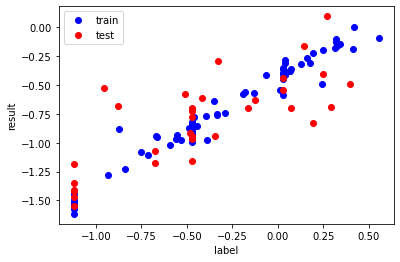

In [64]:
print("model 3")
trainre=xsel_train[0:1197].reshape(74,1197) 
testre=xsel_test[0:1197].reshape(33,1197) 
prediction3tr = model3.predict(trainre)
prediction3te = model3.predict(testre)
plt.plot(y_train,prediction3tr,'o',color='blue',label='train')
plt.plot(y_test,prediction3te,'o',color='red',label='test')
plt.xlabel("label")
plt.ylabel("result")
plt.legend(loc="best")
print(f"standard deviation of train is {np.std(y_train-prediction3tr[:,0])}")
print(f"standard deviation of test is {np.std(y_test-prediction3te[:,0])}")
print(f"MSE of train is {np.mean((y_train-prediction3tr[:,0])**2)}")
print(f"MSE of test is {np.mean((y_test-prediction3te[:,0])**2)}")

best standard deviation of test 0.27697285662797083


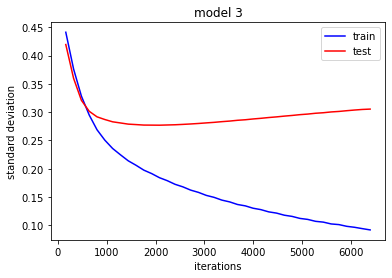

In [66]:
plt.plot(res3[1,:],res3[2,:],'-',color='blue',label='train')
plt.plot(res3[1,:],res3[3,:],'-',color='red',label='test')
plt.xlabel("iterations")
plt.title("model 3")
plt.ylabel("standard deviation")
plt.legend(loc="best")
print(f"best standard deviation of test {min(res3[3])}")

Seems less likely to be stucked in local minima. Is clearly overfitting. Thus, I add regularization. 

In [71]:
model3b= Sequential(
    [              
        tf.keras.Input(shape=(1197,)),  
        Dense(15, activation="relu",kernel_regularizer=tf.keras.regularizers.L1(0.01), name="layer1"),   
        Dense(1, activation = 'linear',kernel_regularizer=tf.keras.regularizers.L1(0.01),name="layer2")
    ], name = "model3b"
) 
model3b.summary()

Model: "model3b"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 layer1 (Dense)              (None, 15)                17970     
                                                                 
 layer2 (Dense)              (None, 1)                 16        
                                                                 
Total params: 17,986
Trainable params: 17,986
Non-trainable params: 0
_________________________________________________________________


In [72]:
model3b.compile(
    loss=tf.keras.losses.MeanSquaredError(), 
    optimizer=tf.keras.optimizers.Adam(0.001),
)


In [73]:
res3b=np.zeros((6,40))
#tf.keras.utils.set_random_seed(1306)
for i in range(40):
    print(i)
    model3b.fit(
        xsel_train,y_train,
        epochs=160,batch_size=74
        )
    prediction3trb = model3b.predict(trainre)
    prediction3teb = model3b.predict(testre)
    res3b[0,i]=i
    res3b[1,i]=(i+1)*160
    res3b[2,i]=np.std(y_train-prediction3trb[:,0])
    res3b[3,i]=np.std(y_test-prediction3teb[:,0])
    res3b[4,i]=np.mean((y_train-prediction3trb[:,0])**2)
    res3b[5,i]=np.mean((y_test-prediction3teb[:,0])**2)  

0
Epoch 1/160
1/1 [==============================] - 0s 283ms/step - loss: 17.8549
Epoch 2/160
1/1 [==============================] - 0s 5ms/step - loss: 6.5889
Epoch 3/160
1/1 [==============================] - 0s 7ms/step - loss: 8.2227
Epoch 4/160
1/1 [==============================] - 0s 7ms/step - loss: 9.2532
Epoch 5/160
1/1 [==============================] - 0s 6ms/step - loss: 8.9905
Epoch 6/160
1/1 [==============================] - 0s 5ms/step - loss: 7.9899
Epoch 7/160
1/1 [==============================] - 0s 5ms/step - loss: 6.9254
Epoch 8/160
1/1 [==============================] - 0s 6ms/step - loss: 6.2395
Epoch 9/160
1/1 [==============================] - 0s 9ms/step - loss: 6.0776
Epoch 10/160
1/1 [==============================] - 0s 6ms/step - loss: 6.3168
Epoch 11/160
1/1 [==============================] - 0s 7ms/step - loss: 6.6754
Epoch 12/160
1/1 [==============================] - 0s 5ms/step - loss: 6.8631
Epoch 13/160
1/1 [==============================] - 0s 7

Epoch 46/160
1/1 [==============================] - 0s 6ms/step - loss: 2.6312
Epoch 47/160
1/1 [==============================] - 0s 5ms/step - loss: 2.6238
Epoch 48/160
1/1 [==============================] - 0s 5ms/step - loss: 2.6166
Epoch 49/160
1/1 [==============================] - 0s 5ms/step - loss: 2.6085
Epoch 50/160
1/1 [==============================] - 0s 6ms/step - loss: 2.6004
Epoch 51/160
1/1 [==============================] - 0s 6ms/step - loss: 2.5925
Epoch 52/160
1/1 [==============================] - 0s 6ms/step - loss: 2.5846
Epoch 53/160
1/1 [==============================] - 0s 6ms/step - loss: 2.5769
Epoch 54/160
1/1 [==============================] - 0s 6ms/step - loss: 2.5694
Epoch 55/160
1/1 [==============================] - 0s 6ms/step - loss: 2.5617
Epoch 56/160
1/1 [==============================] - 0s 7ms/step - loss: 2.5546
Epoch 57/160
1/1 [==============================] - 0s 5ms/step - loss: 2.5471
Epoch 58/160
1/1 [==============================] - 

1/1 [==============================] - 0s 5ms/step - loss: 1.9784
Epoch 150/160
1/1 [==============================] - 0s 6ms/step - loss: 1.9731
Epoch 151/160
1/1 [==============================] - 0s 5ms/step - loss: 1.9679
Epoch 152/160
1/1 [==============================] - 0s 6ms/step - loss: 1.9629
Epoch 153/160
1/1 [==============================] - 0s 5ms/step - loss: 1.9577
Epoch 154/160
1/1 [==============================] - 0s 6ms/step - loss: 1.9524
Epoch 155/160
1/1 [==============================] - 0s 5ms/step - loss: 1.9473
Epoch 156/160
1/1 [==============================] - 0s 6ms/step - loss: 1.9422
Epoch 157/160
1/1 [==============================] - 0s 6ms/step - loss: 1.9370
Epoch 158/160
1/1 [==============================] - 0s 6ms/step - loss: 1.9319
Epoch 159/160
1/1 [==============================] - 0s 6ms/step - loss: 1.9268
Epoch 160/160
2/2 [==============================] - 0s 3ms/step
2
Epoch 1/160
1/1 [==============================] - 0s 5ms/step - lo

1/1 [==============================] - 0s 6ms/step - loss: 1.1655
Epoch 33/160
1/1 [==============================] - 0s 7ms/step - loss: 1.1625
Epoch 34/160
1/1 [==============================] - 0s 7ms/step - loss: 1.1596
Epoch 35/160
1/1 [==============================] - 0s 5ms/step - loss: 1.1567
Epoch 36/160
1/1 [==============================] - 0s 5ms/step - loss: 1.1538
Epoch 37/160
1/1 [==============================] - 0s 5ms/step - loss: 1.1508
Epoch 38/160
1/1 [==============================] - 0s 7ms/step - loss: 1.1479
Epoch 39/160
1/1 [==============================] - 0s 6ms/step - loss: 1.1450
Epoch 40/160
1/1 [==============================] - 0s 6ms/step - loss: 1.1421
Epoch 41/160
1/1 [==============================] - 0s 6ms/step - loss: 1.1392
Epoch 42/160
1/1 [==============================] - 0s 5ms/step - loss: 1.1364
Epoch 43/160
1/1 [==============================] - 0s 5ms/step - loss: 1.1336
Epoch 44/160
1/1 [==============================] - 0s 4ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.6616
Epoch 78/160
1/1 [==============================] - 0s 5ms/step - loss: 0.6597
Epoch 79/160
1/1 [==============================] - 0s 5ms/step - loss: 0.6577
Epoch 80/160
1/1 [==============================] - 0s 5ms/step - loss: 0.6558
Epoch 81/160
1/1 [==============================] - 0s 5ms/step - loss: 0.6539
Epoch 82/160
1/1 [==============================] - 0s 4ms/step - loss: 0.6520
Epoch 83/160
1/1 [==============================] - 0s 4ms/step - loss: 0.6502
Epoch 84/160
1/1 [==============================] - 0s 6ms/step - loss: 0.6483
Epoch 85/160
1/1 [==============================] - 0s 6ms/step - loss: 0.6463
Epoch 86/160
1/1 [==============================] - 0s 6ms/step - loss: 0.6444
Epoch 87/160
1/1 [==============================] - 0s 6ms/step - loss: 0.6426
Epoch 88/160
1/1 [==============================] - 0s 6ms/step - loss: 0.6407
Epoch 89/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 5ms/step - loss: 0.3792
Epoch 122/160
1/1 [==============================] - 0s 6ms/step - loss: 0.3783
Epoch 123/160
1/1 [==============================] - 0s 6ms/step - loss: 0.3776
Epoch 124/160
1/1 [==============================] - 0s 5ms/step - loss: 0.3767
Epoch 125/160
1/1 [==============================] - 0s 5ms/step - loss: 0.3757
Epoch 126/160
1/1 [==============================] - 0s 4ms/step - loss: 0.3749
Epoch 127/160
1/1 [==============================] - 0s 4ms/step - loss: 0.3741
Epoch 128/160
1/1 [==============================] - 0s 6ms/step - loss: 0.3732
Epoch 129/160
1/1 [==============================] - 0s 6ms/step - loss: 0.3723
Epoch 130/160
1/1 [==============================] - 0s 6ms/step - loss: 0.3714
Epoch 131/160
1/1 [==============================] - 0s 6ms/step - loss: 0.3707
Epoch 132/160
1/1 [==============================] - 0s 7ms/step - loss: 0.3699
Epoch 133/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 6ms/step - loss: 0.2759
Epoch 5/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2756
Epoch 6/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2754
Epoch 7/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2752
Epoch 8/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2750
Epoch 9/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2747
Epoch 10/160
1/1 [==============================] - 0s 8ms/step - loss: 0.2744
Epoch 11/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2744
Epoch 12/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2743
Epoch 13/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2740
Epoch 14/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2738
Epoch 15/160
1/1 [==============================] - 0s 4ms/step - loss: 0.2736
Epoch 16/160
1/1 [==============================] - 0s 6ms/step - loss

Epoch 49/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2496
Epoch 50/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2495
Epoch 51/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2495
Epoch 52/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2495
Epoch 53/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2494
Epoch 54/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2493
Epoch 55/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2493
Epoch 56/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2493
Epoch 57/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2492
Epoch 58/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2490
Epoch 59/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2489
Epoch 60/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2489
Epoch 61/160
1/1 [==============================] - 

1/1 [==============================] - 0s 5ms/step - loss: 0.2446
Epoch 153/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2446
Epoch 154/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2444
Epoch 155/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2443
Epoch 156/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2444
Epoch 157/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2443
Epoch 158/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2443
Epoch 159/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2442
Epoch 160/160
2/2 [==============================] - 0s 2ms/step
9
Epoch 1/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2441
Epoch 2/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2441
Epoch 3/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2441
Epoch 4/160
1/1 [==============================] - 0s 6ms/step - loss: 0.

1/1 [==============================] - 0s 5ms/step - loss: 0.2378
Epoch 36/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2378
Epoch 37/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2379
Epoch 38/160
1/1 [==============================] - 0s 4ms/step - loss: 0.2380
Epoch 39/160
1/1 [==============================] - 0s 4ms/step - loss: 0.2378
Epoch 40/160
1/1 [==============================] - 0s 4ms/step - loss: 0.2377
Epoch 41/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2376
Epoch 42/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2378
Epoch 43/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2378
Epoch 44/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2378
Epoch 45/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2377
Epoch 46/160
1/1 [==============================] - 0s 8ms/step - loss: 0.2376
Epoch 47/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 5ms/step - loss: 0.2325
Epoch 81/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2325
Epoch 82/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2322
Epoch 83/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2322
Epoch 84/160
1/1 [==============================] - 0s 4ms/step - loss: 0.2322
Epoch 85/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2321
Epoch 86/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2322
Epoch 87/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2321
Epoch 88/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2320
Epoch 89/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2320
Epoch 90/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2319
Epoch 91/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2319
Epoch 92/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 5ms/step - loss: 0.2269
Epoch 125/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2269
Epoch 126/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2268
Epoch 127/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2267
Epoch 128/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2268
Epoch 129/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2269
Epoch 130/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2267
Epoch 131/160
1/1 [==============================] - 0s 4ms/step - loss: 0.2267
Epoch 132/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2268
Epoch 133/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2267
Epoch 134/160
1/1 [==============================] - 0s 4ms/step - loss: 0.2266
Epoch 135/160
1/1 [==============================] - 0s 4ms/step - loss: 0.2266
Epoch 136/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 6ms/step - loss: 0.2216
Epoch 8/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2216
Epoch 9/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2216
Epoch 10/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2214
Epoch 11/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2214
Epoch 12/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2215
Epoch 13/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2215
Epoch 14/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2214
Epoch 15/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2213
Epoch 16/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2212
Epoch 17/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2213
Epoch 18/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2214
Epoch 19/160
1/1 [==============================] - 0s 6ms/step - l

1/1 [==============================] - 0s 4ms/step - loss: 0.2198
Epoch 53/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2189
Epoch 54/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2182
Epoch 55/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2177
Epoch 56/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2175
Epoch 57/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2172
Epoch 58/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2171
Epoch 59/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2171
Epoch 60/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2172
Epoch 61/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2176
Epoch 62/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2182
Epoch 63/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2190
Epoch 64/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 5ms/step - loss: 0.2195
Epoch 156/160
1/1 [==============================] - 0s 4ms/step - loss: 0.2188
Epoch 157/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2177
Epoch 158/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2164
Epoch 159/160
1/1 [==============================] - 0s 4ms/step - loss: 0.2153
Epoch 160/160
2/2 [==============================] - 0s 3ms/step
16
Epoch 1/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2146
Epoch 2/160
1/1 [==============================] - 0s 4ms/step - loss: 0.2147
Epoch 3/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2151
Epoch 4/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2157
Epoch 5/160
1/1 [==============================] - 0s 4ms/step - loss: 0.2164
Epoch 6/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2175
Epoch 7/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2186


1/1 [==============================] - 0s 4ms/step - loss: 0.2126
Epoch 39/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2138
Epoch 40/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2150
Epoch 41/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2161
Epoch 42/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2149
Epoch 43/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2137
Epoch 44/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2124
Epoch 45/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2113
Epoch 46/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2106
Epoch 47/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2104
Epoch 48/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2105
Epoch 49/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2106
Epoch 50/160
1/1 [==============================] - 0s 5ms/step -

1/1 [==============================] - 0s 5ms/step - loss: 0.2113
Epoch 84/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2192
Epoch 85/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2268
Epoch 86/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2302
Epoch 87/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2230
Epoch 88/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2141
Epoch 89/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2080
Epoch 90/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2094
Epoch 91/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2201
Epoch 92/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2297
Epoch 93/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2192
Epoch 94/160
1/1 [==============================] - 0s 4ms/step - loss: 0.2106
Epoch 95/160
1/1 [==============================] - 0s 5ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.2036
Epoch 128/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2036
Epoch 129/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2038
Epoch 130/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2038
Epoch 131/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2037
Epoch 132/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2038
Epoch 133/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2041
Epoch 134/160
1/1 [==============================] - 0s 4ms/step - loss: 0.2044
Epoch 135/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2046
Epoch 136/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2042
Epoch 137/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2039
Epoch 138/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2038
Epoch 139/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 5ms/step - loss: 0.2017
Epoch 11/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2020
Epoch 12/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2020
Epoch 13/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2018
Epoch 14/160
1/1 [==============================] - 0s 4ms/step - loss: 0.2012
Epoch 15/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2007
Epoch 16/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2004
Epoch 17/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2005
Epoch 18/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2007
Epoch 19/160
1/1 [==============================] - 0s 4ms/step - loss: 0.2008
Epoch 20/160
1/1 [==============================] - 0s 4ms/step - loss: 0.2008
Epoch 21/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2007
Epoch 22/160
1/1 [==============================] - 0s 5ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.1990
Epoch 56/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1988
Epoch 57/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1983
Epoch 58/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1981
Epoch 59/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1976
Epoch 60/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1974
Epoch 61/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1974
Epoch 62/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1979
Epoch 63/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1983
Epoch 64/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1987
Epoch 65/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1990
Epoch 66/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1997
Epoch 67/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 5ms/step - loss: 0.1956
Epoch 159/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1956
Epoch 160/160
2/2 [==============================] - 0s 3ms/step
23
Epoch 1/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1955
Epoch 2/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1956
Epoch 3/160
1/1 [==============================] - 0s 8ms/step - loss: 0.1958
Epoch 4/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1962
Epoch 5/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1969
Epoch 6/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1976
Epoch 7/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1995
Epoch 8/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2013
Epoch 9/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2019
Epoch 10/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2016
Epoch

1/1 [==============================] - 0s 7ms/step - loss: 0.1939
Epoch 42/160
1/1 [==============================] - 0s 8ms/step - loss: 0.1959
Epoch 43/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1965
Epoch 44/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1951
Epoch 45/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1929
Epoch 46/160
1/1 [==============================] - 0s 8ms/step - loss: 0.1922
Epoch 47/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1923
Epoch 48/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1925
Epoch 49/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1927
Epoch 50/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1932
Epoch 51/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1943
Epoch 52/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1956
Epoch 53/160
1/1 [==============================] - 0s 8ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.1917
Epoch 87/160
1/1 [==============================] - 0s 9ms/step - loss: 0.1903
Epoch 88/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1899
Epoch 89/160
1/1 [==============================] - 0s 9ms/step - loss: 0.1896
Epoch 90/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1899
Epoch 91/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1908
Epoch 92/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1932
Epoch 93/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1947
Epoch 94/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1950
Epoch 95/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1933
Epoch 96/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1911
Epoch 97/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1895
Epoch 98/160
1/1 [==============================] - 0s 5ms/step -

1/1 [==============================] - 0s 5ms/step - loss: 0.1881
Epoch 131/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1888
Epoch 132/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1898
Epoch 133/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1912
Epoch 134/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1903
Epoch 135/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1899
Epoch 136/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1882
Epoch 137/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1877
Epoch 138/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1867
Epoch 139/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1863
Epoch 140/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1867
Epoch 141/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1874
Epoch 142/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 4ms/step - loss: 0.1840
Epoch 14/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1840
Epoch 15/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1841
Epoch 16/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1841
Epoch 17/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1840
Epoch 18/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1842
Epoch 19/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1841
Epoch 20/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1840
Epoch 21/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1839
Epoch 22/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1839
Epoch 23/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1840
Epoch 24/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1839
Epoch 25/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 5ms/step - loss: 0.1817
Epoch 59/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1819
Epoch 60/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1823
Epoch 61/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1824
Epoch 62/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1823
Epoch 63/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1820
Epoch 64/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1817
Epoch 65/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1816
Epoch 66/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1818
Epoch 67/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1818
Epoch 68/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1818
Epoch 69/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1818
Epoch 70/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 5ms/step - loss: 0.1806
Epoch 104/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1807
Epoch 105/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1808
Epoch 106/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1808
Epoch 107/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1809
Epoch 108/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1806
Epoch 109/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1804
Epoch 110/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1802
Epoch 111/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1802
Epoch 112/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1804
Epoch 113/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1806
Epoch 114/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1807
Epoch 115/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 5ms/step - loss: 0.1796
Epoch 148/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1803
Epoch 149/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1808
Epoch 150/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1794
Epoch 151/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1809
Epoch 152/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1822
Epoch 153/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1799
Epoch 154/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1799
Epoch 155/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1815
Epoch 156/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1800
Epoch 157/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1796
Epoch 158/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1804
Epoch 159/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 5ms/step - loss: 0.1792
Epoch 31/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1817
Epoch 32/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1830
Epoch 33/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1808
Epoch 34/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1785
Epoch 35/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1809
Epoch 36/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1858
Epoch 37/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1865
Epoch 38/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1826
Epoch 39/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1789
Epoch 40/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1797
Epoch 41/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1834
Epoch 42/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.1882
Epoch 76/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1935
Epoch 77/160
1/1 [==============================] - 0s 4ms/step - loss: 0.2021
Epoch 78/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2203
Epoch 79/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1875
Epoch 80/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1778
Epoch 81/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1993
Epoch 82/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2253
Epoch 83/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2513
Epoch 84/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1801
Epoch 85/160
1/1 [==============================] - 0s 4ms/step - loss: 0.3133
Epoch 86/160
1/1 [==============================] - 0s 5ms/step - loss: 0.3812
Epoch 87/160
1/1 [==============================] - 0s 5ms/step -

1/1 [==============================] - 0s 5ms/step - loss: 0.3895
Epoch 120/160
1/1 [==============================] - 0s 6ms/step - loss: 0.3995
Epoch 121/160
1/1 [==============================] - 0s 6ms/step - loss: 0.3901
Epoch 122/160
1/1 [==============================] - 0s 6ms/step - loss: 0.3777
Epoch 123/160
1/1 [==============================] - 0s 6ms/step - loss: 0.3786
Epoch 124/160
1/1 [==============================] - 0s 6ms/step - loss: 0.3888
Epoch 125/160
1/1 [==============================] - 0s 5ms/step - loss: 0.3870
Epoch 126/160
1/1 [==============================] - 0s 6ms/step - loss: 0.3764
Epoch 127/160
1/1 [==============================] - 0s 6ms/step - loss: 0.3751
Epoch 128/160
1/1 [==============================] - 0s 5ms/step - loss: 0.3807
Epoch 129/160
1/1 [==============================] - 0s 6ms/step - loss: 0.3819
Epoch 130/160
1/1 [==============================] - 0s 5ms/step - loss: 0.3769
Epoch 131/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 6ms/step - loss: 0.3606
Epoch 62/160
1/1 [==============================] - 0s 5ms/step - loss: 0.3741
Epoch 63/160
1/1 [==============================] - 0s 5ms/step - loss: 0.3847
Epoch 64/160
1/1 [==============================] - 0s 5ms/step - loss: 0.3925
Epoch 65/160
1/1 [==============================] - 0s 4ms/step - loss: 0.3988
Epoch 66/160
1/1 [==============================] - 0s 5ms/step - loss: 0.4045
Epoch 67/160
1/1 [==============================] - 0s 5ms/step - loss: 0.4095
Epoch 68/160
1/1 [==============================] - 0s 5ms/step - loss: 0.4134
Epoch 69/160
1/1 [==============================] - 0s 5ms/step - loss: 0.4157
Epoch 70/160
1/1 [==============================] - 0s 6ms/step - loss: 0.4167
Epoch 71/160
1/1 [==============================] - 0s 6ms/step - loss: 0.4169
Epoch 72/160
1/1 [==============================] - 0s 7ms/step - loss: 0.4162
Epoch 73/160
1/1 [==============================] - 0s 5ms/step -

1/1 [==============================] - 0s 5ms/step - loss: 0.2976
Epoch 106/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2977
Epoch 107/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2978
Epoch 108/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2977
Epoch 109/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2975
Epoch 110/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2975
Epoch 111/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2974
Epoch 112/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2975
Epoch 113/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2975
Epoch 114/160
1/1 [==============================] - 0s 4ms/step - loss: 0.2973
Epoch 115/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2972
Epoch 116/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2973
Epoch 117/160
1/1 [==============================] - 0

Epoch 47/160
1/1 [==============================] - 0s 5ms/step - loss: 0.3475
Epoch 48/160
1/1 [==============================] - 0s 6ms/step - loss: 0.3446
Epoch 49/160
1/1 [==============================] - 0s 6ms/step - loss: 0.3413
Epoch 50/160
1/1 [==============================] - 0s 6ms/step - loss: 0.3383
Epoch 51/160
1/1 [==============================] - 0s 8ms/step - loss: 0.3376
Epoch 52/160
1/1 [==============================] - 0s 9ms/step - loss: 0.3385
Epoch 53/160
1/1 [==============================] - 0s 6ms/step - loss: 0.3371
Epoch 54/160
1/1 [==============================] - 0s 6ms/step - loss: 0.3348
Epoch 55/160
1/1 [==============================] - 0s 7ms/step - loss: 0.3338
Epoch 56/160
1/1 [==============================] - 0s 8ms/step - loss: 0.3329
Epoch 57/160
1/1 [==============================] - 0s 6ms/step - loss: 0.3310
Epoch 58/160
1/1 [==============================] - 0s 12ms/step - loss: 0.3298
Epoch 59/160
1/1 [==============================] -

1/1 [==============================] - 0s 6ms/step - loss: 0.2932
Epoch 151/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2930
Epoch 152/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2929
Epoch 153/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2931
Epoch 154/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2932
Epoch 155/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2931
Epoch 156/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2928
Epoch 157/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2928
Epoch 158/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2928
Epoch 159/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2927
Epoch 160/160
2/2 [==============================] - 0s 2ms/step
39
Epoch 1/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2925
Epoch 2/160
1/1 [==============================] - 0s 6ms/step - los

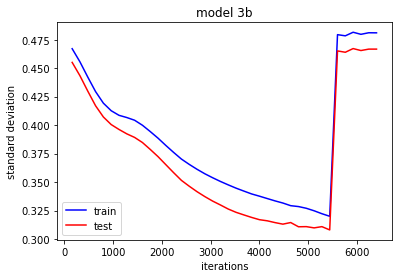

In [74]:
plt.plot(res3b[1,:],res3b[2,:],'-',color='blue',label='train')
plt.plot(res3b[1,:],res3b[3,:],'-',color='red',label='test')
plt.xlabel("iterations")
plt.title("model 3b")
plt.ylabel("standard deviation")
plt.legend(loc="best")

The regularization of 0.01 seems too strong. Train is never better than test. Sometimes it jumps up again. 

In [100]:
model3c= Sequential(
    [              
        tf.keras.Input(shape=(1197,)),  
        Dense(15, activation="relu",kernel_regularizer=tf.keras.regularizers.L1(0.001), name="layer1"),   
        Dense(1, activation = 'linear',kernel_regularizer=tf.keras.regularizers.L1(0.001),name="layer2")
    ], name = "model3c"
) 
model3c.summary()

Model: "model3c"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 layer1 (Dense)              (None, 15)                17970     
                                                                 
 layer2 (Dense)              (None, 1)                 16        
                                                                 
Total params: 17,986
Trainable params: 17,986
Non-trainable params: 0
_________________________________________________________________


In [101]:
model3c.compile(
    loss=tf.keras.losses.MeanSquaredError(), 
    optimizer=tf.keras.optimizers.Adam(0.001),
)


In [102]:
res3c=np.zeros((6,40))
#tf.keras.utils.set_random_seed(1306)
for i in range(40):
    print(i)
    model3c.fit(
        xsel_train,y_train,
        epochs=160,batch_size=74
        )
    prediction3trc = model3c.predict(trainre)
    prediction3tec = model3c.predict(testre)
    res3c[0,i]=i
    res3c[1,i]=(i+1)*160
    res3c[2,i]=np.std(y_train-prediction3trc[:,0])
    res3c[3,i]=np.std(y_test-prediction3tec[:,0])
    res3c[4,i]=np.mean((y_train-prediction3trc[:,0])**2)
    res3c[5,i]=np.mean((y_test-prediction3tec[:,0])**2)  

0
Epoch 1/160
1/1 [==============================] - 0s 285ms/step - loss: 3.7182
Epoch 2/160
1/1 [==============================] - 0s 7ms/step - loss: 1.2608
Epoch 3/160
1/1 [==============================] - 0s 6ms/step - loss: 2.7213
Epoch 4/160
1/1 [==============================] - 0s 6ms/step - loss: 2.1041
Epoch 5/160
1/1 [==============================] - 0s 5ms/step - loss: 1.0942
Epoch 6/160
1/1 [==============================] - 0s 4ms/step - loss: 0.8618
Epoch 7/160
1/1 [==============================] - 0s 6ms/step - loss: 1.3288
Epoch 8/160
1/1 [==============================] - 0s 7ms/step - loss: 1.6721
Epoch 9/160
1/1 [==============================] - 0s 7ms/step - loss: 1.4926
Epoch 10/160
1/1 [==============================] - 0s 5ms/step - loss: 1.0618
Epoch 11/160
1/1 [==============================] - 0s 7ms/step - loss: 0.7998
Epoch 12/160
1/1 [==============================] - 0s 5ms/step - loss: 0.8656
Epoch 13/160
1/1 [==============================] - 0s 8m

Epoch 46/160
1/1 [==============================] - 0s 6ms/step - loss: 0.4754
Epoch 47/160
1/1 [==============================] - 0s 6ms/step - loss: 0.4748
Epoch 48/160
1/1 [==============================] - 0s 4ms/step - loss: 0.4748
Epoch 49/160
1/1 [==============================] - 0s 7ms/step - loss: 0.4800
Epoch 50/160
1/1 [==============================] - 0s 4ms/step - loss: 0.5043
Epoch 51/160
1/1 [==============================] - 0s 5ms/step - loss: 0.5612
Epoch 52/160
1/1 [==============================] - 0s 6ms/step - loss: 0.5556
Epoch 53/160
1/1 [==============================] - 0s 7ms/step - loss: 0.4722
Epoch 54/160
1/1 [==============================] - 0s 6ms/step - loss: 0.5204
Epoch 55/160
1/1 [==============================] - 0s 7ms/step - loss: 0.5055
Epoch 56/160
1/1 [==============================] - 0s 7ms/step - loss: 0.4733
Epoch 57/160
1/1 [==============================] - 0s 6ms/step - loss: 0.4986
Epoch 58/160
1/1 [==============================] - 

1/1 [==============================] - 0s 6ms/step - loss: 0.4298
Epoch 150/160
1/1 [==============================] - 0s 5ms/step - loss: 0.4295
Epoch 151/160
1/1 [==============================] - 0s 5ms/step - loss: 0.4291
Epoch 152/160
1/1 [==============================] - 0s 6ms/step - loss: 0.4288
Epoch 153/160
1/1 [==============================] - 0s 6ms/step - loss: 0.4284
Epoch 154/160
1/1 [==============================] - 0s 6ms/step - loss: 0.4281
Epoch 155/160
1/1 [==============================] - 0s 5ms/step - loss: 0.4277
Epoch 156/160
1/1 [==============================] - 0s 6ms/step - loss: 0.4273
Epoch 157/160
1/1 [==============================] - 0s 6ms/step - loss: 0.4270
Epoch 158/160
1/1 [==============================] - 0s 7ms/step - loss: 0.4266
Epoch 159/160
1/1 [==============================] - 0s 5ms/step - loss: 0.4263
Epoch 160/160
2/2 [==============================] - 0s 3ms/step
2
Epoch 1/160
1/1 [==============================] - 0s 7ms/step - lo

1/1 [==============================] - 0s 5ms/step - loss: 0.3766
Epoch 33/160
1/1 [==============================] - 0s 6ms/step - loss: 0.3768
Epoch 34/160
1/1 [==============================] - 0s 5ms/step - loss: 0.3774
Epoch 35/160
1/1 [==============================] - 0s 5ms/step - loss: 0.3779
Epoch 36/160
1/1 [==============================] - 0s 6ms/step - loss: 0.3786
Epoch 37/160
1/1 [==============================] - 0s 6ms/step - loss: 0.3792
Epoch 38/160
1/1 [==============================] - 0s 5ms/step - loss: 0.3798
Epoch 39/160
1/1 [==============================] - 0s 7ms/step - loss: 0.3799
Epoch 40/160
1/1 [==============================] - 0s 8ms/step - loss: 0.3797
Epoch 41/160
1/1 [==============================] - 0s 6ms/step - loss: 0.3787
Epoch 42/160
1/1 [==============================] - 0s 6ms/step - loss: 0.3772
Epoch 43/160
1/1 [==============================] - 0s 6ms/step - loss: 0.3750
Epoch 44/160
1/1 [==============================] - 0s 4ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.3459
Epoch 78/160
1/1 [==============================] - 0s 6ms/step - loss: 0.3455
Epoch 79/160
1/1 [==============================] - 0s 5ms/step - loss: 0.3433
Epoch 80/160
1/1 [==============================] - 0s 8ms/step - loss: 0.3395
Epoch 81/160
1/1 [==============================] - 0s 6ms/step - loss: 0.3346
Epoch 82/160
1/1 [==============================] - 0s 8ms/step - loss: 0.3299
Epoch 83/160
1/1 [==============================] - 0s 6ms/step - loss: 0.3263
Epoch 84/160
1/1 [==============================] - 0s 6ms/step - loss: 0.3243
Epoch 85/160
1/1 [==============================] - 0s 6ms/step - loss: 0.3240
Epoch 86/160
1/1 [==============================] - 0s 6ms/step - loss: 0.3250
Epoch 87/160
1/1 [==============================] - 0s 5ms/step - loss: 0.3268
Epoch 88/160
1/1 [==============================] - 0s 6ms/step - loss: 0.3290
Epoch 89/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 7ms/step - loss: 0.2917
Epoch 122/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2915
Epoch 123/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2906
Epoch 124/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2893
Epoch 125/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2878
Epoch 126/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2865
Epoch 127/160
1/1 [==============================] - 0s 4ms/step - loss: 0.2853
Epoch 128/160
1/1 [==============================] - 0s 4ms/step - loss: 0.2844
Epoch 129/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2838
Epoch 130/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2834
Epoch 131/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2831
Epoch 132/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2829
Epoch 133/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 7ms/step - loss: 0.2507
Epoch 5/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2511
Epoch 6/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2521
Epoch 7/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2537
Epoch 8/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2565
Epoch 9/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2608
Epoch 10/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2675
Epoch 11/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2770
Epoch 12/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2899
Epoch 13/160
1/1 [==============================] - 0s 5ms/step - loss: 0.3008
Epoch 14/160
1/1 [==============================] - 0s 6ms/step - loss: 0.3113
Epoch 15/160
1/1 [==============================] - 0s 7ms/step - loss: 0.3068
Epoch 16/160
1/1 [==============================] - 0s 6ms/step - loss

Epoch 49/160
1/1 [==============================] - 0s 4ms/step - loss: 0.2227
Epoch 50/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2234
Epoch 51/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2236
Epoch 52/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2228
Epoch 53/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2217
Epoch 54/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2211
Epoch 55/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2211
Epoch 56/160
1/1 [==============================] - 0s 4ms/step - loss: 0.2214
Epoch 57/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2215
Epoch 58/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2211
Epoch 59/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2204
Epoch 60/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2199
Epoch 61/160
1/1 [==============================] - 

1/1 [==============================] - 0s 6ms/step - loss: 0.2072
Epoch 153/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2072
Epoch 154/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2070
Epoch 155/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2067
Epoch 156/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2064
Epoch 157/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2062
Epoch 158/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2062
Epoch 159/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2062
Epoch 160/160
2/2 [==============================] - 0s 2ms/step
9
Epoch 1/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2059
Epoch 2/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2056
Epoch 3/160
1/1 [==============================] - 0s 8ms/step - loss: 0.2054
Epoch 4/160
1/1 [==============================] - 0s 7ms/step - loss: 0.

1/1 [==============================] - 0s 4ms/step - loss: 0.1847
Epoch 36/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1857
Epoch 37/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1869
Epoch 38/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1886
Epoch 39/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1905
Epoch 40/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1930
Epoch 41/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1959
Epoch 42/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1994
Epoch 43/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2024
Epoch 44/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2042
Epoch 45/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2022
Epoch 46/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1983
Epoch 47/160
1/1 [==============================] - 0s 7ms/step -

1/1 [==============================] - 0s 5ms/step - loss: 0.1772
Epoch 81/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1758
Epoch 82/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1747
Epoch 83/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1735
Epoch 84/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1722
Epoch 85/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1709
Epoch 86/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1696
Epoch 87/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1684
Epoch 88/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1674
Epoch 89/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1666
Epoch 90/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1660
Epoch 91/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1656
Epoch 92/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 7ms/step - loss: 0.1506
Epoch 125/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1506
Epoch 126/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1505
Epoch 127/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1505
Epoch 128/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1504
Epoch 129/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1504
Epoch 130/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1503
Epoch 131/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1503
Epoch 132/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1503
Epoch 133/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1503
Epoch 134/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1504
Epoch 135/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1506
Epoch 136/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 6ms/step - loss: 0.1412
Epoch 8/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1405
Epoch 9/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1399
Epoch 10/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1397
Epoch 11/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1397
Epoch 12/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1400
Epoch 13/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1403
Epoch 14/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1405
Epoch 15/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1407
Epoch 16/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1406
Epoch 17/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1404
Epoch 18/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1401
Epoch 19/160
1/1 [==============================] - 0s 5ms/step - l

1/1 [==============================] - 0s 6ms/step - loss: 0.2229
Epoch 53/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2449
Epoch 54/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2488
Epoch 55/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2265
Epoch 56/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1849
Epoch 57/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1473
Epoch 58/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1317
Epoch 59/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1409
Epoch 60/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1624
Epoch 61/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1782
Epoch 62/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1768
Epoch 63/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1593
Epoch 64/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 7ms/step - loss: 0.1279
Epoch 156/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1282
Epoch 157/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1287
Epoch 158/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1295
Epoch 159/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1307
Epoch 160/160
2/2 [==============================] - 0s 3ms/step
16
Epoch 1/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1353
Epoch 2/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1395
Epoch 3/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1454
Epoch 4/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1524
Epoch 5/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1601
Epoch 6/160
1/1 [==============================] - 0s 9ms/step - loss: 0.1669
Epoch 7/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1727


1/1 [==============================] - 0s 5ms/step - loss: 0.1334
Epoch 39/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1273
Epoch 40/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1232
Epoch 41/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1224
Epoch 42/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1242
Epoch 43/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1272
Epoch 44/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1298
Epoch 45/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1308
Epoch 46/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1303
Epoch 47/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1283
Epoch 48/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1257
Epoch 49/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1235
Epoch 50/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.1192
Epoch 84/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1196
Epoch 85/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1200
Epoch 86/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1204
Epoch 87/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1207
Epoch 88/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1211
Epoch 89/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1215
Epoch 90/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1220
Epoch 91/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1224
Epoch 92/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1229
Epoch 93/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1234
Epoch 94/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1241
Epoch 95/160
1/1 [==============================] - 0s 9ms/step -

1/1 [==============================] - 0s 4ms/step - loss: 0.1462
Epoch 128/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1568
Epoch 129/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1699
Epoch 130/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1803
Epoch 131/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1897
Epoch 132/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1891
Epoch 133/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1819
Epoch 134/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1595
Epoch 135/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1363
Epoch 136/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1186
Epoch 137/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1133
Epoch 138/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1186
Epoch 139/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 7ms/step - loss: 0.1281
Epoch 11/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1234
Epoch 12/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1170
Epoch 13/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1116
Epoch 14/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1094
Epoch 15/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1106
Epoch 16/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1137
Epoch 17/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1170
Epoch 18/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1183
Epoch 19/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1177
Epoch 20/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1151
Epoch 21/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1123
Epoch 22/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 56/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1079
Epoch 57/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1076
Epoch 58/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1075
Epoch 59/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1073
Epoch 60/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1071
Epoch 61/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1070
Epoch 62/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1070
Epoch 63/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1070
Epoch 64/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1071
Epoch 65/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1072
Epoch 66/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1074
Epoch 67/160
1/1 [==============================] - 0s 7ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.1253
Epoch 159/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1202
Epoch 160/160
2/2 [==============================] - 0s 2ms/step
23
Epoch 1/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1078
Epoch 2/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1047
Epoch 3/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1043
Epoch 4/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1058
Epoch 5/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1083
Epoch 6/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1118
Epoch 7/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1153
Epoch 8/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1196
Epoch 9/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1230
Epoch 10/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1274
Epoch

1/1 [==============================] - 0s 6ms/step - loss: 0.1479
Epoch 42/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1458
Epoch 43/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1459
Epoch 44/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1463
Epoch 45/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1445
Epoch 46/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1457
Epoch 47/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1445
Epoch 48/160
1/1 [==============================] - 0s 8ms/step - loss: 0.1443
Epoch 49/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1447
Epoch 50/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1435
Epoch 51/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1440
Epoch 52/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1434
Epoch 53/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 8ms/step - loss: 0.1263
Epoch 87/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1263
Epoch 88/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1262
Epoch 89/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1262
Epoch 90/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1261
Epoch 91/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1261
Epoch 92/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1260
Epoch 93/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1260
Epoch 94/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1259
Epoch 95/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1259
Epoch 96/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1258
Epoch 97/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1258
Epoch 98/160
1/1 [==============================] - 0s 7ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.1206
Epoch 131/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1205
Epoch 132/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1203
Epoch 133/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1196
Epoch 134/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1192
Epoch 135/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1193
Epoch 136/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1194
Epoch 137/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1196
Epoch 138/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1201
Epoch 139/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1211
Epoch 140/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1235
Epoch 141/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1288
Epoch 142/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 7ms/step - loss: 0.1156
Epoch 14/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1155
Epoch 15/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1154
Epoch 16/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1154
Epoch 17/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1153
Epoch 18/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1153
Epoch 19/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1152
Epoch 20/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1152
Epoch 21/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1151
Epoch 22/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1151
Epoch 23/160
1/1 [==============================] - 0s 8ms/step - loss: 0.1150
Epoch 24/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1150
Epoch 25/160
1/1 [==============================] - 0s 7ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.1134
Epoch 59/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1118
Epoch 60/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1159
Epoch 61/160
1/1 [==============================] - 0s 8ms/step - loss: 0.1230
Epoch 62/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1324
Epoch 63/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1366
Epoch 64/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1322
Epoch 65/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1209
Epoch 66/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1124
Epoch 67/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1128
Epoch 68/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1194
Epoch 69/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1244
Epoch 70/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 5ms/step - loss: 0.1091
Epoch 104/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1089
Epoch 105/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1106
Epoch 106/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1122
Epoch 107/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1120
Epoch 108/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1103
Epoch 109/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1089
Epoch 110/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1087
Epoch 111/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1095
Epoch 112/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1101
Epoch 113/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1097
Epoch 114/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1087
Epoch 115/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 6ms/step - loss: 0.1039
Epoch 148/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1041
Epoch 149/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1043
Epoch 150/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1045
Epoch 151/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1048
Epoch 152/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1051
Epoch 153/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1056
Epoch 154/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1061
Epoch 155/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1067
Epoch 156/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1074
Epoch 157/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1084
Epoch 158/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1094
Epoch 159/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 5ms/step - loss: 0.1010
Epoch 31/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1017
Epoch 32/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1028
Epoch 33/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1039
Epoch 34/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1057
Epoch 35/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1075
Epoch 36/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1102
Epoch 37/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1119
Epoch 38/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1147
Epoch 39/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1149
Epoch 40/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1158
Epoch 41/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1128
Epoch 42/160
1/1 [==============================] - 0s 7ms/step -

1/1 [==============================] - 0s 7ms/step - loss: 0.1169
Epoch 76/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1151
Epoch 77/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1133
Epoch 78/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1086
Epoch 79/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1048
Epoch 80/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1009
Epoch 81/160
1/1 [==============================] - 0s 8ms/step - loss: 0.0982
Epoch 82/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0964
Epoch 83/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0956
Epoch 84/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0955
Epoch 85/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0960
Epoch 86/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0969
Epoch 87/160
1/1 [==============================] - 0s 5ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.0924
Epoch 120/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0927
Epoch 121/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0930
Epoch 122/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0934
Epoch 123/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0937
Epoch 124/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0941
Epoch 125/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0944
Epoch 126/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0948
Epoch 127/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0949
Epoch 128/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0951
Epoch 129/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0951
Epoch 130/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0952
Epoch 131/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 7ms/step - loss: 0.0909
Epoch 62/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0908
Epoch 63/160
1/1 [==============================] - 0s 8ms/step - loss: 0.0907
Epoch 64/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0906
Epoch 65/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0906
Epoch 66/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0906
Epoch 67/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0906
Epoch 68/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0905
Epoch 69/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0905
Epoch 70/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0905
Epoch 71/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0905
Epoch 72/160
1/1 [==============================] - 0s 8ms/step - loss: 0.0905
Epoch 73/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.0996
Epoch 106/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0950
Epoch 107/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0905
Epoch 108/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0883
Epoch 109/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0876
Epoch 110/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0883
Epoch 111/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0902
Epoch 112/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0925
Epoch 113/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0956
Epoch 114/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0976
Epoch 115/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1006
Epoch 116/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1009
Epoch 117/160
1/1 [==============================] - 0

Epoch 47/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1050
Epoch 48/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1011
Epoch 49/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0993
Epoch 50/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0948
Epoch 51/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0921
Epoch 52/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0893
Epoch 53/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0877
Epoch 54/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0866
Epoch 55/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0861
Epoch 56/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0859
Epoch 57/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0858
Epoch 58/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0859
Epoch 59/160
1/1 [==============================] - 

1/1 [==============================] - 0s 6ms/step - loss: 0.1119
Epoch 151/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1196
Epoch 152/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1160
Epoch 153/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1169
Epoch 154/160
1/1 [==============================] - 0s 8ms/step - loss: 0.1067
Epoch 155/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1010
Epoch 156/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0921
Epoch 157/160
1/1 [==============================] - 0s 4ms/step - loss: 0.0870
Epoch 158/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0850
Epoch 159/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0847
Epoch 160/160
2/2 [==============================] - 0s 2ms/step
39
Epoch 1/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1892
Epoch 2/160
1/1 [==============================] - 0s 7ms/step - los

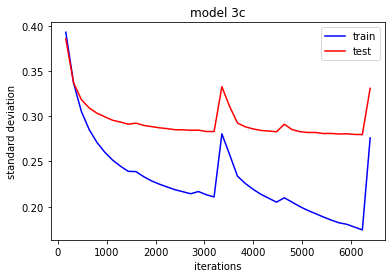

In [78]:
plt.plot(res3c[1,:],res3c[2,:],'-',color='blue',label='train')
plt.plot(res3c[1,:],res3c[3,:],'-',color='red',label='test')
plt.xlabel("iterations")
plt.title("model 3c")
plt.ylabel("standard deviation")
plt.legend(loc="best")

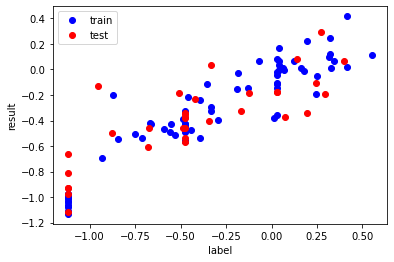

In [46]:
plt.plot(y_train,prediction3trc,'o',color='blue',label='train')
plt.plot(y_test,prediction3tec,'o',color='red',label='test')
plt.xlabel("label")
plt.ylabel("result")
plt.legend(loc="best")

Model is overfitting. That means the regularization parameter is too small. It also can jumps up again. 

In [36]:
model3d= Sequential(
    [              
        tf.keras.Input(shape=(1197,)),  
        Dense(15, activation="relu",kernel_regularizer=tf.keras.regularizers.L1(0.003), name="layer1"),   
        Dense(1, activation = 'linear',kernel_regularizer=tf.keras.regularizers.L1(0.003),name="layer2")
    ], name = "model3d"
) 
model3d.summary()

Model: "model3d"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 layer1 (Dense)              (None, 15)                17970     
                                                                 
 layer2 (Dense)              (None, 1)                 16        
                                                                 
Total params: 17,986
Trainable params: 17,986
Non-trainable params: 0
_________________________________________________________________


In [37]:
model3d.compile(
    loss=tf.keras.losses.MeanSquaredError(), 
    optimizer=tf.keras.optimizers.Adam(0.001),
)


In [38]:
res3d=np.zeros((6,40))
#tf.keras.utils.set_random_seed(1306)
for i in range(40):
    print(i)
    model3d.fit(
        xsel_train,y_train,
        epochs=160,batch_size=74
        )
    prediction3trd = model3d.predict(trainre)
    prediction3ted = model3d.predict(testre)
    res3d[0,i]=i
    res3d[1,i]=(i+1)*160
    res3d[2,i]=np.std(y_train-prediction3trd[:,0])
    res3d[3,i]=np.std(y_test-prediction3ted[:,0])
    res3d[4,i]=np.mean((y_train-prediction3trd[:,0])**2)
    res3d[5,i]=np.mean((y_test-prediction3ted[:,0])**2)

0
Epoch 1/160
1/1 [==============================] - 0s 278ms/step - loss: 11.4523
Epoch 2/160
1/1 [==============================] - 0s 6ms/step - loss: 2.6723
Epoch 3/160
1/1 [==============================] - 0s 7ms/step - loss: 2.1224
Epoch 4/160
1/1 [==============================] - 0s 6ms/step - loss: 2.1774
Epoch 5/160
1/1 [==============================] - 0s 5ms/step - loss: 2.1918
Epoch 6/160
1/1 [==============================] - 0s 7ms/step - loss: 2.1509
Epoch 7/160
1/1 [==============================] - 0s 7ms/step - loss: 2.0811
Epoch 8/160
1/1 [==============================] - 0s 6ms/step - loss: 2.0110
Epoch 9/160
1/1 [==============================] - 0s 6ms/step - loss: 1.9592
Epoch 10/160
1/1 [==============================] - 0s 6ms/step - loss: 1.9316
Epoch 11/160
1/1 [==============================] - 0s 9ms/step - loss: 1.9228
Epoch 12/160
1/1 [==============================] - 0s 5ms/step - loss: 1.9127
Epoch 13/160
1/1 [==============================] - 0s 6

Epoch 46/160
1/1 [==============================] - 0s 8ms/step - loss: 1.0028
Epoch 47/160
1/1 [==============================] - 0s 6ms/step - loss: 1.0014
Epoch 48/160
1/1 [==============================] - 0s 6ms/step - loss: 1.0002
Epoch 49/160
1/1 [==============================] - 0s 6ms/step - loss: 0.9996
Epoch 50/160
1/1 [==============================] - 0s 5ms/step - loss: 0.9987
Epoch 51/160
1/1 [==============================] - 0s 7ms/step - loss: 0.9976
Epoch 52/160
1/1 [==============================] - 0s 5ms/step - loss: 0.9946
Epoch 53/160
1/1 [==============================] - 0s 7ms/step - loss: 0.9911
Epoch 54/160
1/1 [==============================] - 0s 6ms/step - loss: 0.9881
Epoch 55/160
1/1 [==============================] - 0s 6ms/step - loss: 0.9866
Epoch 56/160
1/1 [==============================] - 0s 6ms/step - loss: 0.9860
Epoch 57/160
1/1 [==============================] - 0s 8ms/step - loss: 0.9849
Epoch 58/160
1/1 [==============================] - 

1/1 [==============================] - 0s 6ms/step - loss: 0.8468
Epoch 150/160
1/1 [==============================] - 0s 5ms/step - loss: 0.8402
Epoch 151/160
1/1 [==============================] - 0s 6ms/step - loss: 0.8421
Epoch 152/160
1/1 [==============================] - 0s 6ms/step - loss: 0.8485
Epoch 153/160
1/1 [==============================] - 0s 6ms/step - loss: 0.8397
Epoch 154/160
1/1 [==============================] - 0s 4ms/step - loss: 0.8361
Epoch 155/160
1/1 [==============================] - 0s 6ms/step - loss: 0.8407
Epoch 156/160
1/1 [==============================] - 0s 5ms/step - loss: 0.8353
Epoch 157/160
1/1 [==============================] - 0s 6ms/step - loss: 0.8313
Epoch 158/160
1/1 [==============================] - 0s 6ms/step - loss: 0.8339
Epoch 159/160
1/1 [==============================] - 0s 8ms/step - loss: 0.8325
Epoch 160/160
2/2 [==============================] - 0s 2ms/step
2
Epoch 1/160
1/1 [==============================] - 0s 7ms/step - lo

1/1 [==============================] - 0s 7ms/step - loss: 0.6382
Epoch 33/160
1/1 [==============================] - 0s 6ms/step - loss: 0.6375
Epoch 34/160
1/1 [==============================] - 0s 6ms/step - loss: 0.6358
Epoch 35/160
1/1 [==============================] - 0s 7ms/step - loss: 0.6346
Epoch 36/160
1/1 [==============================] - 0s 7ms/step - loss: 0.6348
Epoch 37/160
1/1 [==============================] - 0s 6ms/step - loss: 0.6348
Epoch 38/160
1/1 [==============================] - 0s 6ms/step - loss: 0.6333
Epoch 39/160
1/1 [==============================] - 0s 7ms/step - loss: 0.6313
Epoch 40/160
1/1 [==============================] - 0s 4ms/step - loss: 0.6306
Epoch 41/160
1/1 [==============================] - 0s 7ms/step - loss: 0.6303
Epoch 42/160
1/1 [==============================] - 0s 5ms/step - loss: 0.6295
Epoch 43/160
1/1 [==============================] - 0s 7ms/step - loss: 0.6283
Epoch 44/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 5ms/step - loss: 0.4725
Epoch 78/160
1/1 [==============================] - 0s 6ms/step - loss: 0.4720
Epoch 79/160
1/1 [==============================] - 0s 5ms/step - loss: 0.4714
Epoch 80/160
1/1 [==============================] - 0s 5ms/step - loss: 0.4709
Epoch 81/160
1/1 [==============================] - 0s 7ms/step - loss: 0.4710
Epoch 82/160
1/1 [==============================] - 0s 7ms/step - loss: 0.4706
Epoch 83/160
1/1 [==============================] - 0s 4ms/step - loss: 0.4690
Epoch 84/160
1/1 [==============================] - 0s 5ms/step - loss: 0.4679
Epoch 85/160
1/1 [==============================] - 0s 5ms/step - loss: 0.4672
Epoch 86/160
1/1 [==============================] - 0s 5ms/step - loss: 0.4663
Epoch 87/160
1/1 [==============================] - 0s 5ms/step - loss: 0.4654
Epoch 88/160
1/1 [==============================] - 0s 6ms/step - loss: 0.4647
Epoch 89/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 5ms/step - loss: 0.3454
Epoch 122/160
1/1 [==============================] - 0s 4ms/step - loss: 0.3471
Epoch 123/160
1/1 [==============================] - 0s 7ms/step - loss: 0.3501
Epoch 124/160
1/1 [==============================] - 0s 5ms/step - loss: 0.3466
Epoch 125/160
1/1 [==============================] - 0s 4ms/step - loss: 0.3439
Epoch 126/160
1/1 [==============================] - 0s 6ms/step - loss: 0.3423
Epoch 127/160
1/1 [==============================] - 0s 6ms/step - loss: 0.3434
Epoch 128/160
1/1 [==============================] - 0s 5ms/step - loss: 0.3482
Epoch 129/160
1/1 [==============================] - 0s 5ms/step - loss: 0.3461
Epoch 130/160
1/1 [==============================] - 0s 5ms/step - loss: 0.3421
Epoch 131/160
1/1 [==============================] - 0s 6ms/step - loss: 0.3399
Epoch 132/160
1/1 [==============================] - 0s 8ms/step - loss: 0.3421
Epoch 133/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 5ms/step - loss: 0.2680
Epoch 5/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2673
Epoch 6/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2672
Epoch 7/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2667
Epoch 8/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2667
Epoch 9/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2662
Epoch 10/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2662
Epoch 11/160
1/1 [==============================] - 0s 4ms/step - loss: 0.2657
Epoch 12/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2657
Epoch 13/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2651
Epoch 14/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2649
Epoch 15/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2643
Epoch 16/160
1/1 [==============================] - 0s 6ms/step - loss

Epoch 49/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2088
Epoch 50/160
1/1 [==============================] - 0s 4ms/step - loss: 0.2099
Epoch 51/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2126
Epoch 52/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2165
Epoch 53/160
1/1 [==============================] - 0s 4ms/step - loss: 0.2177
Epoch 54/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2163
Epoch 55/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2121
Epoch 56/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2090
Epoch 57/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2071
Epoch 58/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2067
Epoch 59/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2064
Epoch 60/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2075
Epoch 61/160
1/1 [==============================] - 

1/1 [==============================] - 0s 12ms/step - loss: 0.1861
Epoch 153/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1871
Epoch 154/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1846
Epoch 155/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1838
Epoch 156/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1831
Epoch 157/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1836
Epoch 158/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1843
Epoch 159/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1860
Epoch 160/160
2/2 [==============================] - 0s 4ms/step
9
Epoch 1/160
1/1 [==============================] - 0s 9ms/step - loss: 0.1831
Epoch 2/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1823
Epoch 3/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1826
Epoch 4/160
1/1 [==============================] - 0s 5ms/step - loss: 0

1/1 [==============================] - 0s 6ms/step - loss: 0.1463
Epoch 36/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1459
Epoch 37/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1460
Epoch 38/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1457
Epoch 39/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1460
Epoch 40/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1458
Epoch 41/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1460
Epoch 42/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1453
Epoch 43/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1452
Epoch 44/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1446
Epoch 45/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1446
Epoch 46/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1443
Epoch 47/160
1/1 [==============================] - 0s 5ms/step -

1/1 [==============================] - 0s 5ms/step - loss: 0.1216
Epoch 81/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1213
Epoch 82/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1215
Epoch 83/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1218
Epoch 84/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1227
Epoch 85/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1236
Epoch 86/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1245
Epoch 87/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1263
Epoch 88/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1269
Epoch 89/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1276
Epoch 90/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1263
Epoch 91/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1253
Epoch 92/160
1/1 [==============================] - 0s 5ms/step -

1/1 [==============================] - 0s 5ms/step - loss: 0.1151
Epoch 125/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1154
Epoch 126/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1159
Epoch 127/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1163
Epoch 128/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1163
Epoch 129/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1175
Epoch 130/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1180
Epoch 131/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1194
Epoch 132/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1185
Epoch 133/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1185
Epoch 134/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1171
Epoch 135/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1168
Epoch 136/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 6ms/step - loss: 0.1128
Epoch 8/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1129
Epoch 9/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1130
Epoch 10/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1132
Epoch 11/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1135
Epoch 12/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1137
Epoch 13/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1139
Epoch 14/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1139
Epoch 15/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1138
Epoch 16/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1134
Epoch 17/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1130
Epoch 18/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1126
Epoch 19/160
1/1 [==============================] - 0s 6ms/step - l

1/1 [==============================] - 0s 5ms/step - loss: 0.1118
Epoch 53/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1124
Epoch 54/160
1/1 [==============================] - 0s 8ms/step - loss: 0.1113
Epoch 55/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1106
Epoch 56/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1101
Epoch 57/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1098
Epoch 58/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1102
Epoch 59/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1109
Epoch 60/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1116
Epoch 61/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1125
Epoch 62/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1116
Epoch 63/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1111
Epoch 64/160
1/1 [==============================] - 0s 5ms/step -

1/1 [==============================] - 0s 5ms/step - loss: 0.1096
Epoch 156/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1092
Epoch 157/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1091
Epoch 158/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1090
Epoch 159/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1093
Epoch 160/160
2/2 [==============================] - 0s 3ms/step
16
Epoch 1/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1103
Epoch 2/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1101
Epoch 3/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1102
Epoch 4/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1095
Epoch 5/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1092
Epoch 6/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1089
Epoch 7/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1090


1/1 [==============================] - 0s 5ms/step - loss: 0.1069
Epoch 39/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1073
Epoch 40/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1067
Epoch 41/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1067
Epoch 42/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1070
Epoch 43/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1078
Epoch 44/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1075
Epoch 45/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1077
Epoch 46/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1069
Epoch 47/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1067
Epoch 48/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1067
Epoch 49/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1074
Epoch 50/160
1/1 [==============================] - 0s 5ms/step -

1/1 [==============================] - 0s 4ms/step - loss: 0.1059
Epoch 84/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1065
Epoch 85/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1076
Epoch 86/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1081
Epoch 87/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1062
Epoch 88/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1047
Epoch 89/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1040
Epoch 90/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1043
Epoch 91/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1050
Epoch 92/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1048
Epoch 93/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1055
Epoch 94/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1054
Epoch 95/160
1/1 [==============================] - 0s 5ms/step -

1/1 [==============================] - 0s 5ms/step - loss: 0.1037
Epoch 128/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1034
Epoch 129/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1035
Epoch 130/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1039
Epoch 131/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1043
Epoch 132/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1030
Epoch 133/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1014
Epoch 134/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1005
Epoch 135/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1005
Epoch 136/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1006
Epoch 137/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1016
Epoch 138/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1035
Epoch 139/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 5ms/step - loss: 0.1117
Epoch 11/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1104
Epoch 12/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1092
Epoch 13/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1071
Epoch 14/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1044
Epoch 15/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1014
Epoch 16/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0990
Epoch 17/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0985
Epoch 18/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0983
Epoch 19/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0983
Epoch 20/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0984
Epoch 21/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0985
Epoch 22/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.3023
Epoch 56/160
1/1 [==============================] - 0s 7ms/step - loss: 0.3019
Epoch 57/160
1/1 [==============================] - 0s 7ms/step - loss: 0.3019
Epoch 58/160
1/1 [==============================] - 0s 5ms/step - loss: 0.3015
Epoch 59/160
1/1 [==============================] - 0s 6ms/step - loss: 0.3009
Epoch 60/160
1/1 [==============================] - 0s 6ms/step - loss: 0.3004
Epoch 61/160
1/1 [==============================] - 0s 5ms/step - loss: 0.3000
Epoch 62/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2996
Epoch 63/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2990
Epoch 64/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2982
Epoch 65/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2975
Epoch 66/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2975
Epoch 67/160
1/1 [==============================] - 0s 5ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.2953
Epoch 159/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2947
Epoch 160/160
2/2 [==============================] - 0s 2ms/step
23
Epoch 1/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2942
Epoch 2/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2942
Epoch 3/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2943
Epoch 4/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2941
Epoch 5/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2937
Epoch 6/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2932
Epoch 7/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2930
Epoch 8/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2929
Epoch 9/160
1/1 [==============================] - 0s 4ms/step - loss: 0.2928
Epoch 10/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2926
Epoch

1/1 [==============================] - 0s 5ms/step - loss: 0.2711
Epoch 42/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2710
Epoch 43/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2709
Epoch 44/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2709
Epoch 45/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2709
Epoch 46/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2708
Epoch 47/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2707
Epoch 48/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2707
Epoch 49/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2706
Epoch 50/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2705
Epoch 51/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2705
Epoch 52/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2705
Epoch 53/160
1/1 [==============================] - 0s 5ms/step -

1/1 [==============================] - 0s 7ms/step - loss: 0.2578
Epoch 87/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2576
Epoch 88/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2575
Epoch 89/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2574
Epoch 90/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2573
Epoch 91/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2572
Epoch 92/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2571
Epoch 93/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2570
Epoch 94/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2568
Epoch 95/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2568
Epoch 96/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2567
Epoch 97/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2565
Epoch 98/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.2432
Epoch 131/160
1/1 [==============================] - 0s 6ms/step - loss: 0.3570
Epoch 132/160
1/1 [==============================] - 0s 5ms/step - loss: 0.4205
Epoch 133/160
1/1 [==============================] - 0s 6ms/step - loss: 0.3863
Epoch 134/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1650
Epoch 135/160
1/1 [==============================] - 0s 4ms/step - loss: 0.4161
Epoch 136/160
1/1 [==============================] - 0s 5ms/step - loss: 0.4292
Epoch 137/160
1/1 [==============================] - 0s 5ms/step - loss: 0.4317
Epoch 138/160
1/1 [==============================] - 0s 5ms/step - loss: 0.4336
Epoch 139/160
1/1 [==============================] - 0s 5ms/step - loss: 0.4349
Epoch 140/160
1/1 [==============================] - 0s 6ms/step - loss: 0.4357
Epoch 141/160
1/1 [==============================] - 0s 6ms/step - loss: 0.4359
Epoch 142/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 5ms/step - loss: 0.2371
Epoch 14/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2379
Epoch 15/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2370
Epoch 16/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2382
Epoch 17/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2375
Epoch 18/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2377
Epoch 19/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2375
Epoch 20/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2368
Epoch 21/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2368
Epoch 22/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2364
Epoch 23/160
1/1 [==============================] - 0s 4ms/step - loss: 0.2364
Epoch 24/160
1/1 [==============================] - 0s 4ms/step - loss: 0.2358
Epoch 25/160
1/1 [==============================] - 0s 5ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.2074
Epoch 59/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2069
Epoch 60/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2074
Epoch 61/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2062
Epoch 62/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2066
Epoch 63/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2076
Epoch 64/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2064
Epoch 65/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2079
Epoch 66/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2052
Epoch 67/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2073
Epoch 68/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2048
Epoch 69/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2088
Epoch 70/160
1/1 [==============================] - 0s 5ms/step -

1/1 [==============================] - 0s 5ms/step - loss: 0.1892
Epoch 104/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1892
Epoch 105/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1891
Epoch 106/160
1/1 [==============================] - 0s 8ms/step - loss: 0.1890
Epoch 107/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1890
Epoch 108/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1889
Epoch 109/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1889
Epoch 110/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1887
Epoch 111/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1887
Epoch 112/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1886
Epoch 113/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1886
Epoch 114/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1885
Epoch 115/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 7ms/step - loss: 0.1858
Epoch 148/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1821
Epoch 149/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1784
Epoch 150/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1822
Epoch 151/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1780
Epoch 152/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1840
Epoch 153/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1827
Epoch 154/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1804
Epoch 155/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1857
Epoch 156/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1789
Epoch 157/160
1/1 [==============================] - 0s 8ms/step - loss: 0.1827
Epoch 158/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1793
Epoch 159/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 5ms/step - loss: 0.1697
Epoch 31/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1696
Epoch 32/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1695
Epoch 33/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1697
Epoch 34/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1698
Epoch 35/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1700
Epoch 36/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1698
Epoch 37/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1696
Epoch 38/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1693
Epoch 39/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1693
Epoch 40/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1693
Epoch 41/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1695
Epoch 42/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 8ms/step - loss: 0.1635
Epoch 76/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1630
Epoch 77/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1637
Epoch 78/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1636
Epoch 79/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1630
Epoch 80/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1638
Epoch 81/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1636
Epoch 82/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1628
Epoch 83/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1638
Epoch 84/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1638
Epoch 85/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1628
Epoch 86/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1639
Epoch 87/160
1/1 [==============================] - 0s 4ms/step -

1/1 [==============================] - 0s 5ms/step - loss: 0.1657
Epoch 120/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1714
Epoch 121/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1580
Epoch 122/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1703
Epoch 123/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1727
Epoch 124/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1595
Epoch 125/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1883
Epoch 126/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1663
Epoch 127/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1663
Epoch 128/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1810
Epoch 129/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1613
Epoch 130/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1649
Epoch 131/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 6ms/step - loss: 0.1603
Epoch 62/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1583
Epoch 63/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1662
Epoch 64/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1592
Epoch 65/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1593
Epoch 66/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1629
Epoch 67/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1566
Epoch 68/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1610
Epoch 69/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1567
Epoch 70/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1599
Epoch 71/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1582
Epoch 72/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1580
Epoch 73/160
1/1 [==============================] - 0s 7ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.1508
Epoch 106/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1502
Epoch 107/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1502
Epoch 108/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1506
Epoch 109/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1503
Epoch 110/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1501
Epoch 111/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1504
Epoch 112/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1502
Epoch 113/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1500
Epoch 114/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1505
Epoch 115/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1503
Epoch 116/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1500
Epoch 117/160
1/1 [==============================] - 0

Epoch 47/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1494
Epoch 48/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1490
Epoch 49/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1479
Epoch 50/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1499
Epoch 51/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1488
Epoch 52/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1480
Epoch 53/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1498
Epoch 54/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1484
Epoch 55/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1480
Epoch 56/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1493
Epoch 57/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1481
Epoch 58/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1479
Epoch 59/160
1/1 [==============================] - 

1/1 [==============================] - 0s 5ms/step - loss: 0.1456
Epoch 151/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1455
Epoch 152/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1456
Epoch 153/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1458
Epoch 154/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1455
Epoch 155/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1455
Epoch 156/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1455
Epoch 157/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1455
Epoch 158/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1454
Epoch 159/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1455
Epoch 160/160
2/2 [==============================] - 0s 3ms/step
39
Epoch 1/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1454
Epoch 2/160
1/1 [==============================] - 0s 5ms/step - los

NameError: name 'res3c' is not defined

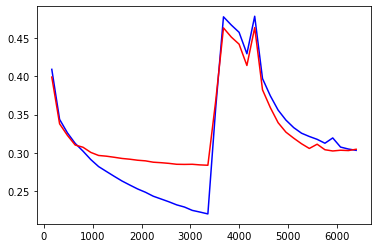

In [39]:
plt.plot(res3d[1,:],res3d[2,:],'-',color='blue',label='train model 3d')
plt.plot(res3d[1,:],res3d[3,:],'-',color='red',label='test model 3d')
plt.plot(res3c[1,:],res3c[2,:],'-',color='green',label='train model 3c')
plt.plot(res3c[1,:],res3c[3,:],'-',color='black',label='test model 3c')
plt.xlabel("iterations")
#plt.title("model 3d")
plt.ylabel("standard deviation")
plt.legend(loc="best")

NameError: name 'res3' is not defined

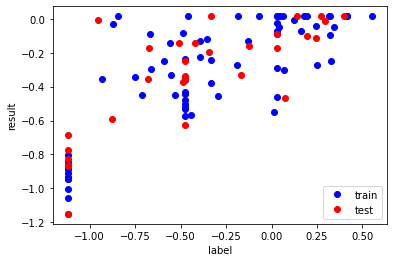

In [40]:
plt.plot(y_train,prediction3trd,'o',color='blue',label='train')
plt.plot(y_test,prediction3ted,'o',color='red',label='test')
plt.xlabel("label")
plt.ylabel("result")
plt.legend(loc="best")
print(f"Best stabdard deviation w/o regularization {round(min(res3[3]),3)}")
print(f"Best stabdard deviation w L1=0.01 {round(min(res3b[3]),3)}")
print(f"Best stabdard deviation w L1=0.001 {round(min(res3d[3]),3)}")
print(f"Best stabdard deviation w L1=0.003 {round(min(res3c[3]),3)}")

As with model 3b, there is the problem that the model sometimes jum,ps to. Besides the regularization still seems too weak, but not by much. Possibly, 3b is about right besides this convergence problem. 
It is less clear how had the models overfit here. While train is better it is not by much and test doe snot get worse at the end of the fitting, as it was without regularization. 
That means the standard deviation avoiding overfitting is about 0.28. 

In [31]:
#increasing regularization
model3e= Sequential(
    [              
        tf.keras.Input(shape=(1197,)),  
        Dense(15, activation="relu",kernel_regularizer=tf.keras.regularizers.L1(0.005), name="layer1"),   
        Dense(1, activation = 'linear',kernel_regularizer=tf.keras.regularizers.L1(0.005),name="layer2")
    ], name = "model3e"
) 
model3e.summary()

Model: "model3e"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 layer1 (Dense)              (None, 15)                17970     
                                                                 
 layer2 (Dense)              (None, 1)                 16        
                                                                 
Total params: 17,986
Trainable params: 17,986
Non-trainable params: 0
_________________________________________________________________


In [32]:
model3e.compile(
    loss=tf.keras.losses.MeanSquaredError(), 
    optimizer=tf.keras.optimizers.Adam(0.001),
)


In [33]:
res3e=np.zeros((6,40))
#tf.keras.utils.set_random_seed(1306)
for i in range(40):
    print(i)
    model3e.fit(
        xsel_train,y_train,
        epochs=160,batch_size=74
        )
    prediction3tre = model3e.predict(trainre)
    prediction3tee = model3e.predict(testre)
    res3e[0,i]=i
    res3e[1,i]=(i+1)*160
    res3e[2,i]=np.std(y_train-prediction3tre[:,0])
    res3e[3,i]=np.std(y_test-prediction3tee[:,0])
    res3e[4,i]=np.mean((y_train-prediction3tre[:,0])**2)
    res3e[5,i]=np.mean((y_test-prediction3tee[:,0])**2)  

0
Epoch 1/160
1/1 [==============================] - 0s 275ms/step - loss: 4.6663
Epoch 2/160
1/1 [==============================] - 0s 4ms/step - loss: 3.3979
Epoch 3/160
1/1 [==============================] - 0s 7ms/step - loss: 3.4004
Epoch 4/160
1/1 [==============================] - 0s 7ms/step - loss: 3.3379
Epoch 5/160
1/1 [==============================] - 0s 7ms/step - loss: 3.2761
Epoch 6/160
1/1 [==============================] - 0s 7ms/step - loss: 3.2150
Epoch 7/160
1/1 [==============================] - 0s 5ms/step - loss: 3.1547
Epoch 8/160
1/1 [==============================] - 0s 6ms/step - loss: 3.0953
Epoch 9/160
1/1 [==============================] - 0s 5ms/step - loss: 3.0368
Epoch 10/160
1/1 [==============================] - 0s 8ms/step - loss: 2.9794
Epoch 11/160
1/1 [==============================] - 0s 7ms/step - loss: 2.9229
Epoch 12/160
1/1 [==============================] - 0s 5ms/step - loss: 2.8672
Epoch 13/160
1/1 [==============================] - 0s 7m

Epoch 46/160
1/1 [==============================] - 0s 7ms/step - loss: 0.9165
Epoch 47/160
1/1 [==============================] - 0s 7ms/step - loss: 0.9150
Epoch 48/160
1/1 [==============================] - 0s 6ms/step - loss: 0.9136
Epoch 49/160
1/1 [==============================] - 0s 6ms/step - loss: 0.9100
Epoch 50/160
1/1 [==============================] - 0s 7ms/step - loss: 0.9089
Epoch 51/160
1/1 [==============================] - 0s 7ms/step - loss: 0.9092
Epoch 52/160
1/1 [==============================] - 0s 5ms/step - loss: 0.9046
Epoch 53/160
1/1 [==============================] - 0s 6ms/step - loss: 0.9023
Epoch 54/160
1/1 [==============================] - 0s 4ms/step - loss: 0.9026
Epoch 55/160
1/1 [==============================] - 0s 7ms/step - loss: 0.8991
Epoch 56/160
1/1 [==============================] - 0s 6ms/step - loss: 0.8965
Epoch 57/160
1/1 [==============================] - 0s 6ms/step - loss: 0.8963
Epoch 58/160
1/1 [==============================] - 

1/1 [==============================] - 0s 6ms/step - loss: 0.7182
Epoch 150/160
1/1 [==============================] - 0s 6ms/step - loss: 0.7172
Epoch 151/160
1/1 [==============================] - 0s 9ms/step - loss: 0.7157
Epoch 152/160
1/1 [==============================] - 0s 5ms/step - loss: 0.7125
Epoch 153/160
1/1 [==============================] - 0s 5ms/step - loss: 0.7090
Epoch 154/160
1/1 [==============================] - 0s 5ms/step - loss: 0.7059
Epoch 155/160
1/1 [==============================] - 0s 6ms/step - loss: 0.7037
Epoch 156/160
1/1 [==============================] - 0s 6ms/step - loss: 0.7025
Epoch 157/160
1/1 [==============================] - 0s 6ms/step - loss: 0.7023
Epoch 158/160
1/1 [==============================] - 0s 6ms/step - loss: 0.7035
Epoch 159/160
1/1 [==============================] - 0s 6ms/step - loss: 0.7070
Epoch 160/160
2/2 [==============================] - 0s 2ms/step
2
Epoch 1/160
1/1 [==============================] - 0s 5ms/step - lo

1/1 [==============================] - 0s 6ms/step - loss: 0.3910
Epoch 33/160
1/1 [==============================] - 0s 6ms/step - loss: 0.4106
Epoch 34/160
1/1 [==============================] - 0s 6ms/step - loss: 0.4244
Epoch 35/160
1/1 [==============================] - 0s 5ms/step - loss: 0.4162
Epoch 36/160
1/1 [==============================] - 0s 4ms/step - loss: 0.3904
Epoch 37/160
1/1 [==============================] - 0s 6ms/step - loss: 0.3991
Epoch 38/160
1/1 [==============================] - 0s 5ms/step - loss: 0.4267
Epoch 39/160
1/1 [==============================] - 0s 5ms/step - loss: 0.4047
Epoch 40/160
1/1 [==============================] - 0s 6ms/step - loss: 0.3829
Epoch 41/160
1/1 [==============================] - 0s 5ms/step - loss: 0.3846
Epoch 42/160
1/1 [==============================] - 0s 5ms/step - loss: 0.3956
Epoch 43/160
1/1 [==============================] - 0s 4ms/step - loss: 0.4041
Epoch 44/160
1/1 [==============================] - 0s 5ms/step -

1/1 [==============================] - 0s 5ms/step - loss: 0.2228
Epoch 78/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2225
Epoch 79/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2223
Epoch 80/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2223
Epoch 81/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2220
Epoch 82/160
1/1 [==============================] - 0s 4ms/step - loss: 0.2209
Epoch 83/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2199
Epoch 84/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2198
Epoch 85/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2195
Epoch 86/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2181
Epoch 87/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2166
Epoch 88/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2160
Epoch 89/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 5ms/step - loss: 0.1874
Epoch 122/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1872
Epoch 123/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1891
Epoch 124/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1918
Epoch 125/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1903
Epoch 126/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1895
Epoch 127/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1877
Epoch 128/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1868
Epoch 129/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1864
Epoch 130/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1863
Epoch 131/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1866
Epoch 132/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1865
Epoch 133/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 6ms/step - loss: 0.1867
Epoch 5/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1921
Epoch 6/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1960
Epoch 7/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1988
Epoch 8/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1887
Epoch 9/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1822
Epoch 10/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1784
Epoch 11/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1756
Epoch 12/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1754
Epoch 13/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1756
Epoch 14/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1761
Epoch 15/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1785
Epoch 16/160
1/1 [==============================] - 0s 6ms/step - loss

Epoch 49/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1740
Epoch 50/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1723
Epoch 51/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1694
Epoch 52/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1677
Epoch 53/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1690
Epoch 54/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1721
Epoch 55/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1729
Epoch 56/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1733
Epoch 57/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1738
Epoch 58/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1718
Epoch 59/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1706
Epoch 60/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1683
Epoch 61/160
1/1 [==============================] - 

1/1 [==============================] - 0s 6ms/step - loss: 0.1696
Epoch 153/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1732
Epoch 154/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1702
Epoch 155/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1665
Epoch 156/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1645
Epoch 157/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1638
Epoch 158/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1648
Epoch 159/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1648
Epoch 160/160
2/2 [==============================] - 0s 2ms/step
9
Epoch 1/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1636
Epoch 2/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1644
Epoch 3/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1653
Epoch 4/160
1/1 [==============================] - 0s 6ms/step - loss: 0.

1/1 [==============================] - 0s 6ms/step - loss: 0.1597
Epoch 36/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1584
Epoch 37/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1586
Epoch 38/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1582
Epoch 39/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1578
Epoch 40/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1577
Epoch 41/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1577
Epoch 42/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1582
Epoch 43/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1569
Epoch 44/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1570
Epoch 45/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1583
Epoch 46/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1577
Epoch 47/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 7ms/step - loss: 0.1511
Epoch 81/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1522
Epoch 82/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1518
Epoch 83/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1516
Epoch 84/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1505
Epoch 85/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1502
Epoch 86/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1501
Epoch 87/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1502
Epoch 88/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1510
Epoch 89/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1512
Epoch 90/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1518
Epoch 91/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1513
Epoch 92/160
1/1 [==============================] - 0s 7ms/step -

1/1 [==============================] - 0s 5ms/step - loss: 0.1461
Epoch 125/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1450
Epoch 126/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1458
Epoch 127/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1476
Epoch 128/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1489
Epoch 129/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1528
Epoch 130/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1550
Epoch 131/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1515
Epoch 132/160
1/1 [==============================] - 0s 8ms/step - loss: 0.1477
Epoch 133/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1455
Epoch 134/160
1/1 [==============================] - 0s 8ms/step - loss: 0.1447
Epoch 135/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1452
Epoch 136/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 5ms/step - loss: 0.1418
Epoch 8/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1425
Epoch 9/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1448
Epoch 10/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1470
Epoch 11/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1497
Epoch 12/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1508
Epoch 13/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1455
Epoch 14/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1418
Epoch 15/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1404
Epoch 16/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1447
Epoch 17/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1529
Epoch 18/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1524
Epoch 19/160
1/1 [==============================] - 0s 5ms/step - l

1/1 [==============================] - 0s 6ms/step - loss: 0.1398
Epoch 53/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1376
Epoch 54/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1369
Epoch 55/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1365
Epoch 56/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1365
Epoch 57/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1366
Epoch 58/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1371
Epoch 59/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1387
Epoch 60/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1412
Epoch 61/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1447
Epoch 62/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1470
Epoch 63/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1457
Epoch 64/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 7ms/step - loss: 0.1366
Epoch 156/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1355
Epoch 157/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1355
Epoch 158/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1355
Epoch 159/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1364
Epoch 160/160
2/2 [==============================] - 0s 2ms/step
16
Epoch 1/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1418
Epoch 2/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1458
Epoch 3/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1455
Epoch 4/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1423
Epoch 5/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1390
Epoch 6/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1366
Epoch 7/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1362


1/1 [==============================] - 0s 5ms/step - loss: 0.1371
Epoch 39/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1344
Epoch 40/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1338
Epoch 41/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1330
Epoch 42/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1340
Epoch 43/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1347
Epoch 44/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1371
Epoch 45/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1389
Epoch 46/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1438
Epoch 47/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1440
Epoch 48/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1378
Epoch 49/160
1/1 [==============================] - 0s 8ms/step - loss: 0.1332
Epoch 50/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 4ms/step - loss: 0.5200
Epoch 84/160
1/1 [==============================] - 0s 5ms/step - loss: 0.5204
Epoch 85/160
1/1 [==============================] - 0s 5ms/step - loss: 0.5200
Epoch 86/160
1/1 [==============================] - 0s 5ms/step - loss: 0.5187
Epoch 87/160
1/1 [==============================] - 0s 4ms/step - loss: 0.5162
Epoch 88/160
1/1 [==============================] - 0s 5ms/step - loss: 0.5122
Epoch 89/160
1/1 [==============================] - 0s 4ms/step - loss: 0.5060
Epoch 90/160
1/1 [==============================] - 0s 5ms/step - loss: 0.4973
Epoch 91/160
1/1 [==============================] - 0s 6ms/step - loss: 0.4856
Epoch 92/160
1/1 [==============================] - 0s 5ms/step - loss: 0.4705
Epoch 93/160
1/1 [==============================] - 0s 5ms/step - loss: 0.4523
Epoch 94/160
1/1 [==============================] - 0s 5ms/step - loss: 0.4321
Epoch 95/160
1/1 [==============================] - 0s 5ms/step -

1/1 [==============================] - 0s 5ms/step - loss: 0.3289
Epoch 128/160
1/1 [==============================] - 0s 6ms/step - loss: 0.4176
Epoch 129/160
1/1 [==============================] - 0s 5ms/step - loss: 0.3848
Epoch 130/160
1/1 [==============================] - 0s 4ms/step - loss: 0.3520
Epoch 131/160
1/1 [==============================] - 0s 6ms/step - loss: 0.3329
Epoch 132/160
1/1 [==============================] - 0s 6ms/step - loss: 0.3331
Epoch 133/160
1/1 [==============================] - 0s 6ms/step - loss: 0.3475
Epoch 134/160
1/1 [==============================] - 0s 4ms/step - loss: 0.3638
Epoch 135/160
1/1 [==============================] - 0s 5ms/step - loss: 0.3705
Epoch 136/160
1/1 [==============================] - 0s 5ms/step - loss: 0.3644
Epoch 137/160
1/1 [==============================] - 0s 6ms/step - loss: 0.3503
Epoch 138/160
1/1 [==============================] - 0s 6ms/step - loss: 0.3363
Epoch 139/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 6ms/step - loss: 0.2616
Epoch 11/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2615
Epoch 12/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2613
Epoch 13/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2611
Epoch 14/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2609
Epoch 15/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2607
Epoch 16/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2606
Epoch 17/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2604
Epoch 18/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2602
Epoch 19/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2599
Epoch 20/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2597
Epoch 21/160
1/1 [==============================] - 0s 4ms/step - loss: 0.2595
Epoch 22/160
1/1 [==============================] - 0s 5ms/step -

1/1 [==============================] - 0s 5ms/step - loss: 0.2194
Epoch 56/160
1/1 [==============================] - 0s 4ms/step - loss: 0.2270
Epoch 57/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2317
Epoch 58/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2216
Epoch 59/160
1/1 [==============================] - 0s 4ms/step - loss: 0.2183
Epoch 60/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2221
Epoch 61/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2206
Epoch 62/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2183
Epoch 63/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2180
Epoch 64/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2192
Epoch 65/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2199
Epoch 66/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2172
Epoch 67/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 7ms/step - loss: 0.2116
Epoch 159/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2199
Epoch 160/160
2/2 [==============================] - 0s 3ms/step
23
Epoch 1/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2067
Epoch 2/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2118
Epoch 3/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2114
Epoch 4/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2079
Epoch 5/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2066
Epoch 6/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2060
Epoch 7/160
1/1 [==============================] - 0s 4ms/step - loss: 0.2060
Epoch 8/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2075
Epoch 9/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2091
Epoch 10/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2108
Epoch

1/1 [==============================] - 0s 5ms/step - loss: 0.4239
Epoch 42/160
1/1 [==============================] - 0s 6ms/step - loss: 0.4205
Epoch 43/160
1/1 [==============================] - 0s 5ms/step - loss: 0.4169
Epoch 44/160
1/1 [==============================] - 0s 6ms/step - loss: 0.4143
Epoch 45/160
1/1 [==============================] - 0s 5ms/step - loss: 0.4131
Epoch 46/160
1/1 [==============================] - 0s 5ms/step - loss: 0.4133
Epoch 47/160
1/1 [==============================] - 0s 6ms/step - loss: 0.4144
Epoch 48/160
1/1 [==============================] - 0s 6ms/step - loss: 0.4154
Epoch 49/160
1/1 [==============================] - 0s 5ms/step - loss: 0.4159
Epoch 50/160
1/1 [==============================] - 0s 5ms/step - loss: 0.4153
Epoch 51/160
1/1 [==============================] - 0s 6ms/step - loss: 0.4137
Epoch 52/160
1/1 [==============================] - 0s 6ms/step - loss: 0.4118
Epoch 53/160
1/1 [==============================] - 0s 5ms/step -

1/1 [==============================] - 0s 5ms/step - loss: 0.1954
Epoch 87/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1934
Epoch 88/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1931
Epoch 89/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1942
Epoch 90/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1953
Epoch 91/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1975
Epoch 92/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1946
Epoch 93/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1936
Epoch 94/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1921
Epoch 95/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1916
Epoch 96/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1924
Epoch 97/160
1/1 [==============================] - 0s 8ms/step - loss: 0.1937
Epoch 98/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.1926
Epoch 131/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1971
Epoch 132/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2022
Epoch 133/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1812
Epoch 134/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1979
Epoch 135/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2385
Epoch 136/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1815
Epoch 137/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2865
Epoch 138/160
1/1 [==============================] - 0s 5ms/step - loss: 0.3078
Epoch 139/160
1/1 [==============================] - 0s 6ms/step - loss: 0.3756
Epoch 140/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2981
Epoch 141/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2396
Epoch 142/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 5ms/step - loss: 0.3492
Epoch 14/160
1/1 [==============================] - 0s 5ms/step - loss: 0.3478
Epoch 15/160
1/1 [==============================] - 0s 7ms/step - loss: 0.3477
Epoch 16/160
1/1 [==============================] - 0s 6ms/step - loss: 0.3484
Epoch 17/160
1/1 [==============================] - 0s 6ms/step - loss: 0.3489
Epoch 18/160
1/1 [==============================] - 0s 5ms/step - loss: 0.3483
Epoch 19/160
1/1 [==============================] - 0s 7ms/step - loss: 0.3470
Epoch 20/160
1/1 [==============================] - 0s 6ms/step - loss: 0.3456
Epoch 21/160
1/1 [==============================] - 0s 5ms/step - loss: 0.3449
Epoch 22/160
1/1 [==============================] - 0s 6ms/step - loss: 0.3447
Epoch 23/160
1/1 [==============================] - 0s 4ms/step - loss: 0.3447
Epoch 24/160
1/1 [==============================] - 0s 5ms/step - loss: 0.3444
Epoch 25/160
1/1 [==============================] - 0s 5ms/step -

1/1 [==============================] - 0s 5ms/step - loss: 0.1782
Epoch 59/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1773
Epoch 60/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1773
Epoch 61/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1768
Epoch 62/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1779
Epoch 63/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1765
Epoch 64/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1762
Epoch 65/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1773
Epoch 66/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1757
Epoch 67/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1760
Epoch 68/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1768
Epoch 69/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1759
Epoch 70/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.1875
Epoch 104/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1789
Epoch 105/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1810
Epoch 106/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1870
Epoch 107/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1806
Epoch 108/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1809
Epoch 109/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1848
Epoch 110/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1802
Epoch 111/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1790
Epoch 112/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1794
Epoch 113/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1761
Epoch 114/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1771
Epoch 115/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 5ms/step - loss: 0.1589
Epoch 148/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1589
Epoch 149/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1591
Epoch 150/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1591
Epoch 151/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1592
Epoch 152/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1589
Epoch 153/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1588
Epoch 154/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1587
Epoch 155/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1588
Epoch 156/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1593
Epoch 157/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1595
Epoch 158/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1592
Epoch 159/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 6ms/step - loss: 0.1687
Epoch 31/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1696
Epoch 32/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1563
Epoch 33/160
1/1 [==============================] - 0s 8ms/step - loss: 0.1590
Epoch 34/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1782
Epoch 35/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1575
Epoch 36/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1576
Epoch 37/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1730
Epoch 38/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1599
Epoch 39/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1558
Epoch 40/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1551
Epoch 41/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1545
Epoch 42/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 8ms/step - loss: 0.1947
Epoch 76/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1941
Epoch 77/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2051
Epoch 78/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1912
Epoch 79/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1891
Epoch 80/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1993
Epoch 81/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1963
Epoch 82/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1872
Epoch 83/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2059
Epoch 84/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2021
Epoch 85/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1873
Epoch 86/160
1/1 [==============================] - 0s 8ms/step - loss: 0.2132
Epoch 87/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 7ms/step - loss: 0.1506
Epoch 120/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1508
Epoch 121/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1500
Epoch 122/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1508
Epoch 123/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1530
Epoch 124/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1523
Epoch 125/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1499
Epoch 126/160
1/1 [==============================] - 0s 8ms/step - loss: 0.1504
Epoch 127/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1510
Epoch 128/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1505
Epoch 129/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1497
Epoch 130/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1512
Epoch 131/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 5ms/step - loss: 0.1749
Epoch 62/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1522
Epoch 63/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1711
Epoch 64/160
1/1 [==============================] - 0s 8ms/step - loss: 0.1671
Epoch 65/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1569
Epoch 66/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1744
Epoch 67/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1547
Epoch 68/160
1/1 [==============================] - 0s 8ms/step - loss: 0.1610
Epoch 69/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1652
Epoch 70/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1496
Epoch 71/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1522
Epoch 72/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1530
Epoch 73/160
1/1 [==============================] - 0s 7ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.1451
Epoch 106/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1451
Epoch 107/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1455
Epoch 108/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1459
Epoch 109/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1474
Epoch 110/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1482
Epoch 111/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1470
Epoch 112/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1457
Epoch 113/160
1/1 [==============================] - 0s 8ms/step - loss: 0.1456
Epoch 114/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1456
Epoch 115/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1470
Epoch 116/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1490
Epoch 117/160
1/1 [==============================] - 0

Epoch 47/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1491
Epoch 48/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1464
Epoch 49/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1445
Epoch 50/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1440
Epoch 51/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1453
Epoch 52/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1480
Epoch 53/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1501
Epoch 54/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1548
Epoch 55/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1484
Epoch 56/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1467
Epoch 57/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1455
Epoch 58/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1448
Epoch 59/160
1/1 [==============================] - 

1/1 [==============================] - 0s 7ms/step - loss: 0.1471
Epoch 151/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1511
Epoch 152/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1451
Epoch 153/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1434
Epoch 154/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1447
Epoch 155/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1486
Epoch 156/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1546
Epoch 157/160
1/1 [==============================] - 0s 8ms/step - loss: 0.1472
Epoch 158/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1440
Epoch 159/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1430
Epoch 160/160
2/2 [==============================] - 0s 2ms/step
39
Epoch 1/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1432
Epoch 2/160
1/1 [==============================] - 0s 5ms/step - los

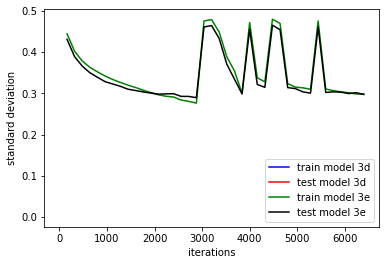

In [34]:
plt.plot(res3d[1,:],res3d[2,:],'-',color='blue',label='train model 3d')
plt.plot(res3d[1,:],res3d[3,:],'-',color='red',label='test model 3d')
plt.plot(res3e[1,:],res3e[2,:],'-',color='green',label='train model 3e')
plt.plot(res3e[1,:],res3e[3,:],'-',color='black',label='test model 3e')
plt.xlabel("iterations")
#plt.title("model 3d")
plt.ylabel("standard deviation")
plt.legend(loc="best")

NameError: name 'res3' is not defined

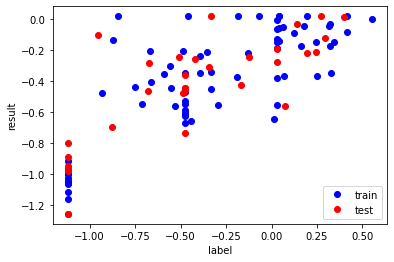

In [35]:
plt.plot(y_train,prediction3tre,'o',color='blue',label='train')
plt.plot(y_test,prediction3tee,'o',color='red',label='test')
plt.xlabel("label")
plt.ylabel("result")
plt.legend(loc="best")
print(f"Best standard deviation w/o regularization {round(min(res3[3]),3)}")
print(f"Best standard deviation w L1=0.01 {round(min(res3b[3]),3)}")
print(f"Best standard deviation w L1=0.001 {round(min(res3c[3]),3)}")
print(f"Best standard deviation w L1=0.003 {round(min(res3d[3]),3)}")
print(f"Best standard deviation w L1=0.005 {round(min(res3e[3]),3)}")
print(f"comparing train prediction for L1=0.003 and L1=0005 {np.round(np.std(prediction3tre-prediction3trd),4)}")
print(f"comparing test prediction for L1=0.003 and L1=0005 {np.round(np.std(prediction3tee-prediction3ted),4)}")

Overall result seem easier to get with bigger first layer. Predictions do not strongly depdent on regularization. 

Other ideas to try. Use scaled values in fit. Use two relu layer before result achieving linear layer. 

In [82]:
model3f= Sequential(
    [              
        tf.keras.Input(shape=(1197,)),  
        Dense(15, activation="relu",kernel_regularizer=tf.keras.regularizers.L1(0.002), name="layer1"),   
        Dense(4, activation="relu",kernel_regularizer=tf.keras.regularizers.L1(0.002), name="layer2"),  
        Dense(1, activation = 'linear',kernel_regularizer=tf.keras.regularizers.L1(0.002),name="layer3")
    ], name = "model3f"
) 
model3f.summary()

Model: "model3f"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 layer1 (Dense)              (None, 15)                17970     
                                                                 
 layer2 (Dense)              (None, 4)                 64        
                                                                 
 layer3 (Dense)              (None, 1)                 5         
                                                                 
Total params: 18,039
Trainable params: 18,039
Non-trainable params: 0
_________________________________________________________________


In [83]:
model3f.compile(
    loss=tf.keras.losses.MeanSquaredError(), 
    optimizer=tf.keras.optimizers.Adam(0.001),
)


In [87]:
res3f=np.zeros((6,40))
#tf.keras.utils.set_random_seed(1306)
for i in range(40):
    print(i)
    model3f.fit(
        xsel_train,y_train,
        epochs=160,batch_size=74
        )
    prediction3trf = model3f.predict(trainre)
    prediction3tef = model3f.predict(testre)
    res3f[0,i]=i
    res3f[1,i]=(i+1)*160
    res3f[2,i]=np.std(y_train-prediction3trf[:,0])
    res3f[3,i]=np.std(y_test-prediction3tef[:,0])
    res3f[4,i]=np.mean((y_train-prediction3trf[:,0])**2)
    res3f[5,i]=np.mean((y_test-prediction3tef[:,0])**2) 

0
Epoch 1/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1812
Epoch 2/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1811
Epoch 3/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1814
Epoch 4/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1815
Epoch 5/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1820
Epoch 6/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1825
Epoch 7/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1831
Epoch 8/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1834
Epoch 9/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1840
Epoch 10/160
1/1 [==============================] - 0s 9ms/step - loss: 0.1842
Epoch 11/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1844
Epoch 12/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1850
Epoch 13/160
1/1 [==============================] - 0s 8ms/

Epoch 46/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1785
Epoch 47/160
1/1 [==============================] - 0s 8ms/step - loss: 0.1738
Epoch 48/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1706
Epoch 49/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1689
Epoch 50/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1688
Epoch 51/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1698
Epoch 52/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1715
Epoch 53/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1729
Epoch 54/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1738
Epoch 55/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1747
Epoch 56/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1747
Epoch 57/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1743
Epoch 58/160
1/1 [==============================] - 

1/1 [==============================] - 0s 6ms/step - loss: 0.1692
Epoch 150/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1729
Epoch 151/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1769
Epoch 152/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1794
Epoch 153/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1798
Epoch 154/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1771
Epoch 155/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1733
Epoch 156/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1687
Epoch 157/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1649
Epoch 158/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1635
Epoch 159/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1640
Epoch 160/160
2/2 [==============================] - 0s 2ms/step
2
Epoch 1/160
1/1 [==============================] - 0s 6ms/step - lo

1/1 [==============================] - 0s 5ms/step - loss: 0.1668
Epoch 33/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1666
Epoch 34/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1665
Epoch 35/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1664
Epoch 36/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1662
Epoch 37/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1660
Epoch 38/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1658
Epoch 39/160
1/1 [==============================] - 0s 8ms/step - loss: 0.1657
Epoch 40/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1655
Epoch 41/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1653
Epoch 42/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1651
Epoch 43/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1650
Epoch 44/160
1/1 [==============================] - 0s 5ms/step -

1/1 [==============================] - 0s 5ms/step - loss: 0.2200
Epoch 78/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2086
Epoch 79/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2082
Epoch 80/160
1/1 [==============================] - 0s 9ms/step - loss: 0.2147
Epoch 81/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2023
Epoch 82/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2129
Epoch 83/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2044
Epoch 84/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2060
Epoch 85/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2081
Epoch 86/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2014
Epoch 87/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2077
Epoch 88/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2017
Epoch 89/160
1/1 [==============================] - 0s 7ms/step -

1/1 [==============================] - 0s 7ms/step - loss: 0.1630
Epoch 122/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1629
Epoch 123/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1627
Epoch 124/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1626
Epoch 125/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1624
Epoch 126/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1622
Epoch 127/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1620
Epoch 128/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1619
Epoch 129/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1618
Epoch 130/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1616
Epoch 131/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1615
Epoch 132/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1613
Epoch 133/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 5ms/step - loss: 0.2980
Epoch 5/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1732
Epoch 6/160
1/1 [==============================] - 0s 5ms/step - loss: 0.3042
Epoch 7/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1861
Epoch 8/160
1/1 [==============================] - 0s 5ms/step - loss: 0.3467
Epoch 9/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1590
Epoch 10/160
1/1 [==============================] - 0s 7ms/step - loss: 0.3086
Epoch 11/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1702
Epoch 12/160
1/1 [==============================] - 0s 7ms/step - loss: 0.3346
Epoch 13/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1604
Epoch 14/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2990
Epoch 15/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1664
Epoch 16/160
1/1 [==============================] - 0s 6ms/step - loss

Epoch 49/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1437
Epoch 50/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1437
Epoch 51/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1436
Epoch 52/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1436
Epoch 53/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1435
Epoch 54/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1435
Epoch 55/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1434
Epoch 56/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1433
Epoch 57/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1433
Epoch 58/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1433
Epoch 59/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1433
Epoch 60/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1432
Epoch 61/160
1/1 [==============================] - 

1/1 [==============================] - 0s 6ms/step - loss: 0.1397
Epoch 153/160
1/1 [==============================] - 0s 9ms/step - loss: 0.1397
Epoch 154/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1397
Epoch 155/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1396
Epoch 156/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1396
Epoch 157/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1396
Epoch 158/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1395
Epoch 159/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1395
Epoch 160/160
2/2 [==============================] - 0s 3ms/step
9
Epoch 1/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1394
Epoch 2/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1394
Epoch 3/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1394
Epoch 4/160
1/1 [==============================] - 0s 5ms/step - loss: 0.

1/1 [==============================] - 0s 7ms/step - loss: 0.1376
Epoch 36/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1375
Epoch 37/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1374
Epoch 38/160
1/1 [==============================] - 0s 8ms/step - loss: 0.1373
Epoch 39/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1372
Epoch 40/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1370
Epoch 41/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1369
Epoch 42/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1368
Epoch 43/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1367
Epoch 44/160
1/1 [==============================] - 0s 8ms/step - loss: 0.1366
Epoch 45/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1365
Epoch 46/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1364
Epoch 47/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 4ms/step - loss: 0.1330
Epoch 81/160
1/1 [==============================] - 0s 12ms/step - loss: 0.1320
Epoch 82/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1312
Epoch 83/160
1/1 [==============================] - 0s 8ms/step - loss: 0.1304
Epoch 84/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1298
Epoch 85/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1293
Epoch 86/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1290
Epoch 87/160
1/1 [==============================] - 0s 8ms/step - loss: 0.1287
Epoch 88/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1287
Epoch 89/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1287
Epoch 90/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1287
Epoch 91/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1289
Epoch 92/160
1/1 [==============================] - 0s 4ms/step 

1/1 [==============================] - 0s 5ms/step - loss: 0.1259
Epoch 125/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1255
Epoch 126/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1251
Epoch 127/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1249
Epoch 128/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1247
Epoch 129/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1246
Epoch 130/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1246
Epoch 131/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1246
Epoch 132/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1246
Epoch 133/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1246
Epoch 134/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1247
Epoch 135/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1248
Epoch 136/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 6ms/step - loss: 0.1270
Epoch 8/160
1/1 [==============================] - 0s 8ms/step - loss: 0.1284
Epoch 9/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1272
Epoch 10/160
1/1 [==============================] - 0s 10ms/step - loss: 0.1273
Epoch 11/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1274
Epoch 12/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1266
Epoch 13/160
1/1 [==============================] - 0s 8ms/step - loss: 0.1273
Epoch 14/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1261
Epoch 15/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 16/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1259
Epoch 17/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1263
Epoch 18/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1259
Epoch 19/160
1/1 [==============================] - 0s 6ms/step - 

1/1 [==============================] - 0s 6ms/step - loss: 0.1241
Epoch 53/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1239
Epoch 54/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1238
Epoch 55/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1237
Epoch 56/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1236
Epoch 57/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1234
Epoch 58/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1233
Epoch 59/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1232
Epoch 60/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1231
Epoch 61/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1230
Epoch 62/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1229
Epoch 63/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1227
Epoch 64/160
1/1 [==============================] - 0s 7ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.1163
Epoch 156/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1163
Epoch 157/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1179
Epoch 158/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1188
Epoch 159/160
1/1 [==============================] - 0s 8ms/step - loss: 0.1168
Epoch 160/160
2/2 [==============================] - 0s 2ms/step
16
Epoch 1/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1341
Epoch 2/160
1/1 [==============================] - 0s 8ms/step - loss: 0.2079
Epoch 3/160
1/1 [==============================] - 0s 7ms/step - loss: 0.3085
Epoch 4/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2443
Epoch 5/160
1/1 [==============================] - 0s 8ms/step - loss: 0.1369
Epoch 6/160
1/1 [==============================] - 0s 6ms/step - loss: 0.3205
Epoch 7/160
1/1 [==============================] - 0s 5ms/step - loss: 0.2401


1/1 [==============================] - 0s 7ms/step - loss: 0.1163
Epoch 39/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1162
Epoch 40/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1161
Epoch 41/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1161
Epoch 42/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1160
Epoch 43/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1159
Epoch 44/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1159
Epoch 45/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1159
Epoch 46/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1159
Epoch 47/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1159
Epoch 48/160
1/1 [==============================] - 0s 8ms/step - loss: 0.1159
Epoch 49/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1159
Epoch 50/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.1636
Epoch 84/160
1/1 [==============================] - 0s 8ms/step - loss: 0.1276
Epoch 85/160
1/1 [==============================] - 0s 6ms/step - loss: 0.2309
Epoch 86/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2213
Epoch 87/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1492
Epoch 88/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1268
Epoch 89/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1866
Epoch 90/160
1/1 [==============================] - 0s 7ms/step - loss: 0.2124
Epoch 91/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1358
Epoch 92/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1393
Epoch 93/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1941
Epoch 94/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1582
Epoch 95/160
1/1 [==============================] - 0s 5ms/step -

1/1 [==============================] - 0s 7ms/step - loss: 0.1169
Epoch 128/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1149
Epoch 129/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1151
Epoch 130/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1152
Epoch 131/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1141
Epoch 132/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1148
Epoch 133/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1141
Epoch 134/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1140
Epoch 135/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1145
Epoch 136/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1139
Epoch 137/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1140
Epoch 138/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1143
Epoch 139/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 6ms/step - loss: 0.1096
Epoch 11/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1096
Epoch 12/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1096
Epoch 13/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1095
Epoch 14/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1094
Epoch 15/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1095
Epoch 16/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1094
Epoch 17/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1093
Epoch 18/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1095
Epoch 19/160
1/1 [==============================] - 0s 8ms/step - loss: 0.1096
Epoch 20/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1097
Epoch 21/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1098
Epoch 22/160
1/1 [==============================] - 0s 8ms/step -

1/1 [==============================] - 0s 7ms/step - loss: 0.1070
Epoch 56/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1073
Epoch 57/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1075
Epoch 58/160
1/1 [==============================] - 0s 8ms/step - loss: 0.1079
Epoch 59/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1082
Epoch 60/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1088
Epoch 61/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1100
Epoch 62/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1126
Epoch 63/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1169
Epoch 64/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1258
Epoch 65/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1365
Epoch 66/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1558
Epoch 67/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.1062
Epoch 159/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1060
Epoch 160/160
2/2 [==============================] - 0s 3ms/step
23
Epoch 1/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1058
Epoch 2/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1059
Epoch 3/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1060
Epoch 4/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1061
Epoch 5/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1063
Epoch 6/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1063
Epoch 7/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1063
Epoch 8/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1064
Epoch 9/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1064
Epoch 10/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1064
Epoch

1/1 [==============================] - 0s 6ms/step - loss: 0.1039
Epoch 42/160
1/1 [==============================] - 0s 8ms/step - loss: 0.1043
Epoch 43/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1050
Epoch 44/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1063
Epoch 45/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1082
Epoch 46/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1112
Epoch 47/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1141
Epoch 48/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1177
Epoch 49/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1169
Epoch 50/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1133
Epoch 51/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1065
Epoch 52/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1055
Epoch 53/160
1/1 [==============================] - 0s 8ms/step -

1/1 [==============================] - 0s 5ms/step - loss: 0.1107
Epoch 87/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1117
Epoch 88/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1109
Epoch 89/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1108
Epoch 90/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1090
Epoch 91/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1076
Epoch 92/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1055
Epoch 93/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1037
Epoch 94/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1023
Epoch 95/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1019
Epoch 96/160
1/1 [==============================] - 0s 8ms/step - loss: 0.1022
Epoch 97/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1031
Epoch 98/160
1/1 [==============================] - 0s 7ms/step -

1/1 [==============================] - 0s 7ms/step - loss: 0.1238
Epoch 131/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1302
Epoch 132/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1411
Epoch 133/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1358
Epoch 134/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1342
Epoch 135/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1207
Epoch 136/160
1/1 [==============================] - 0s 8ms/step - loss: 0.1123
Epoch 137/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1047
Epoch 138/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1011
Epoch 139/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1004
Epoch 140/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1017
Epoch 141/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1037
Epoch 142/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 7ms/step - loss: 0.1106
Epoch 14/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1087
Epoch 15/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1042
Epoch 16/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1010
Epoch 17/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0991
Epoch 18/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0989
Epoch 19/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0998
Epoch 20/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1016
Epoch 21/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1045
Epoch 22/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1072
Epoch 23/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1116
Epoch 24/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1136
Epoch 25/160
1/1 [==============================] - 0s 7ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.1128
Epoch 59/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1128
Epoch 60/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1085
Epoch 61/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1051
Epoch 62/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1006
Epoch 63/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0981
Epoch 64/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0976
Epoch 65/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0991
Epoch 66/160
1/1 [==============================] - 0s 8ms/step - loss: 0.1018
Epoch 67/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1047
Epoch 68/160
1/1 [==============================] - 0s 8ms/step - loss: 0.1088
Epoch 69/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1106
Epoch 70/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 8ms/step - loss: 0.1098
Epoch 104/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1133
Epoch 105/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1197
Epoch 106/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1191
Epoch 107/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1206
Epoch 108/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1133
Epoch 109/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1090
Epoch 110/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1037
Epoch 111/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1010
Epoch 112/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0989
Epoch 113/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0978
Epoch 114/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0972
Epoch 115/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 7ms/step - loss: 0.1122
Epoch 148/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1134
Epoch 149/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1151
Epoch 150/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1102
Epoch 151/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1075
Epoch 152/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1028
Epoch 153/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0999
Epoch 154/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0975
Epoch 155/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0961
Epoch 156/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0954
Epoch 157/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0954
Epoch 158/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0960
Epoch 159/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 5ms/step - loss: 0.0945
Epoch 31/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0954
Epoch 32/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0970
Epoch 33/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0998
Epoch 34/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1027
Epoch 35/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1078
Epoch 36/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1102
Epoch 37/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1143
Epoch 38/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1120
Epoch 39/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1114
Epoch 40/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1063
Epoch 41/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1035
Epoch 42/160
1/1 [==============================] - 0s 5ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.0933
Epoch 76/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0934
Epoch 77/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0936
Epoch 78/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0940
Epoch 79/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0945
Epoch 80/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0953
Epoch 81/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0968
Epoch 82/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0983
Epoch 83/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1011
Epoch 84/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1036
Epoch 85/160
1/1 [==============================] - 0s 8ms/step - loss: 0.1088
Epoch 86/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1114
Epoch 87/160
1/1 [==============================] - 0s 7ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.1033
Epoch 120/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0974
Epoch 121/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0943
Epoch 122/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0928
Epoch 123/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0924
Epoch 124/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0929
Epoch 125/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0938
Epoch 126/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0956
Epoch 127/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0976
Epoch 128/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1008
Epoch 129/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1030
Epoch 130/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1072
Epoch 131/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 5ms/step - loss: 0.0994
Epoch 62/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1031
Epoch 63/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1048
Epoch 64/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1088
Epoch 65/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1086
Epoch 66/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1107
Epoch 67/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1076
Epoch 68/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1067
Epoch 69/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1025
Epoch 70/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1003
Epoch 71/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0973
Epoch 72/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0955
Epoch 73/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.0979
Epoch 106/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0949
Epoch 107/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0927
Epoch 108/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0916
Epoch 109/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0911
Epoch 110/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0910
Epoch 111/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0914
Epoch 112/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0920
Epoch 113/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0929
Epoch 114/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0938
Epoch 115/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0954
Epoch 116/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0969
Epoch 117/160
1/1 [==============================] - 0

Epoch 47/160
1/1 [==============================] - 0s 8ms/step - loss: 0.0908
Epoch 48/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0909
Epoch 49/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0910
Epoch 50/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0913
Epoch 51/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0916
Epoch 52/160
1/1 [==============================] - 0s 7ms/step - loss: 0.0924
Epoch 53/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0933
Epoch 54/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0952
Epoch 55/160
1/1 [==============================] - 0s 6ms/step - loss: 0.0972
Epoch 56/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1014
Epoch 57/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1049
Epoch 58/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1126
Epoch 59/160
1/1 [==============================] - 

1/1 [==============================] - 0s 5ms/step - loss: 0.0947
Epoch 151/160
1/1 [==============================] - 0s 5ms/step - loss: 0.0965
Epoch 152/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1001
Epoch 153/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1028
Epoch 154/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1091
Epoch 155/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1117
Epoch 156/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1189
Epoch 157/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1173
Epoch 158/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1205
Epoch 159/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1135
Epoch 160/160
2/2 [==============================] - 0s 2ms/step
39
Epoch 1/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1032
Epoch 2/160
1/1 [==============================] - 0s 5ms/step - los

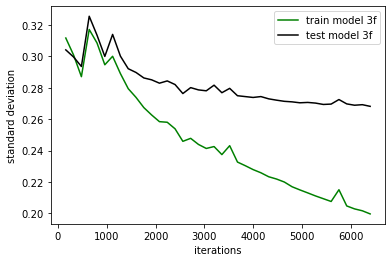

In [89]:
plt.plot(res3f[1,:],res3f[2,:],'-',color='green',label='train model 3f')
plt.plot(res3f[1,:],res3f[3,:],'-',color='black',label='test model 3f')
plt.xlabel("iterations")
#plt.title("model 3d")
plt.ylabel("standard deviation")
plt.legend(loc="best")

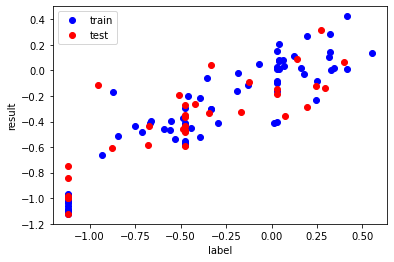

In [90]:
plt.plot(y_train,prediction3trf,'o',color='blue',label='train')
plt.plot(y_test,prediction3tef,'o',color='red',label='test')
plt.xlabel("label")
plt.ylabel("result")
plt.legend(loc="best")

In [107]:
s=np.argsort(y_train-prediction3trf[:,0])
ste=np.argsort(y_test-prediction3tef[:,0])
ditr=y_train-prediction3trf[:,0]
dite=y_test-prediction3tef[:,0]
print(ditr[s[0]])
print(ditr[s[1]])
print(ditr[s[2]])
print(ditr[s[72]])
print(ditr[s[73]])
print(dite[ste[0]])
print(dite[ste[1]])
print(dite[ste[2]])
print(dite[ste[31]])
print(dite[ste[32]])
print(tar2_train[s[0]])
print(tar2_test[ste[0]])
#s[0] and ste[0] are clearest outliers

-0.7072911150312424
-0.3323804320907593
-0.31503189525604247
0.43036851167678836
0.47404931562900543
-0.8412685570669174
-0.37409263372421275
-0.37186354812145234
0.4346891276216507
0.4772760349845886
[ 3.00000000e+00 -8.73110000e-01  1.38219038e+02  3.71550700e+03
  1.00000000e+00  7.47634400e-01  2.71745000e-01  2.65892190e+02
 -2.87338900e+01]
[ 2.00000000e+00 -9.55120000e-01  1.17961701e+02  4.03433100e+03
  1.00000000e+00  9.21180600e-01  3.35245000e-01  2.70843615e+02
 -2.99798956e+01]


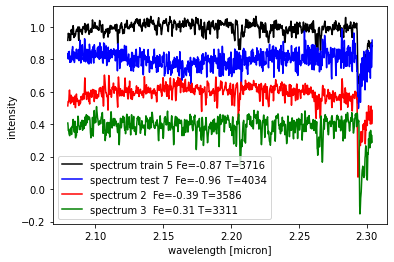

In [113]:
plt.plot(ressel[3],xsel_train[s[0],:],'-',color='black',label=f'spectrum train {s[0]} Fe={round(y_train[s[0]],2)} T={round(tar2_train[s[0],3])}')
plt.plot(ressel[3],xsel_test[ste[1]]-0.2,'-',color='blue',label=f'spectrum test {ste[0]}  Fe={round(y_test[ste[0]],2)}  T={round(tar2_test[ste[0],3])}')
plt.plot(ressel[3],xsel[:,2]-0.4,'-',color='red',label=f'spectrum 2  Fe={round(tar2[1,2],2)} T={round(tar2[3,2])}')
plt.plot(ressel[3],xsel[:,3]-0.6,'-',color='green',label=f'spectrum 3  Fe={round(tar2[1,3],2)} T={round(tar2[3,3])}')
plt.xlabel("wavelength [micron]")
plt.ylabel("intensity")
plt.legend(loc="best")
#seems s[0] has not the claimed metallicity stronger is apogee 
#other migh be too weak both are apogee
#maybe use indices to check 
#both others also dont look ideal

(74, 1197)
(33, 1197)
133.0


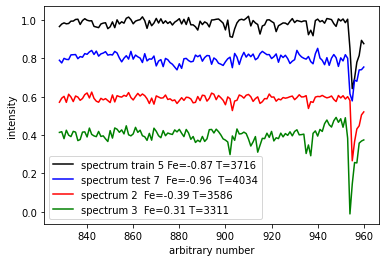

In [155]:
plt.plot(ressel[0,0:133],xseln9_train[s[0],:],'-',color='black',label=f'spectrum train {s[0]} Fe={round(y_train[s[0]],2)} T={round(tar2_train[s[0],3])}')
plt.plot(ressel[0,0:133],xseln9_test[ste[1]]-0.2,'-',color='blue',label=f'spectrum test {ste[0]}  Fe={round(y_test[ste[0]],2)}  T={round(tar2_test[ste[0],3])}')
plt.plot(ressel[0,0:133],xseln9_train[2]-0.4,'-',color='red',label=f'spectrum 2  Fe={round(tar2[1,2],2)} T={round(tar2[3,2])}')
plt.plot(ressel[0,0:133],xseln9_train[3]-0.6,'-',color='green',label=f'spectrum 3  Fe={round(tar2[1,3],2)} T={round(tar2[3,3])}')
plt.xlabel("arbitrary number")
plt.ylabel("intensity")
plt.legend(loc="best")

In [162]:
model3g= Sequential(
    [              
        tf.keras.Input(shape=(133,)),  
        Dense(25, activation="relu",kernel_regularizer=tf.keras.regularizers.L1(0.005), name="layer1"),   
        Dense(5, activation="relu",kernel_regularizer=tf.keras.regularizers.L1(0.005), name="layer2"),  
        Dense(1, activation = 'linear',kernel_regularizer=tf.keras.regularizers.L1(0.005),name="layer3")
    ], name = "model3g"
) 
model3g.summary()

Model: "model3g"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 layer1 (Dense)              (None, 25)                3350      
                                                                 
 layer2 (Dense)              (None, 5)                 130       
                                                                 
 layer3 (Dense)              (None, 1)                 6         
                                                                 
Total params: 3,486
Trainable params: 3,486
Non-trainable params: 0
_________________________________________________________________


In [163]:
model3g.compile(
    loss=tf.keras.losses.MeanSquaredError(), 
    optimizer=tf.keras.optimizers.Adam(0.001),
)
trainren9=xseln9_train[0:133].reshape(74,133) 
testren9=xseln9_test[0:133].reshape(33,133) 

In [171]:
res3g=np.zeros((6,80))
#tf.keras.utils.set_random_seed(1306)
for i in range(80):
    print(i)
    model3g.fit(
        xseln9_train,y_train,
        epochs=160,batch_size=74
        )
    prediction3trg = model3g.predict(trainren9)
    prediction3teg = model3g.predict(testren9)
    res3g[0,i]=i
    res3g[1,i]=(i+1)*160
    res3g[2,i]=np.std(y_train-prediction3trg[:,0])
    res3g[3,i]=np.std(y_test-prediction3teg[:,0])
    res3g[4,i]=np.mean((y_train-prediction3trg[:,0])**2)
    res3g[5,i]=np.mean((y_test-prediction3teg[:,0])**2) 

0
Epoch 1/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1023
Epoch 2/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1024
Epoch 3/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1023
Epoch 4/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1024
Epoch 5/160
1/1 [==============================] - 0s 8ms/step - loss: 0.1023
Epoch 6/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1024
Epoch 7/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1022
Epoch 8/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1023
Epoch 9/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1022
Epoch 10/160
1/1 [==============================] - 0s 8ms/step - loss: 0.1023
Epoch 11/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1022
Epoch 12/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1025
Epoch 13/160
1/1 [==============================] - 0s 6ms/

Epoch 46/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1035
Epoch 47/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1046
Epoch 48/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1081
Epoch 49/160
1/1 [==============================] - 0s 9ms/step - loss: 0.1074
Epoch 50/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1144
Epoch 51/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1113
Epoch 52/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1113
Epoch 53/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1057
Epoch 54/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1033
Epoch 55/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1021
Epoch 56/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1034
Epoch 57/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1081
Epoch 58/160
1/1 [==============================] - 

1/1 [==============================] - 0s 5ms/step - loss: 0.1030
Epoch 150/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1043
Epoch 151/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1047
Epoch 152/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1067
Epoch 153/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1052
Epoch 154/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1050
Epoch 155/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1033
Epoch 156/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1026
Epoch 157/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1020
Epoch 158/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1029
Epoch 159/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1043
Epoch 160/160
2/2 [==============================] - 0s 4ms/step
2
Epoch 1/160
1/1 [==============================] - 0s 5ms/step - lo

1/1 [==============================] - 0s 7ms/step - loss: 0.1049
Epoch 33/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1032
Epoch 34/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1026
Epoch 35/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1020
Epoch 36/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1029
Epoch 37/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1042
Epoch 38/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1046
Epoch 39/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1066
Epoch 40/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1051
Epoch 41/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1049
Epoch 42/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1033
Epoch 43/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1026
Epoch 44/160
1/1 [==============================] - 0s 5ms/step -

1/1 [==============================] - 0s 4ms/step - loss: 0.1065
Epoch 78/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1050
Epoch 79/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1049
Epoch 80/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1032
Epoch 81/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1026
Epoch 82/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1020
Epoch 83/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1029
Epoch 84/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1042
Epoch 85/160
1/1 [==============================] - 0s 8ms/step - loss: 0.1046
Epoch 86/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1065
Epoch 87/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1050
Epoch 88/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1049
Epoch 89/160
1/1 [==============================] - 0s 5ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.1029
Epoch 122/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1042
Epoch 123/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1045
Epoch 124/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1065
Epoch 125/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1050
Epoch 126/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1049
Epoch 127/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1032
Epoch 128/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1025
Epoch 129/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1020
Epoch 130/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1029
Epoch 131/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1042
Epoch 132/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1045
Epoch 133/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 5ms/step - loss: 0.1049
Epoch 5/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1032
Epoch 6/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1025
Epoch 7/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1019
Epoch 8/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1028
Epoch 9/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1042
Epoch 10/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1045
Epoch 11/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1064
Epoch 12/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1049
Epoch 13/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1048
Epoch 14/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1031
Epoch 15/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1026
Epoch 16/160
1/1 [==============================] - 0s 6ms/step - loss

Epoch 49/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1038
Epoch 50/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1048
Epoch 51/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1076
Epoch 52/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1057
Epoch 53/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1051
Epoch 54/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1029
Epoch 55/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1020
Epoch 56/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1024
Epoch 57/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1026
Epoch 58/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1025
Epoch 59/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1020
Epoch 60/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1024
Epoch 61/160
1/1 [==============================] - 

1/1 [==============================] - 0s 7ms/step - loss: 0.1020
Epoch 153/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1029
Epoch 154/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1039
Epoch 155/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1042
Epoch 156/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1063
Epoch 157/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1054
Epoch 158/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1057
Epoch 159/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1037
Epoch 160/160
2/2 [==============================] - 0s 5ms/step
9
Epoch 1/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1032
Epoch 2/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1032
Epoch 3/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1024
Epoch 4/160
1/1 [==============================] - 0s 4ms/step - loss: 0.

1/1 [==============================] - 0s 5ms/step - loss: 0.1019
Epoch 36/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1019
Epoch 37/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1018
Epoch 38/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1019
Epoch 39/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1019
Epoch 40/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1019
Epoch 41/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1019
Epoch 42/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1018
Epoch 43/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1018
Epoch 44/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1018
Epoch 45/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1018
Epoch 46/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1018
Epoch 47/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 4ms/step - loss: 0.1130
Epoch 81/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1086
Epoch 82/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1112
Epoch 83/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1072
Epoch 84/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1105
Epoch 85/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1074
Epoch 86/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1113
Epoch 87/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1079
Epoch 88/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1111
Epoch 89/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1071
Epoch 90/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1077
Epoch 91/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1039
Epoch 92/160
1/1 [==============================] - 0s 5ms/step -

1/1 [==============================] - 0s 5ms/step - loss: 0.1038
Epoch 125/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1037
Epoch 126/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1030
Epoch 127/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1021
Epoch 128/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1020
Epoch 129/160
1/1 [==============================] - 0s 9ms/step - loss: 0.1028
Epoch 130/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1034
Epoch 131/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1038
Epoch 132/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1064
Epoch 133/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1058
Epoch 134/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1064
Epoch 135/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1040
Epoch 136/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 7ms/step - loss: 0.1018
Epoch 8/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1018
Epoch 9/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1018
Epoch 10/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1018
Epoch 11/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1018
Epoch 12/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1018
Epoch 13/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1018
Epoch 14/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1018
Epoch 15/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1018
Epoch 16/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1018
Epoch 17/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1018
Epoch 18/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1019
Epoch 19/160
1/1 [==============================] - 0s 5ms/step - l

Epoch 52/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1021
Epoch 53/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1022
Epoch 54/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1020
Epoch 55/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1021
Epoch 56/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1019
Epoch 57/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1021
Epoch 58/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1020
Epoch 59/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1022
Epoch 60/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1022
Epoch 61/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1024
Epoch 62/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1022
Epoch 63/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1023
Epoch 64/160
1/1 [==============================] - 

Epoch 155/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1020
Epoch 156/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1018
Epoch 157/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1021
Epoch 158/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1020
Epoch 159/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1019
Epoch 160/160
2/2 [==============================] - 0s 2ms/step
16
Epoch 1/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1019
Epoch 2/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1020
Epoch 3/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1018
Epoch 4/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1019
Epoch 5/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1021
Epoch 6/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1019
Epoch 7/160
1/1 [==============================] - 0s 4ms/step -

1/1 [==============================] - 0s 5ms/step - loss: 0.1020
Epoch 39/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1022
Epoch 40/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1021
Epoch 41/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1022
Epoch 42/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1020
Epoch 43/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1021
Epoch 44/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1019
Epoch 45/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1021
Epoch 46/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1021
Epoch 47/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1023
Epoch 48/160
1/1 [==============================] - 0s 8ms/step - loss: 0.1022
Epoch 49/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1024
Epoch 50/160
1/1 [==============================] - 0s 7ms/step -

1/1 [==============================] - 0s 4ms/step - loss: 0.1045
Epoch 84/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1035
Epoch 85/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1029
Epoch 86/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1022
Epoch 87/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1019
Epoch 88/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1018
Epoch 89/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1021
Epoch 90/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1030
Epoch 91/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1035
Epoch 92/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1066
Epoch 93/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1058
Epoch 94/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1059
Epoch 95/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.1016
Epoch 128/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1017
Epoch 129/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1017
Epoch 130/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1017
Epoch 131/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1016
Epoch 132/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1016
Epoch 133/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1016
Epoch 134/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1016
Epoch 135/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1017
Epoch 136/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1017
Epoch 137/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1017
Epoch 138/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1016
Epoch 139/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 5ms/step - loss: 0.1172
Epoch 11/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1116
Epoch 12/160
1/1 [==============================] - 0s 3ms/step - loss: 0.1115
Epoch 13/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1064
Epoch 14/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1101
Epoch 15/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1091
Epoch 16/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1129
Epoch 17/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1093
Epoch 18/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1106
Epoch 19/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1064
Epoch 20/160
1/1 [==============================] - 0s 3ms/step - loss: 0.1081
Epoch 21/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1061
Epoch 22/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 5ms/step - loss: 0.1059
Epoch 56/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1052
Epoch 57/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1058
Epoch 58/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1035
Epoch 59/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1037
Epoch 60/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1028
Epoch 61/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1019
Epoch 62/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1018
Epoch 63/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1025
Epoch 64/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1033
Epoch 65/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1034
Epoch 66/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1058
Epoch 67/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 4ms/step - loss: 0.1016
Epoch 159/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1016
Epoch 160/160
2/2 [==============================] - 0s 2ms/step
23
Epoch 1/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1016
Epoch 2/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1016
Epoch 3/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1016
Epoch 4/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1017
Epoch 5/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1016
Epoch 6/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1016
Epoch 7/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1016
Epoch 8/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1016
Epoch 9/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1016
Epoch 10/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1017
Epoch

1/1 [==============================] - 0s 6ms/step - loss: 0.1019
Epoch 42/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1021
Epoch 43/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1020
Epoch 44/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1022
Epoch 45/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1020
Epoch 46/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1021
Epoch 47/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1019
Epoch 48/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1020
Epoch 49/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1019
Epoch 50/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1020
Epoch 51/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1019
Epoch 52/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1019
Epoch 53/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.1058
Epoch 87/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1050
Epoch 88/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1058
Epoch 89/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1035
Epoch 90/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1036
Epoch 91/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1027
Epoch 92/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1018
Epoch 93/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1017
Epoch 94/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1025
Epoch 95/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1032
Epoch 96/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1032
Epoch 97/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1036
Epoch 98/160
1/1 [==============================] - 0s 5ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.1018
Epoch 131/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1018
Epoch 132/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1017
Epoch 133/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1019
Epoch 134/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1018
Epoch 135/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1019
Epoch 136/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1017
Epoch 137/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1018
Epoch 138/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1018
Epoch 139/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1019
Epoch 140/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1018
Epoch 141/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1018
Epoch 142/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 5ms/step - loss: 0.1014
Epoch 14/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1015
Epoch 15/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1015
Epoch 16/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1015
Epoch 17/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1015
Epoch 18/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1015
Epoch 19/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1015
Epoch 20/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1015
Epoch 21/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1015
Epoch 22/160
1/1 [==============================] - 0s 8ms/step - loss: 0.1015
Epoch 23/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1015
Epoch 24/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1015
Epoch 25/160
1/1 [==============================] - 0s 5ms/step -

1/1 [==============================] - 0s 5ms/step - loss: 0.1093
Epoch 59/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1085
Epoch 60/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1155
Epoch 61/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1158
Epoch 62/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1224
Epoch 63/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1119
Epoch 64/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1100
Epoch 65/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1058
Epoch 66/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1088
Epoch 67/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1094
Epoch 68/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1165
Epoch 69/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1149
Epoch 70/160
1/1 [==============================] - 0s 7ms/step -

1/1 [==============================] - 0s 7ms/step - loss: 0.1017
Epoch 104/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1029
Epoch 105/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1045
Epoch 106/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1086
Epoch 107/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1086
Epoch 108/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1125
Epoch 109/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 110/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1103
Epoch 111/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1064
Epoch 112/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1073
Epoch 113/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1048
Epoch 114/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1042
Epoch 115/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 6ms/step - loss: 0.1017
Epoch 148/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1019
Epoch 149/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1016
Epoch 150/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1015
Epoch 151/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1017
Epoch 152/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1017
Epoch 153/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1020
Epoch 154/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1016
Epoch 155/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1016
Epoch 156/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1014
Epoch 157/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1014
Epoch 158/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1015
Epoch 159/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 6ms/step - loss: 0.1019
Epoch 31/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1018
Epoch 32/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1019
Epoch 33/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1017
Epoch 34/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1018
Epoch 35/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1016
Epoch 36/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1018
Epoch 37/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1018
Epoch 38/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1020
Epoch 39/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1026
Epoch 40/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1084
Epoch 41/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1183
Epoch 42/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 4ms/step - loss: 0.1057
Epoch 76/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1115
Epoch 77/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1092
Epoch 78/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1102
Epoch 79/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1049
Epoch 80/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1028
Epoch 81/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1016
Epoch 82/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1017
Epoch 83/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1037
Epoch 84/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1054
Epoch 85/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1084
Epoch 86/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1062
Epoch 87/160
1/1 [==============================] - 0s 5ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.1038
Epoch 120/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1050
Epoch 121/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1039
Epoch 122/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1047
Epoch 123/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1034
Epoch 124/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1044
Epoch 125/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1034
Epoch 126/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1045
Epoch 127/160
1/1 [==============================] - 0s 9ms/step - loss: 0.1037
Epoch 128/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1048
Epoch 129/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1037
Epoch 130/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1046
Epoch 131/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 6ms/step - loss: 0.1014
Epoch 62/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1014
Epoch 63/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1014
Epoch 64/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1013
Epoch 65/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1013
Epoch 66/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1014
Epoch 67/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1013
Epoch 68/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1014
Epoch 69/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1015
Epoch 70/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1014
Epoch 71/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1014
Epoch 72/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1014
Epoch 73/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.1014
Epoch 106/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1014
Epoch 107/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1014
Epoch 108/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1013
Epoch 109/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1013
Epoch 110/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1013
Epoch 111/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1013
Epoch 112/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1013
Epoch 113/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1014
Epoch 114/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1013
Epoch 115/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1013
Epoch 116/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1013
Epoch 117/160
1/1 [==============================] - 0

Epoch 47/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1015
Epoch 48/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1017
Epoch 49/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1017
Epoch 50/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1016
Epoch 51/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1014
Epoch 52/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1015
Epoch 53/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1015
Epoch 54/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1017
Epoch 55/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1017
Epoch 56/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1017
Epoch 57/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1015
Epoch 58/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1015
Epoch 59/160
1/1 [==============================] - 

1/1 [==============================] - 0s 6ms/step - loss: 0.1023
Epoch 151/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1038
Epoch 152/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1085
Epoch 153/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1092
Epoch 154/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1139
Epoch 155/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1082
Epoch 156/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1073
Epoch 157/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1036
Epoch 158/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1029
Epoch 159/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1020
Epoch 160/160
2/2 [==============================] - 0s 3ms/step
39
Epoch 1/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1014
Epoch 2/160
1/1 [==============================] - 0s 5ms/step - los

1/1 [==============================] - 0s 6ms/step - loss: 0.1013
Epoch 34/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1017
Epoch 35/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1018
Epoch 36/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1017
Epoch 37/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1014
Epoch 38/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1014
Epoch 39/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1013
Epoch 40/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1013
Epoch 41/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1013
Epoch 42/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1014
Epoch 43/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1019
Epoch 44/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1027
Epoch 45/160
1/1 [==============================] - 0s 7ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.1038
Epoch 79/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1048
Epoch 80/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1035
Epoch 81/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1043
Epoch 82/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1034
Epoch 83/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1046
Epoch 84/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1036
Epoch 85/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1047
Epoch 86/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1034
Epoch 87/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1043
Epoch 88/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1032
Epoch 89/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1043
Epoch 90/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.1015
Epoch 123/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1028
Epoch 124/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1041
Epoch 125/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1075
Epoch 126/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1066
Epoch 127/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1125
Epoch 128/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1081
Epoch 129/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1098
Epoch 130/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1048
Epoch 131/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1027
Epoch 132/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1014
Epoch 133/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1016
Epoch 134/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 5ms/step - loss: 0.1053
Epoch 6/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1045
Epoch 7/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1050
Epoch 8/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1028
Epoch 9/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1017
Epoch 10/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1013
Epoch 11/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1018
Epoch 12/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1032
Epoch 13/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1041
Epoch 14/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1067
Epoch 15/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1055
Epoch 16/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1088
Epoch 17/160
1/1 [==============================] - 0s 6ms/step - los

Epoch 50/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1016
Epoch 51/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1016
Epoch 52/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1016
Epoch 53/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1013
Epoch 54/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1014
Epoch 55/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1014
Epoch 56/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1017
Epoch 57/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1017
Epoch 58/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1016
Epoch 59/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1014
Epoch 60/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1014
Epoch 61/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1014
Epoch 62/160
1/1 [==============================] - 

1/1 [==============================] - 0s 5ms/step - loss: 0.1056
Epoch 154/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1079
Epoch 155/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1052
Epoch 156/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1041
Epoch 157/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1019
Epoch 158/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1012
Epoch 159/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1020
Epoch 160/160
2/2 [==============================] - 0s 3ms/step
46
Epoch 1/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1042
Epoch 2/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1034
Epoch 3/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1046
Epoch 4/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1033
Epoch 5/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1

1/1 [==============================] - 0s 5ms/step - loss: 0.1011
Epoch 37/160
1/1 [==============================] - 0s 3ms/step - loss: 0.1012
Epoch 38/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1012
Epoch 39/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1011
Epoch 40/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1012
Epoch 41/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1012
Epoch 42/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1011
Epoch 43/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1012
Epoch 44/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1012
Epoch 45/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1011
Epoch 46/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1011
Epoch 47/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1011
Epoch 48/160
1/1 [==============================] - 0s 4ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.1041
Epoch 82/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1024
Epoch 83/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1013
Epoch 84/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1012
Epoch 85/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1013
Epoch 86/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1013
Epoch 87/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1017
Epoch 88/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1019
Epoch 89/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1017
Epoch 90/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1014
Epoch 91/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1013
Epoch 92/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1012
Epoch 93/160
1/1 [==============================] - 0s 4ms/step -

1/1 [==============================] - 0s 4ms/step - loss: 0.1015
Epoch 126/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1016
Epoch 127/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1015
Epoch 128/160
1/1 [==============================] - 0s 3ms/step - loss: 0.1012
Epoch 129/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1013
Epoch 130/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1012
Epoch 131/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1014
Epoch 132/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1014
Epoch 133/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1016
Epoch 134/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1021
Epoch 135/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1033
Epoch 136/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1044
Epoch 137/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 5ms/step - loss: 0.1024
Epoch 9/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1018
Epoch 10/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1012
Epoch 11/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1012
Epoch 12/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1016
Epoch 13/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1023
Epoch 14/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1032
Epoch 15/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1065
Epoch 16/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1069
Epoch 17/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1143
Epoch 18/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1107
Epoch 19/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1097
Epoch 20/160
1/1 [==============================] - 0s 5ms/step - 

1/1 [==============================] - 0s 5ms/step - loss: 0.1059
Epoch 54/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1177
Epoch 55/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1174
Epoch 56/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1178
Epoch 57/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1064
Epoch 58/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1051
Epoch 59/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1024
Epoch 60/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1013
Epoch 61/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1011
Epoch 62/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1019
Epoch 63/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1044
Epoch 64/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1057
Epoch 65/160
1/1 [==============================] - 0s 7ms/step -

1/1 [==============================] - 0s 5ms/step - loss: 0.1015
Epoch 157/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1013
Epoch 158/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1015
Epoch 159/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1013
Epoch 160/160
2/2 [==============================] - 0s 3ms/step
53
Epoch 1/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1012
Epoch 2/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1013
Epoch 3/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1012
Epoch 4/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1015
Epoch 5/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1020
Epoch 6/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1035
Epoch 7/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1049
Epoch 8/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1144
Ep

1/1 [==============================] - 0s 7ms/step - loss: 0.1012
Epoch 40/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1017
Epoch 41/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1034
Epoch 42/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1081
Epoch 43/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1074
Epoch 44/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1123
Epoch 45/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1065
Epoch 46/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1070
Epoch 47/160
1/1 [==============================] - 0s 9ms/step - loss: 0.1034
Epoch 48/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1024
Epoch 49/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1014
Epoch 50/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1011
Epoch 51/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.1010
Epoch 85/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1010
Epoch 86/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1011
Epoch 87/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1011
Epoch 88/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1011
Epoch 89/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1011
Epoch 90/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1011
Epoch 91/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1010
Epoch 92/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1011
Epoch 93/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1011
Epoch 94/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1011
Epoch 95/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1011
Epoch 96/160
1/1 [==============================] - 0s 7ms/step -

1/1 [==============================] - 0s 5ms/step - loss: 0.1011
Epoch 129/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1012
Epoch 130/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1015
Epoch 131/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1013
Epoch 132/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1013
Epoch 133/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1011
Epoch 134/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1011
Epoch 135/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1012
Epoch 136/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1012
Epoch 137/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1011
Epoch 138/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1011
Epoch 139/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1011
Epoch 140/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 6ms/step - loss: 0.1022
Epoch 12/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1026
Epoch 13/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1025
Epoch 14/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1028
Epoch 15/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1025
Epoch 16/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1025
Epoch 17/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1022
Epoch 18/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1023
Epoch 19/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1022
Epoch 20/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1026
Epoch 21/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1025
Epoch 22/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1027
Epoch 23/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 5ms/step - loss: 0.1011
Epoch 57/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1010
Epoch 58/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1011
Epoch 59/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1010
Epoch 60/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1010
Epoch 61/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1011
Epoch 62/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1010
Epoch 63/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1010
Epoch 64/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1011
Epoch 65/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1011
Epoch 66/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1010
Epoch 67/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1010
Epoch 68/160
1/1 [==============================] - 0s 7ms/step -

1/1 [==============================] - 0s 5ms/step - loss: 0.1009
Epoch 160/160
2/2 [==============================] - 0s 2ms/step
60
Epoch 1/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1010
Epoch 2/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1010
Epoch 3/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1010
Epoch 4/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1009
Epoch 5/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1009
Epoch 6/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1010
Epoch 7/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1010
Epoch 8/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1010
Epoch 9/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1010
Epoch 10/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1010
Epoch 11/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1010
Epoch 

1/1 [==============================] - 0s 9ms/step - loss: 0.1012
Epoch 43/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1014
Epoch 44/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1019
Epoch 45/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1031
Epoch 46/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1041
Epoch 47/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1077
Epoch 48/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 49/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1128
Epoch 50/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1094
Epoch 51/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1100
Epoch 52/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1052
Epoch 53/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1063
Epoch 54/160
1/1 [==============================] - 0s 8ms/step -

1/1 [==============================] - 0s 7ms/step - loss: 0.1016
Epoch 88/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1010
Epoch 89/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1015
Epoch 90/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1028
Epoch 91/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1037
Epoch 92/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1064
Epoch 93/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1055
Epoch 94/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1091
Epoch 95/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1061
Epoch 96/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1095
Epoch 97/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1059
Epoch 98/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1086
Epoch 99/160
1/1 [==============================] - 0s 5ms/step -

1/1 [==============================] - 0s 7ms/step - loss: 0.1030
Epoch 132/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1026
Epoch 133/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1027
Epoch 134/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1025
Epoch 135/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1028
Epoch 136/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1027
Epoch 137/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1031
Epoch 138/160
1/1 [==============================] - 0s 8ms/step - loss: 0.1029
Epoch 139/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1031
Epoch 140/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1027
Epoch 141/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1029
Epoch 142/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1025
Epoch 143/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 7ms/step - loss: 0.1027
Epoch 15/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1025
Epoch 16/160
1/1 [==============================] - 0s 8ms/step - loss: 0.1028
Epoch 17/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1025
Epoch 18/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1026
Epoch 19/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1023
Epoch 20/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1025
Epoch 21/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1023
Epoch 22/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1026
Epoch 23/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1025
Epoch 24/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1027
Epoch 25/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1025
Epoch 26/160
1/1 [==============================] - 0s 6ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.1009
Epoch 60/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1009
Epoch 61/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1009
Epoch 62/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1009
Epoch 63/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1009
Epoch 64/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1009
Epoch 65/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1009
Epoch 66/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1009
Epoch 67/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1009
Epoch 68/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1009
Epoch 69/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1009
Epoch 70/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1009
Epoch 71/160
1/1 [==============================] - 0s 7ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.1012
Epoch 105/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1018
Epoch 106/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1028
Epoch 107/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1039
Epoch 108/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1029
Epoch 109/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1021
Epoch 110/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1014
Epoch 111/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1010
Epoch 112/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1010
Epoch 113/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1013
Epoch 114/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1019
Epoch 115/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1026
Epoch 116/160
1/1 [==============================] - 0

Epoch 46/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1009
Epoch 47/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1009
Epoch 48/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1009
Epoch 49/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1009
Epoch 50/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1009
Epoch 51/160
1/1 [==============================] - 0s 4ms/step - loss: 0.1008
Epoch 52/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1009
Epoch 53/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1009
Epoch 54/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1009
Epoch 55/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1009
Epoch 56/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1009
Epoch 57/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1008
Epoch 58/160
1/1 [==============================] - 

1/1 [==============================] - 0s 6ms/step - loss: 0.1234
Epoch 150/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1073
Epoch 151/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1039
Epoch 152/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1023
Epoch 153/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1019
Epoch 154/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1020
Epoch 155/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1029
Epoch 156/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1052
Epoch 157/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1211
Epoch 158/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1229
Epoch 159/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1222
Epoch 160/160
2/2 [==============================] - 0s 3ms/step
69
Epoch 1/160
1/1 [==============================] - 0s 5ms/step - l

1/1 [==============================] - 0s 5ms/step - loss: 0.1015
Epoch 33/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1020
Epoch 34/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1028
Epoch 35/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1037
Epoch 36/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1033
Epoch 37/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1048
Epoch 38/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1036
Epoch 39/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1044
Epoch 40/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1030
Epoch 41/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1020
Epoch 42/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1013
Epoch 43/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1009
Epoch 44/160
1/1 [==============================] - 0s 5ms/step -

1/1 [==============================] - 0s 7ms/step - loss: 0.1010
Epoch 78/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1010
Epoch 79/160
1/1 [==============================] - 0s 8ms/step - loss: 0.1009
Epoch 80/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1009
Epoch 81/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1009
Epoch 82/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1010
Epoch 83/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1013
Epoch 84/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1014
Epoch 85/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1013
Epoch 86/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1010
Epoch 87/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1009
Epoch 88/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1009
Epoch 89/160
1/1 [==============================] - 0s 7ms/step -

1/1 [==============================] - 0s 5ms/step - loss: 0.1013
Epoch 122/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1020
Epoch 123/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1028
Epoch 124/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1038
Epoch 125/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1029
Epoch 126/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1023
Epoch 127/160
1/1 [==============================] - 0s 8ms/step - loss: 0.1015
Epoch 128/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1010
Epoch 129/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1010
Epoch 130/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1013
Epoch 131/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1018
Epoch 132/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1026
Epoch 133/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 6ms/step - loss: 0.1009
Epoch 64/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1009
Epoch 65/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1009
Epoch 66/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1008
Epoch 67/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1008
Epoch 68/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1008
Epoch 69/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1009
Epoch 70/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1009
Epoch 71/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1009
Epoch 72/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1009
Epoch 73/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1008
Epoch 74/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1009
Epoch 75/160
1/1 [==============================] - 0s 7ms/step -

1/1 [==============================] - 0s 6ms/step - loss: 0.1019
Epoch 108/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1035
Epoch 109/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1084
Epoch 110/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1095
Epoch 111/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1149
Epoch 112/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1098
Epoch 113/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1092
Epoch 114/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1041
Epoch 115/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1052
Epoch 116/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1044
Epoch 117/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1093
Epoch 118/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1086
Epoch 119/160
1/1 [==============================] - 0

Epoch 49/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1009
Epoch 50/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1011
Epoch 51/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1011
Epoch 52/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1012
Epoch 53/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1009
Epoch 54/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1010
Epoch 55/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1009
Epoch 56/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1009
Epoch 57/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1009
Epoch 58/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1009
Epoch 59/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1009
Epoch 60/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1009
Epoch 61/160
1/1 [==============================] - 

1/1 [==============================] - 0s 4ms/step - loss: 0.1075
Epoch 153/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1036
Epoch 154/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1026
Epoch 155/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1016
Epoch 156/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1009
Epoch 157/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1010
Epoch 158/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1014
Epoch 159/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1021
Epoch 160/160
2/2 [==============================] - 0s 3ms/step
76
Epoch 1/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1039
Epoch 2/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1033
Epoch 3/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1028
Epoch 4/160
1/1 [==============================] - 0s 5ms/step - loss: 0

1/1 [==============================] - 0s 14ms/step - loss: 0.1017
Epoch 36/160
1/1 [==============================] - 0s 9ms/step - loss: 0.1035
Epoch 37/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1083
Epoch 38/160
1/1 [==============================] - 0s 8ms/step - loss: 0.1085
Epoch 39/160
1/1 [==============================] - 0s 8ms/step - loss: 0.1122
Epoch 40/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1080
Epoch 41/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1077
Epoch 42/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1035
Epoch 43/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1023
Epoch 44/160
1/1 [==============================] - 0s 8ms/step - loss: 0.1013
Epoch 45/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1009
Epoch 46/160
1/1 [==============================] - 0s 8ms/step - loss: 0.1010
Epoch 47/160
1/1 [==============================] - 0s 9ms/step 

1/1 [==============================] - 0s 10ms/step - loss: 0.1157
Epoch 81/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1066
Epoch 82/160
1/1 [==============================] - 0s 8ms/step - loss: 0.1043
Epoch 83/160
1/1 [==============================] - 0s 8ms/step - loss: 0.1016
Epoch 84/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1010
Epoch 85/160
1/1 [==============================] - 0s 8ms/step - loss: 0.1009
Epoch 86/160
1/1 [==============================] - 0s 13ms/step - loss: 0.1014
Epoch 87/160
1/1 [==============================] - 0s 10ms/step - loss: 0.1019
Epoch 88/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1026
Epoch 89/160
1/1 [==============================] - 0s 9ms/step - loss: 0.1036
Epoch 90/160
1/1 [==============================] - 0s 13ms/step - loss: 0.1035
Epoch 91/160
1/1 [==============================] - 0s 10ms/step - loss: 0.1053
Epoch 92/160
1/1 [==============================] - 0s 9ms/s

1/1 [==============================] - 0s 6ms/step - loss: 0.1008
Epoch 125/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1009
Epoch 126/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1008
Epoch 127/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1008
Epoch 128/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1008
Epoch 129/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1009
Epoch 130/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1009
Epoch 131/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1011
Epoch 132/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1012
Epoch 133/160
1/1 [==============================] - 0s 6ms/step - loss: 0.1014
Epoch 134/160
1/1 [==============================] - 0s 5ms/step - loss: 0.1012
Epoch 135/160
1/1 [==============================] - 0s 7ms/step - loss: 0.1011
Epoch 136/160
1/1 [==============================] - 0

0.3412261052119373


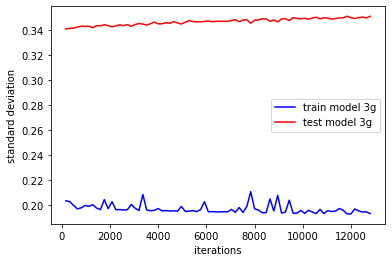

In [172]:
plt.plot(res3g[1,:],res3g[2,:],'-',color='blue',label='train model 3g')
plt.plot(res3g[1,:],res3g[3,:],'-',color='red',label='test model 3g')
plt.xlabel("iterations")
#plt.title("model 3d")
plt.ylabel("standard deviation")
plt.legend(loc="best")
#stabke converge but less good performance
#now betetr with 0.04 normalization 0.276 minimum
#0.05 trial one 0.292 but did not converge likely, now on more 0.303, next 0.302, next 0.303 seems to depend on run  
print(min(res3g[3]))

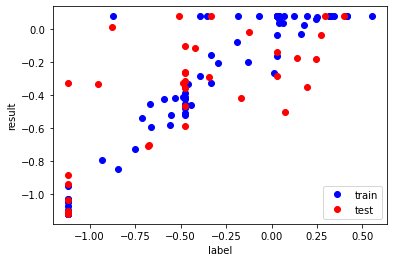

In [173]:
plt.plot(y_train,prediction3trg,'o',color='blue',label='train')
plt.plot(y_test,prediction3teg,'o',color='red',label='test')
plt.xlabel("label")
plt.ylabel("result")
plt.legend(loc="best")
#sometimes like here it invent a result value limit, which is not right
#or just chance? 

Now trying convolutional 1d layer. 

In [148]:
#bring the data in the right shape
#19 uses because can be devided without rest 
print(xsel_train.shape[1]/9/7)
xsel_traind = xsel_train.reshape(xsel_train.shape[0], round(xsel_train.shape[1]/19), 19)
xsel_testd = xsel_test.reshape(xsel_test.shape[0], round(xsel_test.shape[1]/19), 19)

19.0


In [141]:
model4 = Sequential(
    [   
        Conv1D(30,16,strides=1, padding="same", activation="relu", name="layer1",input_shape=(63,19)),         
        MaxPooling1D(pool_size=8, name="layer2"),
        Conv1D(15,16,strides=1, padding="same", activation="relu", name="layer3"),  
        MaxPooling1D(pool_size=4, name="layer4"),        
        Flatten(name="layer5"),        
        Dense(5, activation="relu", name="layer6"),
        Dense(1, activation = "linear", name="layer7")
    ], name = "model4"
) 
model4.summary()


Model: "model4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 layer1 (Conv1D)             (None, 63, 30)            9150      
                                                                 
 layer2 (MaxPooling1D)       (None, 7, 30)             0         
                                                                 
 layer3 (Conv1D)             (None, 7, 15)             7215      
                                                                 
 layer4 (MaxPooling1D)       (None, 1, 15)             0         
                                                                 
 layer5 (Flatten)            (None, 15)                0         
                                                                 
 layer6 (Dense)              (None, 5)                 80        
                                                                 
 layer7 (Dense)              (None, 1)                 6    

In [142]:
model4.compile(
    loss=tf.keras.losses.MeanSquaredError(), 
    optimizer=tf.keras.optimizers.Adam(0.01),
)


In [144]:
res4=np.zeros((6,40))
#tf.keras.utils.set_random_seed(1306)
for i in range(40):
    print(i)
    model4.fit(
        xsel_traind,y_train,
        epochs=160,batch_size=74
        )
    prediction4tr =model4.predict(xsel_traind)
    prediction4te =model4.predict(xsel_testd)
    res4[0,i]=i
    res4[1,i]=(i+1)*160
    res4[2,i]=np.std(y_train-prediction4tr[:,0])
    res4[3,i]=np.std(y_test-prediction4te[:,0])
    res4[4,i]=np.mean((y_train-prediction4tr[:,0])**2)
    res4[5,i]=np.mean((y_test-prediction4te[:,0])**2)
#first 5 attempts today (26/9) attemot was trapped in equal numbers minimum    
#next two get onky slightly below and then up again 
#in other attemps converges fast 

0
Epoch 1/160
1/1 [==============================] - 0s 11ms/step - loss: 0.2319
Epoch 2/160
1/1 [==============================] - 0s 11ms/step - loss: 0.2319
Epoch 3/160
1/1 [==============================] - 0s 10ms/step - loss: 0.2319
Epoch 4/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 5/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 6/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 7/160
1/1 [==============================] - 0s 11ms/step - loss: 0.2319
Epoch 8/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 9/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 10/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 11/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 12/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 13/160
1/1 [=============================

1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 44/160
1/1 [==============================] - 0s 11ms/step - loss: 0.2319
Epoch 45/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 46/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 47/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 48/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 49/160
1/1 [==============================] - 0s 11ms/step - loss: 0.2319
Epoch 50/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 51/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 52/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 53/160
1/1 [==============================] - 0s 11ms/step - loss: 0.2319
Epoch 54/160
1/1 [==============================] - 0s 10ms/step - loss: 0.2319
Epoch 55/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 11ms/step - loss: 0.2319
Epoch 146/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 147/160
1/1 [==============================] - 0s 11ms/step - loss: 0.2319
Epoch 148/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 149/160
1/1 [==============================] - 0s 11ms/step - loss: 0.2319
Epoch 150/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 151/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 152/160
1/1 [==============================] - 0s 11ms/step - loss: 0.2319
Epoch 153/160
1/1 [==============================] - 0s 11ms/step - loss: 0.2319
Epoch 154/160
1/1 [==============================] - 0s 10ms/step - loss: 0.2319
Epoch 155/160
1/1 [==============================] - 0s 11ms/step - loss: 0.2319
Epoch 156/160
1/1 [==============================] - 0s 11ms/step - loss: 0.2319
Epoch 157/160
1/1 [=======================

1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 27/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 28/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 29/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 30/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 31/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 32/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 33/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 34/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 35/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 36/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 37/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 38/160
1/1 [==============================] - 0

Epoch 69/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 70/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 71/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 72/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 73/160
1/1 [==============================] - 0s 10ms/step - loss: 0.2319
Epoch 74/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 75/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 76/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 77/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 78/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 79/160
1/1 [==============================] - 0s 11ms/step - loss: 0.2319
Epoch 80/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 81/160
1/1 [======================

1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 112/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 113/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 114/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 115/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 116/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 117/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 118/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 119/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 120/160
1/1 [==============================] - 0s 16ms/step - loss: 0.2319
Epoch 121/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 122/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 123/160
1/1 [=======================

1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 153/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 154/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 155/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 156/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 157/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 158/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 159/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 160/160
2/2 [==============================] - 0s 2ms/step
7
Epoch 1/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 2/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 3/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 4/160
1/1 [==============================] - 0s 14ms/ste

1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 34/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 35/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 36/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 37/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 38/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 39/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 40/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 41/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 42/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 43/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 44/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 45/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 136/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 137/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 138/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 139/160
1/1 [==============================] - 0s 11ms/step - loss: 0.2319
Epoch 140/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 141/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 142/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 143/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 144/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 145/160
1/1 [==============================] - 0s 11ms/step - loss: 0.2319
Epoch 146/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 147/160
1/1 [=======================

1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 77/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 78/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 79/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 80/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 81/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 82/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 83/160
1/1 [==============================] - 0s 17ms/step - loss: 0.2319
Epoch 84/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 85/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 86/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 87/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 88/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 119/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 120/160
1/1 [==============================] - 0s 16ms/step - loss: 0.2319
Epoch 121/160
1/1 [==============================] - 0s 16ms/step - loss: 0.2319
Epoch 122/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 123/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 124/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 125/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 126/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 127/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 128/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 129/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 130/160
1/1 [=======================

1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 160/160
2/2 [==============================] - 0s 3ms/step
12
Epoch 1/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 2/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 3/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 4/160
1/1 [==============================] - 0s 11ms/step - loss: 0.2319
Epoch 5/160
1/1 [==============================] - 0s 11ms/step - loss: 0.2319
Epoch 6/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 7/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 8/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 9/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 10/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 11/160
1/1 [==============================] - 0s 13ms/step - loss: 0

1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 41/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 42/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 43/160
1/1 [==============================] - 0s 16ms/step - loss: 0.2319
Epoch 44/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 45/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 46/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 47/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 48/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 49/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 50/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 51/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 52/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 143/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 144/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 145/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 146/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 147/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 148/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 149/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 150/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 151/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 152/160
1/1 [==============================] - 0s 16ms/step - loss: 0.2319
Epoch 153/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 154/160
1/1 [=======================

1/1 [==============================] - 0s 16ms/step - loss: 0.2319
Epoch 84/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 85/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 86/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 87/160
1/1 [==============================] - 0s 17ms/step - loss: 0.2319
Epoch 88/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 89/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 90/160
1/1 [==============================] - 0s 16ms/step - loss: 0.2319
Epoch 91/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 92/160
1/1 [==============================] - 0s 16ms/step - loss: 0.2319
Epoch 93/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 94/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 95/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 126/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 127/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 128/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 129/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 130/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 131/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 132/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 133/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 134/160
1/1 [==============================] - 0s 19ms/step - loss: 0.2319
Epoch 135/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 136/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 137/160
1/1 [=======================

Epoch 66/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 67/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 68/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 69/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 70/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 71/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 72/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 73/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 74/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 75/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 76/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 77/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 78/160
1/1 [======================

1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 109/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 110/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 111/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 112/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 113/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 114/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 115/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 116/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 117/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 118/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 119/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 120/160
1/1 [=======================

Epoch 150/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 151/160
1/1 [==============================] - 0s 16ms/step - loss: 0.2319
Epoch 152/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 153/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 154/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 155/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 156/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 157/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 158/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 159/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 160/160
2/2 [==============================] - 0s 3ms/step
19
Epoch 1/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 2/160
1/1 [==========================

1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 92/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 93/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 94/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 95/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 96/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 97/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 98/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 99/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 100/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 101/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 102/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 103/160
1/1 [==============================]

1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 134/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 135/160
1/1 [==============================] - 0s 17ms/step - loss: 0.2319
Epoch 136/160
1/1 [==============================] - 0s 16ms/step - loss: 0.2319
Epoch 137/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 138/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 139/160
1/1 [==============================] - 0s 17ms/step - loss: 0.2319
Epoch 140/160
1/1 [==============================] - 0s 17ms/step - loss: 0.2319
Epoch 141/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 142/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 143/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 144/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 145/160
1/1 [=======================

1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 75/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 76/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 77/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 78/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 79/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 80/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 81/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 82/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 83/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 84/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 85/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 86/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 117/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 118/160
1/1 [==============================] - 0s 18ms/step - loss: 0.2319
Epoch 119/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 120/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 121/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 122/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 123/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 124/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 125/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 126/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 127/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 128/160
1/1 [=======================

1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 158/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 159/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 160/160
2/2 [==============================] - 0s 3ms/step
24
Epoch 1/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 2/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 3/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 4/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 5/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 6/160
1/1 [==============================] - 0s 16ms/step - loss: 0.2319
Epoch 7/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 8/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 9/160
1/1 [==============================] - 0s 13ms/step - loss:

1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 39/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 40/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 41/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 42/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 43/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 44/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 45/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 46/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 47/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 48/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 49/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 50/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 141/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 142/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 143/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 144/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 145/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 146/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 147/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 148/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 149/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 150/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 151/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 152/160
1/1 [=======================

1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 82/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 83/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 84/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 85/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 86/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 87/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 88/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 89/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 90/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 91/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 92/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 93/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 124/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 125/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 126/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 127/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 128/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 129/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 130/160
1/1 [==============================] - 0s 11ms/step - loss: 0.2319
Epoch 131/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 132/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 133/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 134/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 135/160
1/1 [=======================

1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 4/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 5/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 6/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 7/160
1/1 [==============================] - 0s 10ms/step - loss: 0.2319
Epoch 8/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 9/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 10/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 11/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 12/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 13/160
1/1 [==============================] - 0s 11ms/step - loss: 0.2319
Epoch 14/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 15/160
1/1 [==============================] - 0s 13ms

1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 46/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 47/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 48/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 49/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 50/160
1/1 [==============================] - 0s 11ms/step - loss: 0.2319
Epoch 51/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 52/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 53/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 54/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 55/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 56/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 57/160
1/1 [==============================] - 0

Epoch 147/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 148/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 149/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 150/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 151/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 152/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 153/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 154/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 155/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 156/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 157/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 158/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 159/160
1/1 [=========

1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 89/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 90/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 91/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 92/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 93/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 94/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 95/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 96/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 97/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 98/160
1/1 [==============================] - 0s 11ms/step - loss: 0.2319
Epoch 99/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 100/160
1/1 [==============================] - 

1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 131/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 132/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 133/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 134/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 135/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 136/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 137/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 138/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 139/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 140/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 141/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 142/160
1/1 [=======================

Epoch 71/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 72/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 73/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 74/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 75/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 76/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 77/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 78/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 79/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 80/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 81/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 82/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 83/160
1/1 [======================

1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 114/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 115/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 116/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 117/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 118/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 119/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 120/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 121/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 122/160
1/1 [==============================] - 0s 17ms/step - loss: 0.2319
Epoch 123/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 124/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 125/160
1/1 [=======================

1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 155/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 156/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 157/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 158/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 159/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 160/160
2/2 [==============================] - 0s 3ms/step
36
Epoch 1/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 2/160
1/1 [==============================] - 0s 11ms/step - loss: 0.2319
Epoch 3/160
1/1 [==============================] - 0s 11ms/step - loss: 0.2319
Epoch 4/160
1/1 [==============================] - 0s 11ms/step - loss: 0.2319
Epoch 5/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 6/160
1/1 [==============================] - 0s 15ms/step -

1/1 [==============================] - 0s 16ms/step - loss: 0.2319
Epoch 36/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 37/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 38/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 39/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 40/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 41/160
1/1 [==============================] - 0s 12ms/step - loss: 0.2319
Epoch 42/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 43/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 44/160
1/1 [==============================] - 0s 16ms/step - loss: 0.2319
Epoch 45/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 46/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 47/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 138/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 139/160
1/1 [==============================] - 0s 16ms/step - loss: 0.2319
Epoch 140/160
1/1 [==============================] - 0s 16ms/step - loss: 0.2319
Epoch 141/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 142/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 143/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 144/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 145/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 146/160
1/1 [==============================] - 0s 18ms/step - loss: 0.2319
Epoch 147/160
1/1 [==============================] - 0s 16ms/step - loss: 0.2319
Epoch 148/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 149/160
1/1 [=======================

1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 79/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 80/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 81/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 82/160
1/1 [==============================] - 0s 16ms/step - loss: 0.2319
Epoch 83/160
1/1 [==============================] - 0s 16ms/step - loss: 0.2319
Epoch 84/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 85/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 86/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 87/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 88/160
1/1 [==============================] - 0s 16ms/step - loss: 0.2319
Epoch 89/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 90/160
1/1 [==============================] - 0

1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 121/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 122/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 123/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 124/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 125/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 126/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 127/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 128/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 129/160
1/1 [==============================] - 0s 14ms/step - loss: 0.2319
Epoch 130/160
1/1 [==============================] - 0s 13ms/step - loss: 0.2319
Epoch 131/160
1/1 [==============================] - 0s 15ms/step - loss: 0.2319
Epoch 132/160
1/1 [=======================

minimal standeviation of test for model 3d 0.279
minimal standeviation of test for model 3e 0.288
minimal standeviation of test for model 4 0.449
minimal standeviation of test for model 3c 0.273
minimal standeviation of test for model 3b 0.308
minimal standeviation of test for model 3 0.277


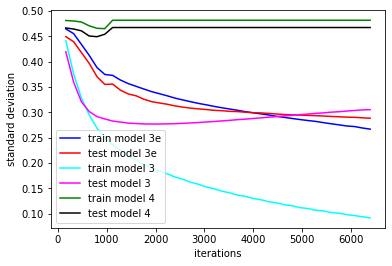

In [140]:
plt.plot(res3e[1,:],res3e[2,:],'-',color='blue',label='train model 3e')
plt.plot(res3e[1,:],res3e[3,:],'-',color='red',label='test model 3e')
plt.plot(res3[1,:],res3[2,:],'-',color='cyan',label='train model 3')
plt.plot(res3[1,:],res3[3,:],'-',color='magenta',label='test model 3')
plt.plot(res4[1,:],res4[2,:],'-',color='green',label='train model 4')
plt.plot(res4[1,:],res4[3,:],'-',color='black',label='test model 4')
plt.xlabel("iterations")
#plt.title("model 3d")
plt.ylabel("standard deviation")
plt.legend(loc="best")
print(f"minimal standeviation of test for model 3d {round(np.min(res3d[3,:]),3)}")
print(f"minimal standeviation of test for model 3e {round(np.min(res3e[3,:]),3)}")
print(f"minimal standeviation of test for model 4 {round(np.min(res4[3,:]),3)}")
print(f"minimal standeviation of test for model 3c {round(np.min(res3c[3,:]),3)}")
print(f"minimal standeviation of test for model 3b {round(np.min(res3b[3,:]),3)}")
print(f"minimal standeviation of test for model 3 {round(np.min(res3[3,:]),3)}")

Converges in relatively few iterations, but often only to equal results for all local minimum. Also less stable than model 3 variants, can jump out again. All models have similar minimal standard deviation. The somewhat larger of model 3b  is likely just because it did not fully converged. 

Conv1d on scaled data now. 


In [172]:
#bring the scaled data in the right shape
xsel_trainds = xsel_trainscaled.reshape(xsel_trainscaled.shape[0], round(xsel_trainscaled.shape[1]/19), 19)
xsel_testds = xsel_testscaled.reshape(xsel_testscaled.shape[0], round(xsel_testscaled.shape[1]/19), 19)

In [184]:
model4b = Sequential(
    [   
        Conv1D(30,16,strides=1, padding="same", activation="relu", name="layer1",input_shape=(63,19)),         
        MaxPooling1D(pool_size=8, name="layer2"),
        Conv1D(15,16,strides=1, padding="same", activation="relu", name="layer3"),  
        MaxPooling1D(pool_size=4, name="layer4"),        
        Flatten(name="layer5"),        
        Dense(5, activation="relu", name="layer6"),
        Dense(1, activation = "linear", name="layer7")
    ], name = "model4b"
) 
model4b.summary()


Model: "model4b"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 layer1 (Conv1D)             (None, 63, 30)            9150      
                                                                 
 layer2 (MaxPooling1D)       (None, 7, 30)             0         
                                                                 
 layer3 (Conv1D)             (None, 7, 15)             7215      
                                                                 
 layer4 (MaxPooling1D)       (None, 1, 15)             0         
                                                                 
 layer5 (Flatten)            (None, 15)                0         
                                                                 
 layer6 (Dense)              (None, 5)                 80        
                                                                 
 layer7 (Dense)              (None, 1)                 6   

In [185]:
model4b.compile(
    loss=tf.keras.losses.MeanSquaredError(), 
    optimizer=tf.keras.optimizers.Adam(0.01),
)


In [186]:
res4b=np.zeros((6,40))
#tf.keras.utils.set_random_seed(1306)
for i in range(40):
    print(i)
    its=int(10)
    model4b.fit(
        xsel_trainds,y_train,
        epochs=its,batch_size=74
        )
    prediction4trb =model4b.predict(xsel_trainds)
    prediction4teb =model4b.predict(xsel_testds)
    res4b[0,i]=i
    res4b[1,i]=(i+1)*its
    res4b[2,i]=np.std(y_train-prediction4trb[:,0])
    res4b[3,i]=np.std(y_test-prediction4teb[:,0])
    res4b[4,i]=np.mean((y_train-prediction4trb[:,0])**2)
    res4b[5,i]=np.mean((y_test-prediction4teb[:,0])**2)
#attempt 1 all equal results (loss of 0.2319) 
#attemot 2/3 works fast need different eoch numbers 
#4/5/6 equal properties fast 
#faster conevrege but otherwise seems seems not better than w/o scaling

0
Epoch 1/10
1/1 [==============================] - 0s 384ms/step - loss: 0.4360
Epoch 2/10
1/1 [==============================] - 0s 11ms/step - loss: 25.8945
Epoch 3/10
1/1 [==============================] - 0s 12ms/step - loss: 8.2750
Epoch 4/10
1/1 [==============================] - 0s 14ms/step - loss: 12.4348
Epoch 5/10
1/1 [==============================] - 0s 12ms/step - loss: 4.9808
Epoch 6/10
1/1 [==============================] - 0s 13ms/step - loss: 1.4323
Epoch 7/10
1/1 [==============================] - 0s 12ms/step - loss: 3.5265
Epoch 8/10
1/1 [==============================] - 0s 13ms/step - loss: 3.2985
Epoch 9/10
1/1 [==============================] - 0s 13ms/step - loss: 0.9178
Epoch 10/10
2/2 [==============================] - 0s 4ms/step
1
Epoch 1/10
1/1 [==============================] - 0s 12ms/step - loss: 1.7151
Epoch 2/10
1/1 [==============================] - 0s 12ms/step - loss: 1.6597
Epoch 3/10
1/1 [==============================] - 0s 14ms/step - loss: 0

2/2 [==============================] - 0s 2ms/step
18
Epoch 1/10
1/1 [==============================] - 0s 11ms/step - loss: 2.8869e-08
Epoch 2/10
1/1 [==============================] - 0s 14ms/step - loss: 1.8460e-08
Epoch 3/10
1/1 [==============================] - 0s 13ms/step - loss: 4.6269e-09
Epoch 4/10
1/1 [==============================] - 0s 12ms/step - loss: 2.5802e-08
Epoch 5/10
1/1 [==============================] - 0s 14ms/step - loss: 7.3917e-09
Epoch 6/10
1/1 [==============================] - 0s 16ms/step - loss: 7.8600e-09
Epoch 7/10
1/1 [==============================] - 0s 12ms/step - loss: 1.7370e-08
Epoch 8/10
1/1 [==============================] - 0s 14ms/step - loss: 1.5374e-09
Epoch 9/10
1/1 [==============================] - 0s 12ms/step - loss: 1.0987e-08
Epoch 10/10
2/2 [==============================] - 0s 2ms/step
19
Epoch 1/10
1/1 [==============================] - 0s 12ms/step - loss: 1.0392e-09
Epoch 2/10
1/1 [==============================] - 0s 13ms/st

1/1 [==============================] - 0s 13ms/step - loss: 4.2061e-14
Epoch 8/10
1/1 [==============================] - 0s 13ms/step - loss: 4.8227e-14
Epoch 9/10
1/1 [==============================] - 0s 12ms/step - loss: 3.4316e-14
Epoch 10/10
2/2 [==============================] - 0s 3ms/step
36
Epoch 1/10
1/1 [==============================] - 0s 11ms/step - loss: 6.1850e-14
Epoch 2/10
1/1 [==============================] - 0s 12ms/step - loss: 6.4611e-14
Epoch 3/10
1/1 [==============================] - 0s 12ms/step - loss: 3.3548e-14
Epoch 4/10
1/1 [==============================] - 0s 12ms/step - loss: 4.7063e-14
Epoch 5/10
1/1 [==============================] - 0s 11ms/step - loss: 6.8799e-14
Epoch 6/10
1/1 [==============================] - 0s 13ms/step - loss: 7.6157e-14
Epoch 7/10
1/1 [==============================] - 0s 11ms/step - loss: 4.6607e-14
Epoch 8/10
1/1 [==============================] - 0s 13ms/step - loss: 4.2850e-14
Epoch 9/10
1/1 [===========================

minimal standeviation of test for model 3d 0.279
minimal standeviation of test for model 3e 0.288
minimal standeviation of test for model 4b 0.463
minimal standeviation of test for model 3c 0.273
minimal standeviation of test for model 3b 0.308
minimal standeviation of test for model 3 0.277


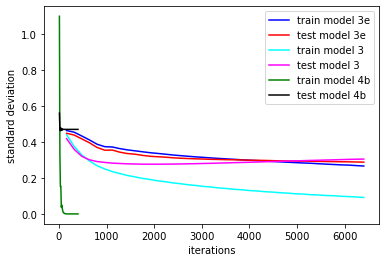

In [187]:
plt.plot(res3e[1,:],res3e[2,:],'-',color='blue',label='train model 3e')
plt.plot(res3e[1,:],res3e[3,:],'-',color='red',label='test model 3e')
plt.plot(res3[1,:],res3[2,:],'-',color='cyan',label='train model 3')
plt.plot(res3[1,:],res3[3,:],'-',color='magenta',label='test model 3')
plt.plot(res4b[1,:],res4b[2,:],'-',color='green',label='train model 4b')
plt.plot(res4b[1,:],res4b[3,:],'-',color='black',label='test model 4b')
plt.xlabel("iterations")
#plt.title("model 3d")
plt.ylabel("standard deviation")
plt.legend(loc="best")
print(f"minimal standeviation of test for model 3d {round(np.min(res3d[3,:]),3)}")
print(f"minimal standeviation of test for model 3e {round(np.min(res3e[3,:]),3)}")
print(f"minimal standeviation of test for model 4b {round(np.min(res4b[3,:]),3)}")
print(f"minimal standeviation of test for model 3c {round(np.min(res3c[3,:]),3)}")
print(f"minimal standeviation of test for model 3b {round(np.min(res3b[3,:]),3)}")
print(f"minimal standeviation of test for model 3 {round(np.min(res3[3,:]),3)}")

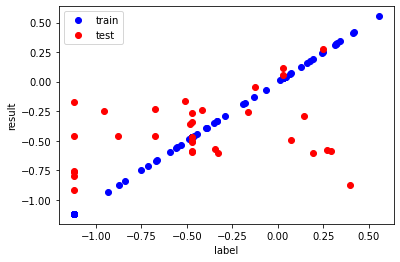

In [188]:
plt.plot(y_train,prediction4trb,'o',color='blue',label='train')
plt.plot(y_test,prediction4teb,'o',color='red',label='test')
plt.xlabel("label")
plt.ylabel("result")
plt.legend(loc="best")

Looks really bad on test. Is it just because w/o regularzaition it changes so fast that it is in no epoch in a right fit state. Thus we add regulariation. 

In [246]:
model4c = Sequential(
    [   
        Conv1D(30,16,strides=1, padding="same", activation="relu",kernel_regularizer=tf.keras.regularizers.L1(0.02), name="layer1",input_shape=(63,19)),         
        MaxPooling1D(pool_size=8, name="layer2"),
        Conv1D(15,16,strides=1, padding="same", activation="relu",kernel_regularizer=tf.keras.regularizers.L1(0.02), name="layer3"),  
        MaxPooling1D(pool_size=4, name="layer4"),        
        Flatten(name="layer5"),        
        Dense(5, activation="relu",kernel_regularizer=tf.keras.regularizers.L1(0.02), name="layer6"),
        Dense(1, activation = "linear",kernel_regularizer=tf.keras.regularizers.L1(0.02), name="layer7")
    ], name = "model4c"
) 
model4c.summary()


Model: "model4c"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 layer1 (Conv1D)             (None, 63, 30)            9150      
                                                                 
 layer2 (MaxPooling1D)       (None, 7, 30)             0         
                                                                 
 layer3 (Conv1D)             (None, 7, 15)             7215      
                                                                 
 layer4 (MaxPooling1D)       (None, 1, 15)             0         
                                                                 
 layer5 (Flatten)            (None, 15)                0         
                                                                 
 layer6 (Dense)              (None, 5)                 80        
                                                                 
 layer7 (Dense)              (None, 1)                 6   

In [247]:
model4c.compile(
    loss=tf.keras.losses.MeanSquaredError(), 
    optimizer=tf.keras.optimizers.Adam(0.01),
)


In [248]:
res4c=np.zeros((6,40))
#tf.keras.utils.set_random_seed(1306)
for i in range(40):
    print(i)
    its=int(10)
    model4c.fit(
        xsel_trainds,y_train,
        epochs=its,batch_size=74
        )
    prediction4trc =model4c.predict(xsel_trainds)
    prediction4tec =model4c.predict(xsel_testds)
    res4c[0,i]=i
    res4c[1,i]=(i+1)*its
    res4c[2,i]=np.std(y_train-prediction4trc[:,0])
    res4c[3,i]=np.std(y_test-prediction4tec[:,0])
    res4c[4,i]=np.mean((y_train-prediction4trc[:,0])**2)
    res4c[5,i]=np.mean((y_test-prediction4tec[:,0])**2)   

0
Epoch 1/10
1/1 [==============================] - 1s 577ms/step - loss: 17.2707
Epoch 2/10
1/1 [==============================] - 0s 13ms/step - loss: 14.2923
Epoch 3/10
1/1 [==============================] - 0s 13ms/step - loss: 12.8792
Epoch 4/10
1/1 [==============================] - 0s 12ms/step - loss: 11.5059
Epoch 5/10
1/1 [==============================] - 0s 14ms/step - loss: 10.2579
Epoch 6/10
1/1 [==============================] - 0s 16ms/step - loss: 9.1603
Epoch 7/10
1/1 [==============================] - 0s 14ms/step - loss: 8.2128
Epoch 8/10
1/1 [==============================] - 0s 13ms/step - loss: 7.4276
Epoch 9/10
1/1 [==============================] - 0s 13ms/step - loss: 6.8824
Epoch 10/10
2/2 [==============================] - 0s 4ms/step
1
Epoch 1/10
1/1 [==============================] - 0s 12ms/step - loss: 6.3900
Epoch 2/10
1/1 [==============================] - 0s 11ms/step - loss: 6.1871
Epoch 3/10
1/1 [==============================] - 0s 14ms/step - loss

Epoch 6/10
1/1 [==============================] - 0s 14ms/step - loss: 0.6537
Epoch 7/10
1/1 [==============================] - 0s 13ms/step - loss: 0.6514
Epoch 8/10
1/1 [==============================] - 0s 13ms/step - loss: 0.6442
Epoch 9/10
1/1 [==============================] - 0s 11ms/step - loss: 0.6449
Epoch 10/10
2/2 [==============================] - 0s 3ms/step
19
Epoch 1/10
1/1 [==============================] - 0s 14ms/step - loss: 0.6503
Epoch 2/10
1/1 [==============================] - 0s 11ms/step - loss: 0.6515
Epoch 3/10
1/1 [==============================] - 0s 11ms/step - loss: 0.6441
Epoch 4/10
1/1 [==============================] - 0s 13ms/step - loss: 0.6425
Epoch 5/10
1/1 [==============================] - 0s 15ms/step - loss: 0.6469
Epoch 6/10
1/1 [==============================] - 0s 13ms/step - loss: 0.6492
Epoch 7/10
1/1 [==============================] - 0s 12ms/step - loss: 0.6481
Epoch 8/10
1/1 [==============================] - 0s 12ms/step - loss: 0.643

2/2 [==============================] - 0s 3ms/step
37
Epoch 1/10
1/1 [==============================] - 0s 12ms/step - loss: 0.6187
Epoch 2/10
1/1 [==============================] - 0s 12ms/step - loss: 0.6199
Epoch 3/10
1/1 [==============================] - 0s 11ms/step - loss: 0.6158
Epoch 4/10
1/1 [==============================] - 0s 12ms/step - loss: 0.6153
Epoch 5/10
1/1 [==============================] - 0s 15ms/step - loss: 0.6119
Epoch 6/10
1/1 [==============================] - 0s 14ms/step - loss: 0.6124
Epoch 7/10
1/1 [==============================] - 0s 11ms/step - loss: 0.6169
Epoch 8/10
1/1 [==============================] - 0s 12ms/step - loss: 0.6165
Epoch 9/10
1/1 [==============================] - 0s 14ms/step - loss: 0.6164
Epoch 10/10
2/2 [==============================] - 0s 3ms/step
38
Epoch 1/10
1/1 [==============================] - 0s 13ms/step - loss: 0.6116
Epoch 2/10
1/1 [==============================] - 0s 14ms/step - loss: 0.6124
Epoch 3/10
1/1 [======

minimal standeviation of test for model 3d 0.279
minimal standeviation of test for model 3e 0.288
minimal standeviation of test for model 4c 0.466
minimal standeviation of test for model 3c 0.273
minimal standeviation of test for model 3b 0.308
minimal standeviation of test for model 3 0.277


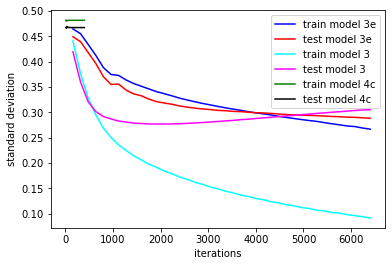

In [245]:
plt.plot(res3e[1,:],res3e[2,:],'-',color='blue',label='train model 3e')
plt.plot(res3e[1,:],res3e[3,:],'-',color='red',label='test model 3e')
plt.plot(res3[1,:],res3[2,:],'-',color='cyan',label='train model 3')
plt.plot(res3[1,:],res3[3,:],'-',color='magenta',label='test model 3')
plt.plot(res4c[1,:],res4c[2,:],'-',color='green',label='train model 4c')
plt.plot(res4c[1,:],res4c[3,:],'-',color='black',label='test model 4c')
plt.xlabel("iterations")
#plt.title("model 3d")
plt.ylabel("standard deviation")
plt.legend(loc="best")
print(f"minimal standeviation of test for model 3d {round(np.min(res3d[3,:]),3)}")
print(f"minimal standeviation of test for model 3e {round(np.min(res3e[3,:]),3)}")
print(f"minimal standeviation of test for model 4c {round(np.min(res4c[3,:]),3)}")
print(f"minimal standeviation of test for model 3c {round(np.min(res3c[3,:]),3)}")
print(f"minimal standeviation of test for model 3b {round(np.min(res3b[3,:]),3)}")
print(f"minimal standeviation of test for model 3 {round(np.min(res3[3,:]),3)}")
#0.005 clearly to little regulariation 
#0.1 too much or other problem? 
#0.01 too little
#always equal prob 

No close to reliable fit for 1d convolutional attempts. 

Now we use the PCA weights obtained using all, also the not labelled data.

In [249]:
#get the pca components
pca=np.loadtxt("pca_caseb_v1.txt")
print(f"PCA weights shape {np.shape(pca)}")
print(f"traing feature shape {np.shape(xsel_train)}")
#applying them on the data
xselp_train=np.matmul(pca,xsel_train.T).T
xselp_test=np.matmul(pca,xsel_test.T).T
print(f"traing feature shape after PCA {np.shape(xselp_train)}")
#after third order normalization
pca3=np.loadtxt("pca_caseb_norm3_v1.txt")
xselnp_train=np.matmul(pca3,xseln_train.T).T
xselnp_test=np.matmul(pca3,xseln_test.T).T

PCA weights shape (1000, 1197)
traing feature shape (74, 1197)
traing feature shape after PCA (74, 1000)


Plotting PCA transormed values. 

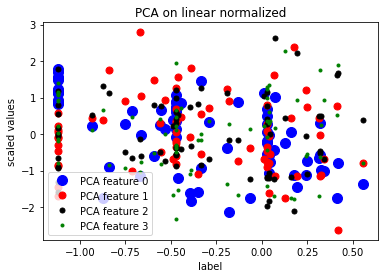

In [250]:
plt.plot(y_train,(xselp_train[:,0]-np.mean(xselp_train[:,0]))/np.std(xselp_train[:,0]),'o',color='blue',ms=10,label='PCA feature 0')
plt.plot(y_train,(xselp_train[:,1]-np.mean(xselp_train[:,1]))/np.std(xselp_train[:,1]),'o',color='red',ms=7,label='PCA feature 1')
plt.plot(y_train,(xselp_train[:,2]-np.mean(xselp_train[:,2]))/np.std(xselp_train[:,2]),'o',color='black',ms=5,label='PCA feature 2')
plt.plot(y_train,(xselp_train[:,3]-np.mean(xselp_train[:,3]))/np.std(xselp_train[:,3]),'o',color='green',ms=3,label='PCA feature 3')
plt.xlabel("label")
plt.ylabel("scaled values")
plt.title("PCA on linear normalized")
plt.legend(loc="best")

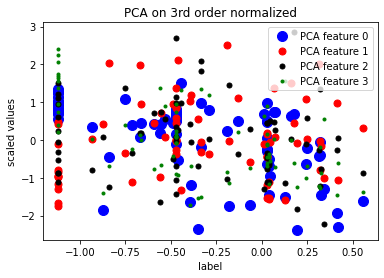

In [251]:
plt.plot(y_train,(xselnp_train[:,0]-np.mean(xselnp_train[:,0]))/np.std(xselnp_train[:,0]),'o',color='blue',ms=10,label='PCA feature 0')
plt.plot(y_train,(xselnp_train[:,1]-np.mean(xselnp_train[:,1]))/np.std(xselnp_train[:,1]),'o',color='red',ms=7,label='PCA feature 1')
plt.plot(y_train,(xselnp_train[:,2]-np.mean(xselnp_train[:,2]))/np.std(xselnp_train[:,2]),'o',color='black',ms=5,label='PCA feature 2')
plt.plot(y_train,(xselnp_train[:,3]-np.mean(xselnp_train[:,3]))/np.std(xselnp_train[:,3]),'o',color='green',ms=3,label='PCA feature 3')
plt.xlabel("label")
plt.ylabel("scaled values")
plt.title("PCA on 3rd order normalized")
plt.legend(loc="best")

There is a clear relation between feature 0 and the label for both order of normalizations. After them it is less clear. We start with linear regression.

In [252]:
print("linear normalization")
resp=np.zeros((13,9))
for i in range(1,10):
    print(f"number of used features is {i}")
    resp[0,i-1]=i
    regr =LinearRegression()
    regr.fit(xselp_train[:,0:i],y_train)
    print("Intercept:", regr.intercept_)
    print("Coefficients: \n", regr.coef_)
    pred_test_lin1 = regr.predict(xselp_test[:,0:i])
    pred_train_lin1 = regr.predict(xselp_train[:,0:i])
    print("Mean squared error of train: %.3f" % mean_squared_error(y_train,pred_train_lin1))
    print("Mean squared error of test: %.3f" % mean_squared_error(y_test,pred_test_lin1))
    print(f"standard deviation of train: {round(np.std(y_train-pred_train_lin1),3)}")    
    print(f"standard deviation of test: {round(np.std(y_test-pred_test_lin1),3)}")     
    resp[1,i-1]=mean_squared_error(y_train,pred_train_lin1)
    resp[2,i-1]=mean_squared_error(y_test,pred_test_lin1)
    resp[3,i-1]=np.std(y_train-pred_train_lin1)
    resp[4,i-1]=np.std(y_test-pred_test_lin1)

linear normalization
number of used features is 1
Intercept: 4.282899742412502
Coefficients: 
 [-0.5660146]
Mean squared error of train: 0.161
Mean squared error of test: 0.122
standard deviation of train: 0.401
standard deviation of test: 0.341
number of used features is 2
Intercept: 3.9067081609162058
Coefficients: 
 [-0.66519064 -0.56583908]
Mean squared error of train: 0.141
Mean squared error of test: 0.153
standard deviation of train: 0.375
standard deviation of test: 0.389
number of used features is 3
Intercept: 2.978021446097218
Coefficients: 
 [-0.66920207 -0.6036411  -0.25594165]
Mean squared error of train: 0.139
Mean squared error of test: 0.147
standard deviation of train: 0.373
standard deviation of test: 0.382
number of used features is 4
Intercept: 3.264992189749021
Coefficients: 
 [-0.66434397 -0.62604803 -0.24700311 -0.10335253]
Mean squared error of train: 0.139
Mean squared error of test: 0.148
standard deviation of train: 0.373
standard deviation of test: 0.384
num

In [253]:
print("3rd oder normalization")
for i in range(1,10):
    print(f"number of used features is {i}")
    regr =LinearRegression()
    regr.fit(xselnp_train[:,0:i],y_train)
    print("Intercept:", regr.intercept_)
    print("Coefficients: \n", regr.coef_)
    pred_test_lin1 = regr.predict(xselnp_test[:,0:i])
    pred_train_lin1 = regr.predict(xselnp_train[:,0:i])
    print("Mean squared error of train: %.3f" % mean_squared_error(y_train,pred_train_lin1))
    print("Mean squared error of test: %.3f" % mean_squared_error(y_test,pred_test_lin1))
    print(f"standard deviation of train: {round(np.std(y_train-pred_train_lin1),3)}")    
    print(f"standard deviation of test: {round(np.std(y_test-pred_test_lin1),3)}")     
    resp[5,i-1]=mean_squared_error(y_train,pred_train_lin1)
    resp[6,i-1]=mean_squared_error(y_test,pred_test_lin1)
    resp[7,i-1]=np.std(y_train-pred_train_lin1)
    resp[8,i-1]=np.std(y_test-pred_test_lin1)

3rd oder normalization
number of used features is 1
Intercept: 11.101511365906713
Coefficients: 
 [-0.59897953]
Mean squared error of train: 0.163
Mean squared error of test: 0.170
standard deviation of train: 0.404
standard deviation of test: 0.41
number of used features is 2
Intercept: 10.560082902061804
Coefficients: 
 [-0.59362281  0.0749987 ]
Mean squared error of train: 0.163
Mean squared error of test: 0.167
standard deviation of train: 0.404
standard deviation of test: 0.405
number of used features is 3
Intercept: 10.703776726931933
Coefficients: 
 [-0.59889192  0.07503806  0.0612807 ]
Mean squared error of train: 0.163
Mean squared error of test: 0.167
standard deviation of train: 0.403
standard deviation of test: 0.406
number of used features is 4
Intercept: -0.4279090437952658
Coefficients: 
 [-0.20122943 -0.4209101  -0.39714509 -1.81467339]
Mean squared error of train: 0.139
Mean squared error of test: 0.180
standard deviation of train: 0.373
standard deviation of test: 0.4

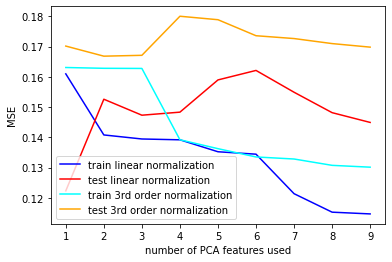

In [254]:
plt.plot(resp[0],resp[1],'-',color='blue',ms=10,label='train linear normalization')
plt.plot(resp[0],resp[2],'-',color='red',ms=10,label='test linear normalization')
plt.plot(resp[0],resp[5],'-',color='cyan',ms=10,label='train 3rd order normalization')
plt.plot(resp[0],resp[6],'-',color='orange',ms=10,label='test 3rd order normalization')
plt.xlabel("number of PCA features used")
plt.ylabel("MSE")
plt.legend(loc="best")

In [255]:
print("3rd oder normalization function PCA")
for i in range(1,10):
    print(f"number of used features is {i}")
    regr =LinearRegression()
    regr.fit(cal3p_train[:,0:i],y_train)
    print("Intercept:", regr.intercept_)
    print("Coefficients: \n", regr.coef_)
    pred_test_lin1 = regr.predict(cal3p_test[:,0:i])
    pred_train_lin1 = regr.predict(cal3p_train[:,0:i])
    print("Mean squared error of train: %.3f" % mean_squared_error(y_train,pred_train_lin1))
    print("Mean squared error of test: %.3f" % mean_squared_error(y_test,pred_test_lin1))
    print(f"standard deviation of train: {round(np.std(y_train-pred_train_lin1),3)}")    
    print(f"standard deviation of test: {round(np.std(y_test-pred_test_lin1),3)}")     
    resp[9,i-1]=mean_squared_error(y_train,pred_train_lin1)
    resp[10,i-1]=mean_squared_error(y_test,pred_test_lin1)
    resp[11,i-1]=np.std(y_train-pred_train_lin1)
    resp[12,i-1]=np.std(y_test-pred_test_lin1)

3rd oder normalization function PCA
number of used features is 1
Intercept: 0.4163879143405224
Coefficients: 
 [-0.59803918]
Mean squared error of train: 0.163
Mean squared error of test: 0.169
standard deviation of train: 0.404
standard deviation of test: 0.409
number of used features is 2
Intercept: 0.41404793703778214
Coefficients: 
 [-0.59665375  0.05537592]
Mean squared error of train: 0.163
Mean squared error of test: 0.169
standard deviation of train: 0.404
standard deviation of test: 0.408
number of used features is 3
Intercept: 0.40425133805114527
Coefficients: 
 [-0.59409812  0.01459019 -0.0580536 ]
Mean squared error of train: 0.163
Mean squared error of test: 0.166
standard deviation of train: 0.404
standard deviation of test: 0.404
number of used features is 4
Intercept: 0.36712701437261147
Coefficients: 
 [-0.57859147 -0.30562856 -0.13463168 -0.74883272]
Mean squared error of train: 0.158
Mean squared error of test: 0.164
standard deviation of train: 0.397
standard deviat

In [125]:
#scores very similar between matmul using coefficents, thus function right enough, use more scitilearn for transform
#slightly smller coef, likely better, maybe rounding issue 
print(resp[7]-resp[11])

[ 9.38944516e-05 -1.48953473e-04 -1.08578064e-04 -2.38338285e-02
 -1.49033617e-03 -2.19614277e-03 -1.63798061e-04 -1.41633447e-03
 -1.40669491e-04]


Since the scores for the test sets get worse when adding more than one order, it is possiblly that only from the first feature is useful to predict the label. There could also be a lot of non linearity making linear combination useless. Thus we look also on a simple neural network.  In linear regression the data with better normalization performs worse. 

In [256]:
model5 = Sequential(
    [              
        tf.keras.Input(shape=(4,)),   
        Dense(3, activation="relu", name="layer1"),   
        Dense(1, activation = 'linear', name="layer2")
    ], name = "model5"
) 
model5.summary()

Model: "model5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 layer1 (Dense)              (None, 3)                 15        
                                                                 
 layer2 (Dense)              (None, 1)                 4         
                                                                 
Total params: 19
Trainable params: 19
Non-trainable params: 0
_________________________________________________________________


In [257]:
model5.compile(
    loss=tf.keras.losses.MeanSquaredError(), 
    optimizer=tf.keras.optimizers.Adam(0.001),
)

In [258]:
#without scaling it is very slow
scaler = preprocessing.StandardScaler().fit(xselp_train[:,0:4])
xselp_trainscaled = scaler.transform(xselp_train[:,0:4])
xselp_testscaled = scaler.transform(xselp_test[:,0:4])

trainresp=xselp_trainscaled[:,0:4].reshape(74,4) 
testresp=xselp_testscaled[:,0:4].reshape(33,4) 

res5=np.zeros((6,500))
#tf.keras.utils.set_random_seed(1306)
for i in range(500):
    print(i)
    model5.fit(
        xselp_trainscaled[:,0:4],y_train,
        epochs=20,batch_size=74
        )
    prediction5tr = model5.predict(trainresp)
    prediction5te = model5.predict(testresp)
    res5[0,i]=i
    res5[1,i]=(i+1)*20
    res5[2,i]=np.std(y_train-prediction5tr[:,0])
    res5[3,i]=np.std(y_test-prediction5te[:,0])
    res5[4,i]=np.mean((y_train-prediction5tr[:,0])**2) 
    res5[5,i]=np.mean((y_test-prediction5te[:,0])**2)  

0
Epoch 1/20
1/1 [==============================] - 0s 255ms/step - loss: 0.7402
Epoch 2/20
1/1 [==============================] - 0s 6ms/step - loss: 0.7348
Epoch 3/20
1/1 [==============================] - 0s 5ms/step - loss: 0.7294
Epoch 4/20
1/1 [==============================] - 0s 6ms/step - loss: 0.7240
Epoch 5/20
1/1 [==============================] - 0s 5ms/step - loss: 0.7187
Epoch 6/20
1/1 [==============================] - 0s 5ms/step - loss: 0.7135
Epoch 7/20
1/1 [==============================] - 0s 5ms/step - loss: 0.7083
Epoch 8/20
1/1 [==============================] - 0s 6ms/step - loss: 0.7033
Epoch 9/20
1/1 [==============================] - 0s 6ms/step - loss: 0.6982
Epoch 10/20
1/1 [==============================] - 0s 5ms/step - loss: 0.6933
Epoch 11/20
1/1 [==============================] - 0s 6ms/step - loss: 0.6884
Epoch 12/20
1/1 [==============================] - 0s 5ms/step - loss: 0.6836
Epoch 13/20
1/1 [==============================] - 0s 5ms/step - loss

Epoch 20/20
2/2 [==============================] - 0s 3ms/step
10
Epoch 1/20
1/1 [==============================] - 0s 7ms/step - loss: 0.3206
Epoch 2/20
1/1 [==============================] - 0s 6ms/step - loss: 0.3198
Epoch 3/20
1/1 [==============================] - 0s 4ms/step - loss: 0.3190
Epoch 4/20
1/1 [==============================] - 0s 5ms/step - loss: 0.3181
Epoch 5/20
1/1 [==============================] - 0s 9ms/step - loss: 0.3173
Epoch 6/20
1/1 [==============================] - 0s 6ms/step - loss: 0.3165
Epoch 7/20
1/1 [==============================] - 0s 5ms/step - loss: 0.3157
Epoch 8/20
1/1 [==============================] - 0s 5ms/step - loss: 0.3149
Epoch 9/20
1/1 [==============================] - 0s 6ms/step - loss: 0.3141
Epoch 10/20
1/1 [==============================] - 0s 4ms/step - loss: 0.3133
Epoch 11/20
1/1 [==============================] - 0s 6ms/step - loss: 0.3125
Epoch 12/20
1/1 [==============================] - 0s 5ms/step - loss: 0.3118
Epoch 1

1/1 [==============================] - 0s 5ms/step - loss: 0.2263
Epoch 18/20
1/1 [==============================] - 0s 6ms/step - loss: 0.2260
Epoch 19/20
1/1 [==============================] - 0s 7ms/step - loss: 0.2258
Epoch 20/20
2/2 [==============================] - 0s 2ms/step
20
Epoch 1/20
1/1 [==============================] - 0s 4ms/step - loss: 0.2253
Epoch 2/20
1/1 [==============================] - 0s 4ms/step - loss: 0.2250
Epoch 3/20
1/1 [==============================] - 0s 6ms/step - loss: 0.2248
Epoch 4/20
1/1 [==============================] - 0s 6ms/step - loss: 0.2246
Epoch 5/20
1/1 [==============================] - 0s 7ms/step - loss: 0.2243
Epoch 6/20
1/1 [==============================] - 0s 5ms/step - loss: 0.2241
Epoch 7/20
1/1 [==============================] - 0s 5ms/step - loss: 0.2239
Epoch 8/20
1/1 [==============================] - 0s 5ms/step - loss: 0.2236
Epoch 9/20
1/1 [==============================] - 0s 6ms/step - loss: 0.2234
Epoch 10/20
1/1 [==

1/1 [==============================] - 0s 4ms/step - loss: 0.2077
Epoch 17/20
1/1 [==============================] - 0s 6ms/step - loss: 0.2076
Epoch 18/20
1/1 [==============================] - 0s 6ms/step - loss: 0.2075
Epoch 19/20
1/1 [==============================] - 0s 5ms/step - loss: 0.2073
Epoch 20/20
2/2 [==============================] - 0s 2ms/step
25
Epoch 1/20
1/1 [==============================] - 0s 4ms/step - loss: 0.2070
Epoch 2/20
1/1 [==============================] - 0s 6ms/step - loss: 0.2069
Epoch 3/20
1/1 [==============================] - 0s 5ms/step - loss: 0.2068
Epoch 4/20
1/1 [==============================] - 0s 5ms/step - loss: 0.2066
Epoch 5/20
1/1 [==============================] - 0s 6ms/step - loss: 0.2065
Epoch 6/20
1/1 [==============================] - 0s 7ms/step - loss: 0.2064
Epoch 7/20
1/1 [==============================] - 0s 6ms/step - loss: 0.2063
Epoch 8/20
1/1 [==============================] - 0s 6ms/step - loss: 0.2061
Epoch 9/20
1/1 [==

1/1 [==============================] - 0s 7ms/step - loss: 0.1977
Epoch 16/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1977
Epoch 17/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1976
Epoch 18/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1975
Epoch 19/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1975
Epoch 20/20
2/2 [==============================] - 0s 2ms/step
30
Epoch 1/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1973
Epoch 2/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1972
Epoch 3/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1972
Epoch 4/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1971
Epoch 5/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1970
Epoch 6/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1970
Epoch 7/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1969
Epoch 8/20
1/1 [=

1/1 [==============================] - 0s 5ms/step - loss: 0.1919
Epoch 15/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1919
Epoch 16/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1918
Epoch 17/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1918
Epoch 18/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1917
Epoch 19/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1917
Epoch 20/20
2/2 [==============================] - 0s 3ms/step
35
Epoch 1/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1916
Epoch 2/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1916
Epoch 3/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1915
Epoch 4/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1915
Epoch 5/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1914
Epoch 6/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1914
Epoch 7/20
1/1 [

1/1 [==============================] - 0s 6ms/step - loss: 0.1878
Epoch 14/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1878
Epoch 15/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1877
Epoch 16/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1877
Epoch 17/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1877
Epoch 18/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1876
Epoch 19/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1876
Epoch 20/20
2/2 [==============================] - 0s 3ms/step
40
Epoch 1/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1875
Epoch 2/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1875
Epoch 3/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1874
Epoch 4/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1874
Epoch 5/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1874
Epoch 6/20
1/1 

1/1 [==============================] - 0s 5ms/step - loss: 0.1839
Epoch 13/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1838
Epoch 14/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1838
Epoch 15/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1838
Epoch 16/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1838
Epoch 17/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1837
Epoch 18/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1837
Epoch 19/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1837
Epoch 20/20
2/2 [==============================] - 0s 2ms/step
45
Epoch 1/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1836
Epoch 2/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1836
Epoch 3/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1836
Epoch 4/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1835
Epoch 5/20
1/1

1/1 [==============================] - 0s 6ms/step - loss: 0.1814
Epoch 12/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1814
Epoch 13/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1814
Epoch 14/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1814
Epoch 15/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1813
Epoch 16/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1813
Epoch 17/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1813
Epoch 18/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1813
Epoch 19/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1813
Epoch 20/20
2/2 [==============================] - 0s 3ms/step
50
Epoch 1/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1812
Epoch 2/20
1/1 [==============================] - 0s 9ms/step - loss: 0.1812
Epoch 3/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1812
Epoch 4/20
1/

1/1 [==============================] - 0s 6ms/step - loss: 0.1758
Epoch 11/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1757
Epoch 12/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1756
Epoch 13/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1755
Epoch 14/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1754
Epoch 15/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1753
Epoch 16/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1752
Epoch 17/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1752
Epoch 18/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1751
Epoch 19/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1750
Epoch 20/20
2/2 [==============================] - 0s 3ms/step
55
Epoch 1/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1748
Epoch 2/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1747
Epoch 3/20
1

1/1 [==============================] - 0s 4ms/step - loss: 0.1680
Epoch 10/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1679
Epoch 11/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1678
Epoch 12/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1677
Epoch 13/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1676
Epoch 14/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1675
Epoch 15/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1674
Epoch 16/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1673
Epoch 17/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1672
Epoch 18/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1671
Epoch 19/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1670
Epoch 20/20
2/2 [==============================] - 0s 2ms/step
60
Epoch 1/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1668
Epoch 2/20


1/1 [==============================] - 0s 4ms/step - loss: 0.1596
Epoch 9/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1596
Epoch 10/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1595
Epoch 11/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1594
Epoch 12/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1593
Epoch 13/20
1/1 [==============================] - 0s 8ms/step - loss: 0.1593
Epoch 14/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1592
Epoch 15/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1591
Epoch 16/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1590
Epoch 17/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1590
Epoch 18/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1589
Epoch 19/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1588
Epoch 20/20
2/2 [==============================] - 0s 2ms/step
65
Epoch 1/20


Epoch 7/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1483
Epoch 8/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1482
Epoch 9/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1481
Epoch 10/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1479
Epoch 11/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1478
Epoch 12/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1476
Epoch 13/20
1/1 [==============================] - 0s 3ms/step - loss: 0.1475
Epoch 14/20
1/1 [==============================] - 0s 3ms/step - loss: 0.1473
Epoch 15/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1472
Epoch 16/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1470
Epoch 17/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1469
Epoch 18/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1467
Epoch 19/20
1/1 [==============================] - 0s 4ms/step - lo

1/1 [==============================] - 0s 6ms/step - loss: 0.1234
Epoch 5/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1233
Epoch 6/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1232
Epoch 7/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1231
Epoch 8/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1230
Epoch 9/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1229
Epoch 10/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1229
Epoch 11/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1228
Epoch 12/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1227
Epoch 13/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1226
Epoch 14/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1225
Epoch 15/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1224
Epoch 16/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1224
Epo

1/1 [==============================] - 0s 5ms/step - loss: 0.1166
Epoch 4/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1165
Epoch 5/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1164
Epoch 6/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1164
Epoch 7/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1163
Epoch 8/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1163
Epoch 9/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1163
Epoch 10/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1162
Epoch 11/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1162
Epoch 12/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1161
Epoch 13/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1161
Epoch 14/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1160
Epoch 15/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1160
Epoc

1/1 [==============================] - 0s 4ms/step - loss: 0.1128
Epoch 3/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1128
Epoch 4/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1128
Epoch 5/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1127
Epoch 6/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1127
Epoch 7/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1127
Epoch 8/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1127
Epoch 9/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1126
Epoch 10/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1126
Epoch 11/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1126
Epoch 12/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1126
Epoch 13/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1125
Epoch 14/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1125
Epoch

1/1 [==============================] - 0s 5ms/step - loss: 0.1110
Epoch 2/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1110
Epoch 3/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1110
Epoch 4/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1109
Epoch 5/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1109
Epoch 6/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1109
Epoch 7/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1109
Epoch 8/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1109
Epoch 9/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1109
Epoch 10/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1109
Epoch 11/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1109
Epoch 12/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1109
Epoch 13/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1108
Epoch 

1/1 [==============================] - 0s 5ms/step - loss: 0.1099
Epoch 20/20
2/2 [==============================] - 0s 3ms/step
104
Epoch 1/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1099
Epoch 2/20
1/1 [==============================] - 0s 3ms/step - loss: 0.1099
Epoch 3/20
1/1 [==============================] - 0s 3ms/step - loss: 0.1099
Epoch 4/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1098
Epoch 5/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1098
Epoch 6/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1098
Epoch 7/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1098
Epoch 8/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1098
Epoch 9/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1098
Epoch 10/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1098
Epoch 11/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1098
Epoch 12/20
1/1 [=

Epoch 18/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1095
Epoch 19/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1095
Epoch 20/20
2/2 [==============================] - 0s 3ms/step
109
Epoch 1/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1095
Epoch 2/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1095
Epoch 3/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1095
Epoch 4/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1095
Epoch 5/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1095
Epoch 6/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1095
Epoch 7/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1095
Epoch 8/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1095
Epoch 9/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1095
Epoch 10/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1095
Epoch 

Epoch 15/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1092
Epoch 16/20
1/1 [==============================] - 0s 3ms/step - loss: 0.1092
Epoch 17/20
1/1 [==============================] - 0s 3ms/step - loss: 0.1092
Epoch 18/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1092
Epoch 19/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1092
Epoch 20/20
2/2 [==============================] - 0s 3ms/step
119
Epoch 1/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1092
Epoch 2/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1092
Epoch 3/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1092
Epoch 4/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1092
Epoch 5/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1092
Epoch 6/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1092
Epoch 7/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1092
Epoc

Epoch 12/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1090
Epoch 13/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1090
Epoch 14/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1090
Epoch 15/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1090
Epoch 16/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1090
Epoch 17/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1090
Epoch 18/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1090
Epoch 19/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1090
Epoch 20/20
2/2 [==============================] - 0s 2ms/step
129
Epoch 1/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1090
Epoch 2/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1090
Epoch 3/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1090
Epoch 4/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1090
E

Epoch 9/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1088
Epoch 10/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1088
Epoch 11/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1088
Epoch 12/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1088
Epoch 13/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1088
Epoch 14/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1088
Epoch 15/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1088
Epoch 16/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1088
Epoch 17/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1088
Epoch 18/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1088
Epoch 19/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1088
Epoch 20/20
2/2 [==============================] - 0s 3ms/step
139
Epoch 1/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1088

Epoch 6/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1087
Epoch 7/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1087
Epoch 8/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1087
Epoch 9/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1087
Epoch 10/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1087
Epoch 11/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1087
Epoch 12/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1087
Epoch 13/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1087
Epoch 14/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1087
Epoch 15/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1087
Epoch 16/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1087
Epoch 17/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1087
Epoch 18/20
1/1 [==============================] - 0s 4ms/step - los

1/1 [==============================] - 0s 3ms/step - loss: 0.1086
Epoch 3/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1086
Epoch 4/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1086
Epoch 5/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1086
Epoch 6/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1086
Epoch 7/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1086
Epoch 8/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1086
Epoch 9/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1086
Epoch 10/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1086
Epoch 11/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1086
Epoch 12/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1086
Epoch 13/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1086
Epoch 14/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1086
Epoch

163
Epoch 1/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1085
Epoch 2/20
1/1 [==============================] - 0s 8ms/step - loss: 0.1085
Epoch 3/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1085
Epoch 4/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1085
Epoch 5/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1085
Epoch 6/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1085
Epoch 7/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1085
Epoch 8/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1085
Epoch 9/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1085
Epoch 10/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1085
Epoch 11/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1085
Epoch 12/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1085
Epoch 13/20
1/1 [==============================] - 0s 6ms/step - loss

1/1 [==============================] - 0s 4ms/step - loss: 0.1084
Epoch 20/20
2/2 [==============================] - 0s 4ms/step
173
Epoch 1/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1084
Epoch 2/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1084
Epoch 3/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1084
Epoch 4/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1084
Epoch 5/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1084
Epoch 6/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1084
Epoch 7/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1084
Epoch 8/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1084
Epoch 9/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1084
Epoch 10/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1084
Epoch 11/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1084
Epoch 12/20
1/1 [=

Epoch 18/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1084
Epoch 19/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1084
Epoch 20/20
2/2 [==============================] - 0s 2ms/step
178
Epoch 1/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1084
Epoch 2/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1084
Epoch 3/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1084
Epoch 4/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1084
Epoch 5/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1084
Epoch 6/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1084
Epoch 7/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1084
Epoch 8/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1084
Epoch 9/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1084
Epoch 10/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1084
Epoch 

Epoch 15/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1083
Epoch 16/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1083
Epoch 17/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1083
Epoch 18/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1083
Epoch 19/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1083
Epoch 20/20
2/2 [==============================] - 0s 2ms/step
188
Epoch 1/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1083
Epoch 2/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1083
Epoch 3/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1083
Epoch 4/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1083
Epoch 5/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1083
Epoch 6/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1083
Epoch 7/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1083
Epoc

Epoch 12/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1083
Epoch 13/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1083
Epoch 14/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1083
Epoch 15/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1083
Epoch 16/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1083
Epoch 17/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1083
Epoch 18/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1083
Epoch 19/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1083
Epoch 20/20
2/2 [==============================] - 0s 3ms/step
198
Epoch 1/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1083
Epoch 2/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1083
Epoch 3/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1083
Epoch 4/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1083
E

Epoch 9/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1082
Epoch 10/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1082
Epoch 11/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1082
Epoch 12/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1082
Epoch 13/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1082
Epoch 14/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1082
Epoch 15/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1082
Epoch 16/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1082
Epoch 17/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1082
Epoch 18/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1082
Epoch 19/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1082
Epoch 20/20
2/2 [==============================] - 0s 2ms/step
208
Epoch 1/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1082

Epoch 6/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1082
Epoch 7/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1082
Epoch 8/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1082
Epoch 9/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1082
Epoch 10/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1082
Epoch 11/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1082
Epoch 12/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1082
Epoch 13/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1082
Epoch 14/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1082
Epoch 15/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1082
Epoch 16/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1082
Epoch 17/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1082
Epoch 18/20
1/1 [==============================] - 0s 5ms/step - los

Epoch 3/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1082
Epoch 4/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1082
Epoch 5/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1082
Epoch 6/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1082
Epoch 7/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1082
Epoch 8/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1082
Epoch 9/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1082
Epoch 10/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1082
Epoch 11/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1082
Epoch 12/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1082
Epoch 13/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1082
Epoch 14/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1082
Epoch 15/20
1/1 [==============================] - 0s 5ms/step - loss: 

2/2 [==============================] - 0s 2ms/step
237
Epoch 1/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1081
Epoch 2/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1081
Epoch 3/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1081
Epoch 4/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1081
Epoch 5/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1081
Epoch 6/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1081
Epoch 7/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1081
Epoch 8/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1081
Epoch 9/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1081
Epoch 10/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1081
Epoch 11/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1081
Epoch 12/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1081
Epoch 13/20
1/1 [=

Epoch 18/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1081
Epoch 19/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1081
Epoch 20/20
2/2 [==============================] - 0s 2ms/step
247
Epoch 1/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1081
Epoch 2/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1081
Epoch 3/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1081
Epoch 4/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1081
Epoch 5/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1081
Epoch 6/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1081
Epoch 7/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1081
Epoch 8/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1081
Epoch 9/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1081
Epoch 10/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1081
Epoch 

Epoch 15/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1081
Epoch 16/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1081
Epoch 17/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1081
Epoch 18/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1081
Epoch 19/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1081
Epoch 20/20
2/2 [==============================] - 0s 3ms/step
257
Epoch 1/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1081
Epoch 2/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1081
Epoch 3/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1081
Epoch 4/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1081
Epoch 5/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1081
Epoch 6/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1081
Epoch 7/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1081
Epoc

Epoch 12/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1081
Epoch 13/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1081
Epoch 14/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1081
Epoch 15/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1081
Epoch 16/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1081
Epoch 17/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1081
Epoch 18/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1081
Epoch 19/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1081
Epoch 20/20
2/2 [==============================] - 0s 3ms/step
267
Epoch 1/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1081
Epoch 2/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1081
Epoch 3/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1081
Epoch 4/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1081
E

Epoch 9/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1081
Epoch 10/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1081
Epoch 11/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1081
Epoch 12/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1081
Epoch 13/20
1/1 [==============================] - 0s 3ms/step - loss: 0.1081
Epoch 14/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1081
Epoch 15/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1081
Epoch 16/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1081
Epoch 17/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1081
Epoch 18/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1081
Epoch 19/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1081
Epoch 20/20
2/2 [==============================] - 0s 3ms/step
277
Epoch 1/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1081

Epoch 6/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1081
Epoch 7/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1080
Epoch 8/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 9/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 10/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1080
Epoch 11/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 12/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 13/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1080
Epoch 14/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1080
Epoch 15/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 16/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1080
Epoch 17/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 18/20
1/1 [==============================] - 0s 5ms/step - los

Epoch 3/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 4/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 5/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1080
Epoch 6/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1080
Epoch 7/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1080
Epoch 8/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 9/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 10/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 11/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 12/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 13/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 14/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1080
Epoch 15/20
1/1 [==============================] - 0s 7ms/step - loss: 

2/2 [==============================] - 0s 2ms/step
306
Epoch 1/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 2/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 3/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 4/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 5/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1080
Epoch 6/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 7/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1080
Epoch 8/20
1/1 [==============================] - 0s 3ms/step - loss: 0.1080
Epoch 9/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 10/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 11/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1080
Epoch 12/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 13/20
1/1 [=

Epoch 18/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 19/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 20/20
2/2 [==============================] - 0s 2ms/step
316
Epoch 1/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1080
Epoch 2/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1080
Epoch 3/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 4/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 5/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 6/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1080
Epoch 7/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1080
Epoch 8/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 9/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 10/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 

Epoch 15/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 16/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 17/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 18/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 19/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 20/20
2/2 [==============================] - 0s 2ms/step
326
Epoch 1/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 2/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1080
Epoch 3/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 4/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1080
Epoch 5/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 6/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 7/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoc

Epoch 12/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 13/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 14/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1080
Epoch 15/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 16/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 17/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1080
Epoch 18/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 19/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1080
Epoch 20/20
2/2 [==============================] - 0s 4ms/step
336
Epoch 1/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 2/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 3/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1080
Epoch 4/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1080
E

Epoch 9/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 10/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 11/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1080
Epoch 12/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 13/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 14/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 15/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 16/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 17/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 18/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 19/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 20/20
2/2 [==============================] - 0s 3ms/step
346
Epoch 1/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080

Epoch 6/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 7/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 8/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 9/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 10/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 11/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 12/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 13/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 14/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1080
Epoch 15/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 16/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 17/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 18/20
1/1 [==============================] - 0s 5ms/step - los

Epoch 3/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1080
Epoch 4/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 5/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 6/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 7/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 8/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 9/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 10/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1080
Epoch 11/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 12/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 13/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1080
Epoch 14/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 15/20
1/1 [==============================] - 0s 5ms/step - loss: 

2/2 [==============================] - 0s 2ms/step
375
Epoch 1/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 2/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 3/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1080
Epoch 4/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1080
Epoch 5/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 6/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 7/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1080
Epoch 8/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 9/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1080
Epoch 10/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 11/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 12/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 13/20
1/1 [=

Epoch 18/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 19/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 20/20
2/2 [==============================] - 0s 2ms/step
385
Epoch 1/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 2/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 3/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 4/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 5/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1080
Epoch 6/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 7/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 8/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 9/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 10/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 

Epoch 15/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1080
Epoch 16/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 17/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 18/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1080
Epoch 19/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 20/20
2/2 [==============================] - 0s 3ms/step
395
Epoch 1/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 2/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1080
Epoch 3/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1080
Epoch 4/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 5/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 6/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1080
Epoch 7/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1080
Epoc

Epoch 12/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 13/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1080
Epoch 14/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 15/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 16/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 17/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 18/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 19/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 20/20
2/2 [==============================] - 0s 4ms/step
405
Epoch 1/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 2/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 3/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 4/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
E

Epoch 9/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 10/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1080
Epoch 11/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 12/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1080
Epoch 13/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 14/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1080
Epoch 15/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 16/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 17/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1080
Epoch 18/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 19/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 20/20
2/2 [==============================] - 0s 3ms/step
415
Epoch 1/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080

Epoch 6/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 7/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1080
Epoch 8/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1080
Epoch 9/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 10/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 11/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1080
Epoch 12/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 13/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1080
Epoch 14/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 15/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 16/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1080
Epoch 17/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1080
Epoch 18/20
1/1 [==============================] - 0s 5ms/step - los

Epoch 3/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 4/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1080
Epoch 5/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 6/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1080
Epoch 7/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 8/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 9/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1080
Epoch 10/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1080
Epoch 11/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 12/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 13/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 14/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1080
Epoch 15/20
1/1 [==============================] - 0s 5ms/step - loss: 

2/2 [==============================] - 0s 2ms/step
444
Epoch 1/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 2/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 3/20
1/1 [==============================] - 0s 8ms/step - loss: 0.1080
Epoch 4/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1080
Epoch 5/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 6/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 7/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 8/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 9/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1080
Epoch 10/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1080
Epoch 11/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 12/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 13/20
1/1 [=

Epoch 18/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 19/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 20/20
2/2 [==============================] - 0s 2ms/step
454
Epoch 1/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 2/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1080
Epoch 3/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 4/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 5/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 6/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 7/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 8/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 9/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 10/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1080
Epoch 

Epoch 15/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 16/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 17/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 18/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1080
Epoch 19/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1080
Epoch 20/20
2/2 [==============================] - 0s 2ms/step
464
Epoch 1/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 2/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 3/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1080
Epoch 4/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 5/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 6/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 7/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoc

Epoch 12/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 13/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 14/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 15/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 16/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 17/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1080
Epoch 18/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 19/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1080
Epoch 20/20
2/2 [==============================] - 0s 2ms/step
474
Epoch 1/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1080
Epoch 2/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 3/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 4/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
E

Epoch 9/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 10/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 11/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 12/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1080
Epoch 13/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1080
Epoch 14/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 15/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 16/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 17/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 18/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1080
Epoch 19/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 20/20
2/2 [==============================] - 0s 2ms/step
484
Epoch 1/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080

Epoch 6/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 7/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 8/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 9/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 10/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 11/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1080
Epoch 12/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 13/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 14/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1080
Epoch 15/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1080
Epoch 16/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 17/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1080
Epoch 18/20
1/1 [==============================] - 0s 6ms/step - los

0.3286699802873491
0.3737137936140844


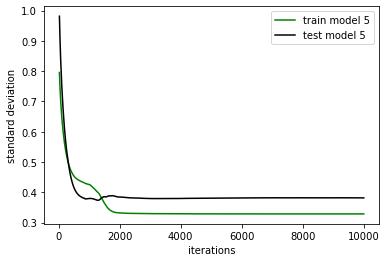

In [259]:
#plt.plot(res1b[1,:],res1b[2,:],'-',color='blue',label='train model 1b')
#plt.plot(res1b[1,:],res1b[3,:],'-',color='red',label='test model 1b')
plt.plot(res5[1,:],res5[2,:],'-',color='green',label='train model 5')
plt.plot(res5[1,:],res5[3,:],'-',color='black',label='test model 5')
plt.xlabel("iterations")
#plt.title("model 3d")
plt.ylabel("standard deviation")
plt.legend(loc="best")   
print(min(res5[2,:]))  #train 0.373 previous run, next run afdter which converged had 0.303 now 0.35, now 0.30 now 0.328 b
print(min(res5[3,:]))  #test 0.383 prevoius run , 0.376   now 0.39, now 0.40 now 0.373

Linerar regression of the had 0.34 to 0.38 as standard deviation. Thus the neural network is not clearly better. The 0.34 could be just luck on the test data since train is larger there. Still it is not improving. 

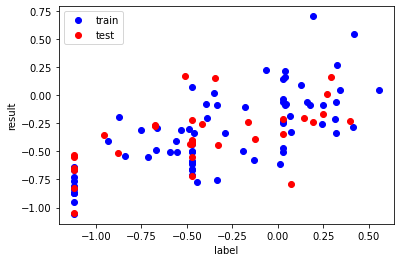

In [260]:
plt.plot(y_train,prediction5tr,'o',color='blue',label='train')
plt.plot(y_test,prediction5te,'o',color='red',label='test')
plt.xlabel("label")
plt.ylabel("result")
plt.legend(loc="best")
#seems a local minimum scatter worse than linear gression of the few features
#still too small dyncmic range in results

The best neural networks without PCA had a standard devation of about 0.28 in the test. That is  less than 0.34 to 0.38 achieved after PCA. That indicates, that the current PCA is not helping. A reason can be that the data was not well enough normalized before applying it. The neural network on the features itself probably find a better normalization in the process. 

In [262]:
#now neural network on first two of 3rd oder normalized 
model5b = Sequential(
    [              
        tf.keras.Input(shape=(2,)),   
        Dense(3, activation="relu", name="layer1"),   
        Dense(1, activation = 'linear', name="layer2")
    ], name = "model5b"
) 
model5b.summary()

Model: "model5b"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 layer1 (Dense)              (None, 3)                 9         
                                                                 
 layer2 (Dense)              (None, 1)                 4         
                                                                 
Total params: 13
Trainable params: 13
Non-trainable params: 0
_________________________________________________________________


In [266]:
model5b.compile(
    loss=tf.keras.losses.MeanSquaredError(), 
    optimizer=tf.keras.optimizers.Adam(0.001),
)

In [268]:

scaler = preprocessing.StandardScaler().fit(xselnp_train[:,0:2])
xselpn_trainscaled = scaler.transform(xselnp_train[:,0:2])
xselpn_testscaled = scaler.transform(xselnp_test[:,0:2])

trainresnp=xselpn_trainscaled[:,0:2].reshape(74,2) 
testresnp=xselpn_testscaled[:,0:2].reshape(33,2) 

res5n=np.zeros((6,500))
#tf.keras.utils.set_random_seed(1306)
for i in range(500):
    print(i)
    model5b.fit(
        xselpn_trainscaled[:,0:2],y_train,
        epochs=20,batch_size=74
        )
    prediction5tr = model5b.predict(trainresnp)
    prediction5te = model5b.predict(testresnp)
    res5[0,i]=i
    res5n[1,i]=(i+1)*20
    res5n[2,i]=np.std(y_train-prediction5tr[:,0])
    res5n[3,i]=np.std(y_test-prediction5te[:,0])
    res5n[4,i]=np.mean((y_train-prediction5tr[:,0])**2) 
    res5n[5,i]=np.mean((y_test-prediction5te[:,0])**2)  

0
Epoch 1/20
1/1 [==============================] - 0s 269ms/step - loss: 0.4344
Epoch 2/20
1/1 [==============================] - 0s 4ms/step - loss: 0.4325
Epoch 3/20
1/1 [==============================] - 0s 5ms/step - loss: 0.4307
Epoch 4/20
1/1 [==============================] - 0s 5ms/step - loss: 0.4288
Epoch 5/20
1/1 [==============================] - 0s 7ms/step - loss: 0.4270
Epoch 6/20
1/1 [==============================] - 0s 6ms/step - loss: 0.4251
Epoch 7/20
1/1 [==============================] - 0s 6ms/step - loss: 0.4233
Epoch 8/20
1/1 [==============================] - 0s 7ms/step - loss: 0.4215
Epoch 9/20
1/1 [==============================] - 0s 6ms/step - loss: 0.4197
Epoch 10/20
1/1 [==============================] - 0s 6ms/step - loss: 0.4179
Epoch 11/20
1/1 [==============================] - 0s 7ms/step - loss: 0.4161
Epoch 12/20
1/1 [==============================] - 0s 7ms/step - loss: 0.4144
Epoch 13/20
1/1 [==============================] - 0s 5ms/step - loss

Epoch 20/20
2/2 [==============================] - 0s 4ms/step
10
Epoch 1/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1995
Epoch 2/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1989
Epoch 3/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1983
Epoch 4/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1978
Epoch 5/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1972
Epoch 6/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1966
Epoch 7/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1960
Epoch 8/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1954
Epoch 9/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1949
Epoch 10/20
1/1 [==============================] - 0s 3ms/step - loss: 0.1943
Epoch 11/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1938
Epoch 12/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1932
Epoch 1

1/1 [==============================] - 0s 6ms/step - loss: 0.1546
Epoch 18/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1545
Epoch 19/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1545
Epoch 20/20
2/2 [==============================] - 0s 2ms/step
20
Epoch 1/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1545
Epoch 2/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1544
Epoch 3/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1544
Epoch 4/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1544
Epoch 5/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1544
Epoch 6/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1543
Epoch 7/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1543
Epoch 8/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1543
Epoch 9/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1543
Epoch 10/20
1/1 [==

1/1 [==============================] - 0s 5ms/step - loss: 0.1525
Epoch 17/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1524
Epoch 18/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1524
Epoch 19/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1524
Epoch 20/20
2/2 [==============================] - 0s 3ms/step
25
Epoch 1/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1523
Epoch 2/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1523
Epoch 3/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1523
Epoch 4/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1522
Epoch 5/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1522
Epoch 6/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1522
Epoch 7/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1522
Epoch 8/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1521
Epoch 9/20
1/1 [==

1/1 [==============================] - 0s 6ms/step - loss: 0.1505
Epoch 16/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1505
Epoch 17/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1505
Epoch 18/20
1/1 [==============================] - 0s 8ms/step - loss: 0.1505
Epoch 19/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1505
Epoch 20/20
2/2 [==============================] - 0s 2ms/step
30
Epoch 1/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1504
Epoch 2/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1504
Epoch 3/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1504
Epoch 4/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1504
Epoch 5/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1504
Epoch 6/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1504
Epoch 7/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1503
Epoch 8/20
1/1 [=

1/1 [==============================] - 0s 5ms/step - loss: 0.1491
Epoch 15/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1491
Epoch 16/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1490
Epoch 17/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1490
Epoch 18/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1490
Epoch 19/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1490
Epoch 20/20
2/2 [==============================] - 0s 3ms/step
35
Epoch 1/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1490
Epoch 2/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1490
Epoch 3/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1489
Epoch 4/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1489
Epoch 5/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1489
Epoch 6/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1489
Epoch 7/20
1/1 [

1/1 [==============================] - 0s 5ms/step - loss: 0.1476
Epoch 14/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1475
Epoch 15/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1475
Epoch 16/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1475
Epoch 17/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1475
Epoch 18/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1474
Epoch 19/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1474
Epoch 20/20
2/2 [==============================] - 0s 3ms/step
40
Epoch 1/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1474
Epoch 2/20
1/1 [==============================] - 0s 3ms/step - loss: 0.1473
Epoch 3/20
1/1 [==============================] - 0s 3ms/step - loss: 0.1473
Epoch 4/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1473
Epoch 5/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1473
Epoch 6/20
1/1 

1/1 [==============================] - 0s 4ms/step - loss: 0.1452
Epoch 13/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1452
Epoch 14/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1451
Epoch 15/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1451
Epoch 16/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1451
Epoch 17/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1451
Epoch 18/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1450
Epoch 19/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1450
Epoch 20/20
2/2 [==============================] - 0s 3ms/step
45
Epoch 1/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1449
Epoch 2/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1449
Epoch 3/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1449
Epoch 4/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1448
Epoch 5/20
1/1

1/1 [==============================] - 0s 6ms/step - loss: 0.1414
Epoch 12/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1414
Epoch 13/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1413
Epoch 14/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1413
Epoch 15/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1413
Epoch 16/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1412
Epoch 17/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1412
Epoch 18/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1412
Epoch 19/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1411
Epoch 20/20
2/2 [==============================] - 0s 4ms/step
50
Epoch 1/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1410
Epoch 2/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1410
Epoch 3/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1410
Epoch 4/20
1/

1/1 [==============================] - 0s 5ms/step - loss: 0.1381
Epoch 11/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1380
Epoch 12/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1380
Epoch 13/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1380
Epoch 14/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1379
Epoch 15/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1379
Epoch 16/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1379
Epoch 17/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1379
Epoch 18/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1378
Epoch 19/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1378
Epoch 20/20
2/2 [==============================] - 0s 3ms/step
55
Epoch 1/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1378
Epoch 2/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1377
Epoch 3/20
1

1/1 [==============================] - 0s 6ms/step - loss: 0.1358
Epoch 10/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1358
Epoch 11/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1357
Epoch 12/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1357
Epoch 13/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1357
Epoch 14/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1357
Epoch 15/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1357
Epoch 16/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1356
Epoch 17/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1356
Epoch 18/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1356
Epoch 19/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1356
Epoch 20/20
2/2 [==============================] - 0s 4ms/step
60
Epoch 1/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1355
Epoch 2/20


1/1 [==============================] - 0s 5ms/step - loss: 0.1340
Epoch 9/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1340
Epoch 10/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1340
Epoch 11/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1340
Epoch 12/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1339
Epoch 13/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1339
Epoch 14/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1339
Epoch 15/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1339
Epoch 16/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1339
Epoch 17/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1339
Epoch 18/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1339
Epoch 19/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1338
Epoch 20/20
2/2 [==============================] - 0s 2ms/step
65
Epoch 1/20


1/1 [==============================] - 0s 4ms/step - loss: 0.1326
Epoch 8/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1326
Epoch 9/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1326
Epoch 10/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1326
Epoch 11/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1326
Epoch 12/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1325
Epoch 13/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1325
Epoch 14/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1325
Epoch 15/20
1/1 [==============================] - 0s 8ms/step - loss: 0.1325
Epoch 16/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1325
Epoch 17/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1325
Epoch 18/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1325
Epoch 19/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1325


1/1 [==============================] - 0s 6ms/step - loss: 0.1315
Epoch 7/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1315
Epoch 8/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1314
Epoch 9/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1314
Epoch 10/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1314
Epoch 11/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1314
Epoch 12/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1314
Epoch 13/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1314
Epoch 14/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1314
Epoch 15/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1314
Epoch 16/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1314
Epoch 17/20
1/1 [==============================] - 0s 3ms/step - loss: 0.1314
Epoch 18/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1314
E

1/1 [==============================] - 0s 5ms/step - loss: 0.1306
Epoch 6/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1305
Epoch 7/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1305
Epoch 8/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1305
Epoch 9/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1305
Epoch 10/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1305
Epoch 11/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1305
Epoch 12/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1305
Epoch 13/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1305
Epoch 14/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1305
Epoch 15/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1305
Epoch 16/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1305
Epoch 17/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1305
Ep

1/1 [==============================] - 0s 5ms/step - loss: 0.1298
Epoch 5/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1298
Epoch 6/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1298
Epoch 7/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1298
Epoch 8/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1298
Epoch 9/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1298
Epoch 10/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1298
Epoch 11/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1298
Epoch 12/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1298
Epoch 13/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1298
Epoch 14/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1298
Epoch 15/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1298
Epoch 16/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1297
Epo

1/1 [==============================] - 0s 6ms/step - loss: 0.1292
Epoch 4/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1292
Epoch 5/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1292
Epoch 6/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1292
Epoch 7/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1292
Epoch 8/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1292
Epoch 9/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1292
Epoch 10/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1292
Epoch 11/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1292
Epoch 12/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1292
Epoch 13/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1292
Epoch 14/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1292
Epoch 15/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1292
Epoc

1/1 [==============================] - 0s 6ms/step - loss: 0.1288
Epoch 3/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1288
Epoch 4/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1288
Epoch 5/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1288
Epoch 6/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1288
Epoch 7/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1288
Epoch 8/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1288
Epoch 9/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1288
Epoch 10/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1288
Epoch 11/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1288
Epoch 12/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1288
Epoch 13/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1288
Epoch 14/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1288
Epoch

Epoch 1/20
1/1 [==============================] - 0s 9ms/step - loss: 0.1285
Epoch 2/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1285
Epoch 3/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1285
Epoch 4/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1285
Epoch 5/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1285
Epoch 6/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1285
Epoch 7/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1285
Epoch 8/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1285
Epoch 9/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1284
Epoch 10/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1284
Epoch 11/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1284
Epoch 12/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1284
Epoch 13/20
1/1 [==============================] - 0s 7ms/step - loss: 0.

1/1 [==============================] - 0s 6ms/step - loss: 0.1280
Epoch 20/20
2/2 [==============================] - 0s 3ms/step
109
Epoch 1/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1280
Epoch 2/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1280
Epoch 3/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1280
Epoch 4/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1280
Epoch 5/20
1/1 [==============================] - 0s 10ms/step - loss: 0.1279
Epoch 6/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1279
Epoch 7/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1279
Epoch 8/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1279
Epoch 9/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1279
Epoch 10/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1279
Epoch 11/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1279
Epoch 12/20
1/1 [

Epoch 18/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1275
Epoch 19/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1275
Epoch 20/20
2/2 [==============================] - 0s 5ms/step
114
Epoch 1/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1275
Epoch 2/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1275
Epoch 3/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1275
Epoch 4/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1275
Epoch 5/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1275
Epoch 6/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1275
Epoch 7/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1275
Epoch 8/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1275
Epoch 9/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1274
Epoch 10/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1274
Epoch 

Epoch 15/20
1/1 [==============================] - 0s 8ms/step - loss: 0.1272
Epoch 16/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1272
Epoch 17/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1272
Epoch 18/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1272
Epoch 19/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1272
Epoch 20/20
2/2 [==============================] - 0s 3ms/step
124
Epoch 1/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1272
Epoch 2/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1272
Epoch 3/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1272
Epoch 4/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1271
Epoch 5/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1271
Epoch 6/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1271
Epoch 7/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1271
Epoc

Epoch 12/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1270
Epoch 13/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1270
Epoch 14/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1270
Epoch 15/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1270
Epoch 16/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1270
Epoch 17/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1270
Epoch 18/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1270
Epoch 19/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1270
Epoch 20/20
2/2 [==============================] - 0s 2ms/step
134
Epoch 1/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1270
Epoch 2/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1270
Epoch 3/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1270
Epoch 4/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1270
E

Epoch 9/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1269
Epoch 10/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1269
Epoch 11/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1269
Epoch 12/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1269
Epoch 13/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1269
Epoch 14/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1269
Epoch 15/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1269
Epoch 16/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1269
Epoch 17/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1269
Epoch 18/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1269
Epoch 19/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1269
Epoch 20/20
2/2 [==============================] - 0s 3ms/step
144
Epoch 1/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1269

1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 6/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 7/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 8/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1268
Epoch 9/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 10/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 11/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 12/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 13/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 14/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 15/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 16/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 17/20
1/1 [==============================] - 0s 3ms/step - loss: 0.1268
Ep

1/1 [==============================] - 0s 9ms/step - loss: 0.1268
Epoch 2/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 3/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 4/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 5/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 6/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 7/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 8/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 9/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 10/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 11/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1268
Epoch 12/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 13/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 

1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 20/20
2/2 [==============================] - 0s 4ms/step
173
Epoch 1/20
1/1 [==============================] - 0s 8ms/step - loss: 0.1268
Epoch 2/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 3/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 4/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1268
Epoch 5/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 6/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 7/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 8/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 9/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 10/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 11/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1268
Epoch 12/20
1/1 [=

Epoch 18/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 19/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 20/20
2/2 [==============================] - 0s 3ms/step
178
Epoch 1/20
1/1 [==============================] - 0s 8ms/step - loss: 0.1268
Epoch 2/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 3/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 4/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 5/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 6/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 7/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 8/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 9/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 10/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 

Epoch 15/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 16/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 17/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 18/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 19/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 20/20
2/2 [==============================] - 0s 2ms/step
188
Epoch 1/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 2/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 3/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 4/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1268
Epoch 5/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 6/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 7/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoc

Epoch 12/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 13/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 14/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 15/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 16/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 17/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 18/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1268
Epoch 19/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 20/20
2/2 [==============================] - 0s 3ms/step
198
Epoch 1/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 2/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1268
Epoch 3/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 4/20
1/1 [==============================] - 0s 8ms/step - loss: 0.1268
E

1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 9/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 10/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 11/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1268
Epoch 12/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 13/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 14/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 15/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 16/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 17/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 18/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 19/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1268
Epoch 20/20
2/2 [==============================] - 0s 2ms/step
208
Epoch 1/20

Epoch 7/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 8/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 9/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 10/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 11/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 12/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 13/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 14/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 15/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 16/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 17/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 18/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 19/20
1/1 [==============================] - 0s 4ms/step - lo

Epoch 4/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 5/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 6/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 7/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1268
Epoch 8/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 9/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 10/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 11/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 12/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 13/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 14/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 15/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 16/20
1/1 [==============================] - 0s 5ms/step - loss:

232
Epoch 1/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 2/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 3/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 4/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 5/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 6/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 7/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 8/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 9/20
1/1 [==============================] - 0s 3ms/step - loss: 0.1268
Epoch 10/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 11/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 12/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 13/20
1/1 [==============================] - 0s 5ms/step - loss

1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 20/20
2/2 [==============================] - 0s 4ms/step
242
Epoch 1/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 2/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 3/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 4/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 5/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 6/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1268
Epoch 7/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 8/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 9/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 10/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 11/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1268
Epoch 12/20
1/1 [=

Epoch 18/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 19/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 20/20
2/2 [==============================] - 0s 2ms/step
247
Epoch 1/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 2/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 3/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 4/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 5/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 6/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 7/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 8/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 9/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 10/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 

Epoch 15/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 16/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 17/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 18/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 19/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 20/20
2/2 [==============================] - 0s 2ms/step
257
Epoch 1/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 2/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 3/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 4/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 5/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 6/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 7/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoc

Epoch 12/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 13/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 14/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 15/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 16/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1268
Epoch 17/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 18/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 19/20
1/1 [==============================] - 0s 3ms/step - loss: 0.1268
Epoch 20/20
2/2 [==============================] - 0s 2ms/step
267
Epoch 1/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 2/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 3/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 4/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
E

Epoch 9/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 10/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 11/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 12/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 13/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 14/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1268
Epoch 15/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 16/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 17/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 18/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 19/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 20/20
2/2 [==============================] - 0s 2ms/step
277
Epoch 1/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268

Epoch 6/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 7/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 8/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 9/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 10/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 11/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 12/20
1/1 [==============================] - 0s 8ms/step - loss: 0.1268
Epoch 13/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 14/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 15/20
1/1 [==============================] - 0s 8ms/step - loss: 0.1268
Epoch 16/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 17/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1268
Epoch 18/20
1/1 [==============================] - 0s 5ms/step - los

Epoch 3/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 4/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 5/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 6/20
1/1 [==============================] - 0s 8ms/step - loss: 0.1268
Epoch 7/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 8/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 9/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 10/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 11/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 12/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 13/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 14/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 15/20
1/1 [==============================] - 0s 4ms/step - loss: 

2/2 [==============================] - 0s 3ms/step
306
Epoch 1/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 2/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 3/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 4/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 5/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 6/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1268
Epoch 7/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 8/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 9/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 10/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1268
Epoch 11/20
1/1 [==============================] - 0s 8ms/step - loss: 0.1268
Epoch 12/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 13/20
1/1 [=

Epoch 18/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 19/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 20/20
2/2 [==============================] - 0s 4ms/step
316
Epoch 1/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 2/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 3/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1268
Epoch 4/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 5/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 6/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 7/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 8/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 9/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 10/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 

Epoch 15/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 16/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 17/20
1/1 [==============================] - 0s 3ms/step - loss: 0.1268
Epoch 18/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 19/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 20/20
2/2 [==============================] - 0s 2ms/step
326
Epoch 1/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 2/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 3/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 4/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 5/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 6/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 7/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoc

Epoch 12/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 13/20
1/1 [==============================] - 0s 3ms/step - loss: 0.1268
Epoch 14/20
1/1 [==============================] - 0s 12ms/step - loss: 0.1268
Epoch 15/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 16/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 17/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 18/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 19/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 20/20
2/2 [==============================] - 0s 2ms/step
336
Epoch 1/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 2/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 3/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 4/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268


Epoch 9/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 10/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 11/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 12/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 13/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 14/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 15/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 16/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 17/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 18/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 19/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 20/20
2/2 [==============================] - 0s 2ms/step
346
Epoch 1/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268

Epoch 6/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 7/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 8/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 9/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 10/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 11/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 12/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 13/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 14/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 15/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 16/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 17/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 18/20
1/1 [==============================] - 0s 5ms/step - los

Epoch 3/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 4/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 5/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 6/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 7/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 8/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 9/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 10/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 11/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 12/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 13/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 14/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 15/20
1/1 [==============================] - 0s 5ms/step - loss: 

2/2 [==============================] - 0s 2ms/step
375
Epoch 1/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 2/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 3/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 4/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 5/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 6/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 7/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 8/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 9/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 10/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 11/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 12/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 13/20
1/1 [=

Epoch 18/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 19/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 20/20
2/2 [==============================] - 0s 2ms/step
385
Epoch 1/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 2/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 3/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 4/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 5/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 6/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 7/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 8/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 9/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 10/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 

Epoch 15/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1268
Epoch 16/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 17/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 18/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 19/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 20/20
2/2 [==============================] - 0s 2ms/step
395
Epoch 1/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 2/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 3/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 4/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 5/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 6/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 7/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoc

Epoch 12/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 13/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 14/20
1/1 [==============================] - 0s 3ms/step - loss: 0.1268
Epoch 15/20
1/1 [==============================] - 0s 3ms/step - loss: 0.1268
Epoch 16/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 17/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 18/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 19/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 20/20
2/2 [==============================] - 0s 3ms/step
405
Epoch 1/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 2/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 3/20
1/1 [==============================] - 0s 3ms/step - loss: 0.1268
Epoch 4/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
E

Epoch 9/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 10/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 11/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 12/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 13/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 14/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 15/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 16/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 17/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 18/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 19/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 20/20
2/2 [==============================] - 0s 4ms/step
415
Epoch 1/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268

Epoch 6/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 7/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 8/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 9/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 10/20
1/1 [==============================] - 0s 3ms/step - loss: 0.1268
Epoch 11/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 12/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 13/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 14/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 15/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 16/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 17/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 18/20
1/1 [==============================] - 0s 4ms/step - los

Epoch 3/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 4/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 5/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 6/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 7/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 8/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 9/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 10/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 11/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 12/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 13/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 14/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 15/20
1/1 [==============================] - 0s 6ms/step - loss: 

2/2 [==============================] - 0s 3ms/step
444
Epoch 1/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 2/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 3/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 4/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 5/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 6/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 7/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 8/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 9/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 10/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 11/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 12/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 13/20
1/1 [=

Epoch 18/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 19/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 20/20
2/2 [==============================] - 0s 2ms/step
454
Epoch 1/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 2/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 3/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 4/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 5/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 6/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 7/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 8/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 9/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 10/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 

Epoch 15/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 16/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 17/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 18/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 19/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 20/20
2/2 [==============================] - 0s 2ms/step
464
Epoch 1/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 2/20
1/1 [==============================] - 0s 7ms/step - loss: 0.1268
Epoch 3/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 4/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 5/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 6/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 7/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoc

Epoch 12/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 13/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 14/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 15/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 16/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 17/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 18/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 19/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 20/20
2/2 [==============================] - 0s 3ms/step
474
Epoch 1/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 2/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 3/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 4/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
E

Epoch 9/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 10/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 11/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 12/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 13/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 14/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 15/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 16/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 17/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 18/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 19/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 20/20
2/2 [==============================] - 0s 2ms/step
484
Epoch 1/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268

Epoch 6/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 7/20
1/1 [==============================] - 0s 3ms/step - loss: 0.1268
Epoch 8/20
1/1 [==============================] - 0s 4ms/step - loss: 0.1268
Epoch 9/20
1/1 [==============================] - 0s 8ms/step - loss: 0.1268
Epoch 10/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 11/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 12/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 13/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 14/20
1/1 [==============================] - 0s 6ms/step - loss: 0.1268
Epoch 15/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 16/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 17/20
1/1 [==============================] - 0s 5ms/step - loss: 0.1268
Epoch 18/20
1/1 [==============================] - 0s 5ms/step - los

minimal standard deviation train linear normalization 0.329
minimal standard deviation test linear normalization 0.374
minimal standard deviation train 3rd order normalization 0.356
minimal standard deviation test 3rd oder normalization 0.402


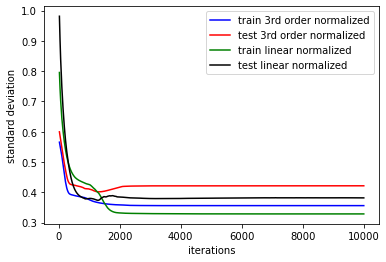

In [269]:
plt.plot(res5n[1,:],res5n[2,:],'-',color='blue',label='train 3rd order normalized')
plt.plot(res5n[1,:],res5n[3,:],'-',color='red',label='test 3rd order normalized')
plt.plot(res5[1,:],res5[2,:],'-',color='green',label='train linear normalized')
plt.plot(res5[1,:],res5[3,:],'-',color='black',label='test linear normalized')
plt.xlabel("iterations")
#plt.title("model 3d")
plt.ylabel("standard deviation")
plt.legend(loc="best")   
print(f"minimal standard deviation train linear normalization {round(min(res5[2,:]),3)}")  
print(f"minimal standard deviation test linear normalization {round(min(res5[3,:]),3)}")  
print(f"minimal standard deviation train 3rd order normalization {round(min(res5n[2,:]),3)}")  
print(f"minimal standard deviation test 3rd oder normalization {round(min(res5n[3,:]),3)}")  

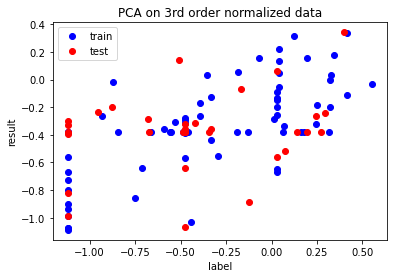

In [57]:
plt.plot(y_train,prediction5tr,'o',color='blue',label='train')
plt.plot(y_test,prediction5te,'o',color='red',label='test')
plt.xlabel("label")
plt.ylabel("result")
plt.title("PCA on 3rd order normalized data")
plt.legend(loc="best")

Neural networks on PCA features after third order normalization seem to perform worse than after linear. The thord order uses only two but it seems unlikely that the next are better. Anyway the difffernce is not large and it is clearly worse than models on original data which can be as good as 0.28. 


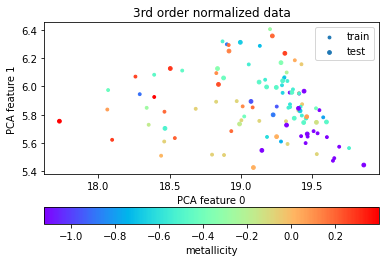

In [271]:
plt.scatter(xselnp_train[:,0], xselnp_train[:,1],c=y_train,s=8,cmap="rainbow",label='train')  #size does not get smaller below it 
plt.scatter(xselnp_test[:,0], xselnp_test[:,1],c=y_test,s=14,cmap="rainbow",label='test')
plt.colorbar(label="metallicity", orientation="horizontal")
plt.ylabel("PCA feature 1")
plt.xlabel("PCA feature 0")
plt.title("3rd order normalized data")
#plt.xlim(0,3)
#plt.ylim(12.0,-1.0)
plt.legend(loc="best")
#seems wrong that they are not around 0 something went wrong 

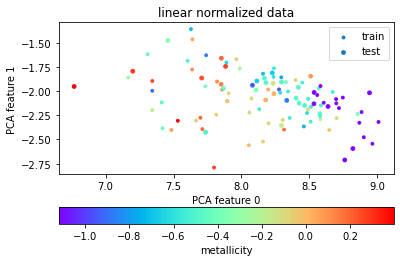

In [272]:
plt.scatter(xselp_train[:,0], xselp_train[:,1],c=y_train,s=8,cmap="rainbow",label='train')  #size does not get smaller below it 
plt.scatter(xselp_test[:,0], xselp_test[:,1],c=y_test,s=14,cmap="rainbow",label='test')
plt.colorbar(label="metallicity", orientation="horizontal")
plt.ylabel("PCA feature 1")
plt.xlabel("PCA feature 0")
plt.title("linear normalized data")
#plt.xlim(0,3)
#plt.ylim(12.0,-1.0)
plt.legend(loc="best")
#seems wrong that they are not around 0 also here, structure seems better than in 3rd order normalized

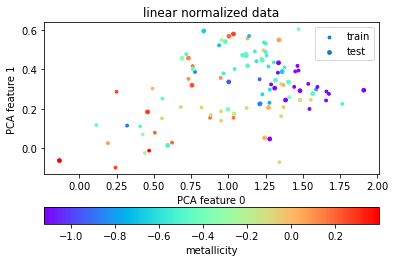

In [273]:
#now using pca function2
plt.scatter(cal1p_train[:,0], cal1p_train[:,1],c=y_train,s=8,cmap="rainbow",label='train')  #size does not get smaller below it 
plt.scatter(cal1p_test[:,0], cal1p_test[:,1],c=y_test,s=14,cmap="rainbow",label='test')
plt.colorbar(label="metallicity", orientation="horizontal")
plt.ylabel("PCA feature 1")
plt.xlabel("PCA feature 0")
plt.title("linear normalized data")
#plt.xlim(0,3)
#plt.ylim(12.0,-1.0)
plt.legend(loc="best")

difference between differenet pay of applying PCA transforms
[-17.84885098 -17.84034544 -17.83868188 -17.82475865 -17.83445578
 -17.83694785 -17.8348858  -17.83514803 -17.85861704 -17.82792016
 -17.8368914  -17.83455286 -17.83586293 -17.84352126 -17.84096953
 -17.83831044 -17.8359563  -17.84291417 -17.83998087 -17.83727622
 -17.83476126 -17.83520694 -17.84338354 -17.84116396 -17.83566615
 -17.82768396 -17.84413681 -17.84929073 -17.82807804 -17.83806981
 -17.84039708 -17.83957017 -17.82997388 -17.82247079 -17.83861815
 -17.83053218 -17.83801981 -17.84074798 -17.82746761 -17.838807
 -17.83669063 -17.83698938 -17.83123944 -17.82666022 -17.83542181
 -17.83749124 -17.84087325 -17.83348114 -17.83807301 -17.83155243
 -17.83599813 -17.83847006 -17.84049841 -17.83816977 -17.83453213
 -17.82975126 -17.84199468 -17.83607182 -17.83281876 -17.83692434
 -17.84084126 -17.84075229 -17.84403897 -17.83111934 -17.83797383
 -17.84009127 -17.84061683 -17.83203214 -17.83187026 -17.83561294
 -17.83911494 -17

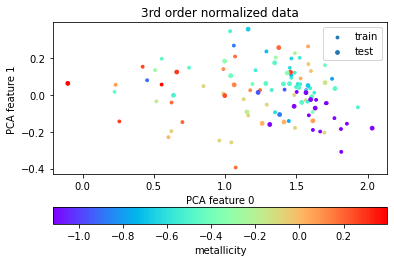

In [276]:
#now using pca function2
plt.scatter(cal3p_train[:,0], cal3p_train[:,1],c=y_train,s=8,cmap="rainbow",label='train')  #size does not get smaller below it 
plt.scatter(cal3p_test[:,0], cal3p_test[:,1],c=y_test,s=14,cmap="rainbow",label='test')
plt.colorbar(label="metallicity", orientation="horizontal")
plt.ylabel("PCA feature 1")
plt.xlabel("PCA feature 0")
plt.title("3rd order normalized data")
#plt.xlim(0,3)
#plt.ylim(12.0,-1.0)
plt.legend(loc="best")
#different values, but really different? mostly offset maybe some rounding effects
print("difference between differenet pay of applying PCA transforms")
print(cal3p_train[:,0]-xselnp_train[:,0])
print(cal3p_train[:,1]-xselnp_train[:,1])

There is some pattern between PCA features and metallicity but not very strong one. Thus, it can be understand that the 
neural network doe snot find a really good relation ship. The different kind of PCA transforms mainly result into different mean value, but the offste from eahc other is very similar. 

Now we apply linear regression on original features. 

In [140]:
#linear regression on original features
regr =LinearRegression()
regr.fit(xsel_train,y_train)
print("Intercept:", regr.intercept_)
pred_test_lin2 = regr.predict(xsel_test)
pred_train_lin2 = regr.predict(xsel_train)
print("Mean squared error of train: %.3f" % mean_squared_error(y_train,pred_train_lin2))
print("Mean squared error of test: %.3f" % mean_squared_error(y_test,pred_test_lin2))
print(f"standard deviation of train: {round(np.std(y_train-pred_train_lin2),3)}")    
print(f"standard deviation of test: {round(np.std(y_test-pred_test_lin2),3)}")   

Intercept: 16.639880787503518
Mean squared error of train: 0.000
Mean squared error of test: 0.133
standard deviation of train: 0.0
standard deviation of test: 0.365


Intercept: 1.8914390345555905
Mean squared error of train: 0.000
Mean squared error of test: 0.147
standard deviation of train: 0.0
standard deviation of test: 0.382


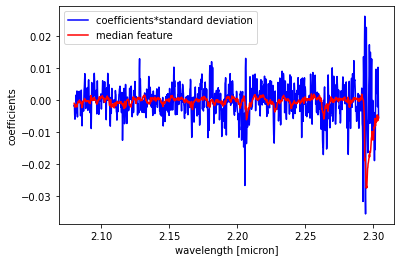

In [141]:
#now with better normalization 
regr =LinearRegression()
regr.fit(xseln_train,y_train)
print("Intercept:", regr.intercept_)
pred_test_lin2 = regr.predict(xseln_test)
pred_train_lin2 = regr.predict(xseln_train)
print("Mean squared error of train: %.3f" % mean_squared_error(y_train,pred_train_lin2))
print("Mean squared error of test: %.3f" % mean_squared_error(y_test,pred_test_lin2))
print(f"standard deviation of train: {round(np.std(y_train-pred_train_lin2),3)}")    
print(f"standard deviation of test: {round(np.std(y_test-pred_test_lin2),3)}")   
#is actually slightly worse, but anyway over fit 
plt.plot(ressel[3],regr.coef_*resn2[5],'-',color='blue',label='coefficients*standard deviation')
plt.plot(ressel[3],(resn2[4]-1)/10,'-',color='red',label='median feature')
plt.xlabel("wavelength [micron]")
plt.ylabel("coefficients")
plt.legend(loc="best")

Without reguulariation linear regression clearly overfits the data. The test standard deviation is worse than the best neural networks on the original data. 
The coefficents obtained only correlate weakly with spectral features. 


In [142]:
#now with regularization
#linear_model.Lasso(alpha=0.1)
resl=np.zeros((5,12))
resl[0,0]=0.2
resl[0,1]=0.1
resl[0,2]=0.05
resl[0,3]=0.02
resl[0,4]=0.01
resl[0,5]=0.005
resl[0,6]=0.0035
resl[0,7]=0.003
resl[0,8]=0.002
resl[0,9]=0.001
resl[0,10]=0.0005
resl[0,11]=0.0002
for i in range(np.shape(resl)[1]):
    regr =Lasso(alpha=resl[0,i])
    regr.fit(xsel_train,y_train)
    print("Intercept:", regr.intercept_)
    pred_test_lin2b = regr.predict(xsel_test)
    pred_train_lin2b = regr.predict(xsel_train)
    resl[3,i]=mean_squared_error(y_train,pred_train_lin2b)
    resl[4,i]=mean_squared_error(y_test,pred_test_lin2b)
    resl[1,i]=np.std(y_train-pred_train_lin2b)
    resl[2,i]=np.std(y_test-pred_test_lin2b)

Intercept: -0.3409413783783784
Intercept: -0.3409413783783784
Intercept: -0.3409413783783784
Intercept: 0.4717575370338593
Intercept: 1.3807221761167379
Intercept: 3.078341348071642
Intercept: 4.74311228850374
Intercept: 5.2897271786053
Intercept: 6.616396972965427
Intercept: 10.507747495422858
Intercept: 17.422908810829902
Intercept: 18.613075980868285


In [143]:
resl2=np.zeros((5,15))
resl2[0,0]=0.2
resl2[0,1]=0.1
resl2[0,2]=0.05
resl2[0,3]=0.02
resl2[0,4]=0.01
resl2[0,5]=0.005
resl2[0,6]=0.0035
resl2[0,7]=0.003
resl2[0,8]=0.002
resl2[0,9]=0.001
resl2[0,10]=0.0005
resl2[0,11]=0.0002
resl2[0,12]=0.0001
resl2[0,13]=0.00005
resl2[0,14]=0.00002
for i in range(np.shape(resl2)[1]):
    regr =Lasso(alpha=resl2[0,i],max_iter=4000)
    regr.fit(xseln_train,y_train)
    print("Intercept:", regr.intercept_)
    pred_test_lin2b = regr.predict(xseln_test)
    pred_train_lin2b = regr.predict(xseln_train)
    resl2[3,i]=mean_squared_error(y_train,pred_train_lin2b)
    resl2[4,i]=mean_squared_error(y_test,pred_test_lin2b)
    resl2[1,i]=np.std(y_train-pred_train_lin2b)
    resl2[2,i]=np.std(y_test-pred_test_lin2b)

Intercept: -0.3409413783783784
Intercept: -0.3409413783783784
Intercept: -0.3409413783783784
Intercept: 0.4181127553603508
Intercept: 1.458836561447995
Intercept: 3.5219602348095513
Intercept: 4.842322414533532
Intercept: 4.653478758700624
Intercept: 4.362750028484184
Intercept: 4.287473554426391
Intercept: 0.18288766477124735
Intercept: 0.1267465621718306
Intercept: -0.8267407878897872
Intercept: -3.362328214620751
Intercept: -4.914197370655207


[[2.00000000e-01 4.81532280e-01 4.67199590e-01]
 [1.00000000e-01 4.81532280e-01 4.67199590e-01]
 [5.00000000e-02 4.81532280e-01 4.67199590e-01]
 [2.00000000e-02 4.25586548e-01 3.96992096e-01]
 [1.00000000e-02 3.75695033e-01 3.28837468e-01]
 [5.00000000e-03 3.34725491e-01 2.92306705e-01]
 [3.50000000e-03 3.03686892e-01 2.90903527e-01]
 [3.00000000e-03 2.84245638e-01 2.93595545e-01]
 [2.00000000e-03 2.41770728e-01 2.86850468e-01]
 [1.00000000e-03 1.75690623e-01 2.80936976e-01]
 [5.00000000e-04 1.07184497e-01 2.87127565e-01]
 [2.00000000e-04 4.86452181e-02 3.56158266e-01]]


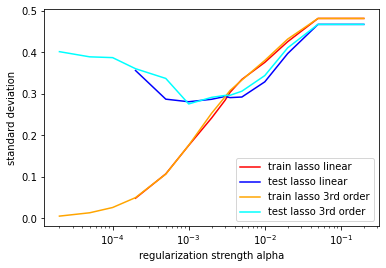

In [144]:
plt.plot(resl[0,:],resl[1,:],'-',color='red',label='train lasso linear')
plt.plot(resl[0,:],resl[2,:],'-',color='blue',label='test lasso linear')
plt.plot(resl2[0,:],resl2[1,:],'-',color='orange',label='train lasso 3rd order')
plt.plot(resl2[0,:],resl2[2,:],'-',color='cyan',label='test lasso 3rd order')
plt.xlabel("regularization strength alpha")
#plt.title("model 3d")
plt.xscale("log")
plt.ylabel("standard deviation")
plt.legend(loc="best")
print(resl[0:3,:].T)
#very similar the two normalizations

Regularization is needed when the full data set is used for linear regression. A parameter of about 0.0035 seems best for lasso.

In [145]:
regr =Lasso(alpha=0.0035)
regr.fit(xsel_train,y_train)
pred_test_lin2 = regr.predict(xsel_test)
pred_train_lin2 = regr.predict(xsel_train)
#using all data
regr2 =Lasso(alpha=0.0035)
regr2.fit(xsel.T,tar2[1])
pred_test_lin3 = regr2.predict(xsel_test)
pred_train_lin3 = regr2.predict(xsel_train)

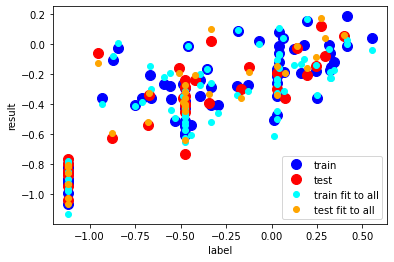

In [146]:
plt.plot(y_train,pred_train_lin2,'o',color='blue',ms=10,label='train')
plt.plot(y_test,pred_test_lin2,'o',color='red',ms=10,label='test')
plt.plot(y_train,pred_train_lin3,'o',color='cyan',label='train fit to all')
plt.plot(y_test,pred_test_lin3,'o',color='orange',label='test fit to all')
plt.xlabel("label")
plt.ylabel("result")
plt.legend(loc="best")

There is a clear relation. Adding the test data to the fit does not change the result the lot. The best standard deviation 0.28 is the same  as of the best neural networks. Overall there are clear imperfections like between the groups (clusters) at -1.1 and 0.47. 
Below we plot the coefficients.

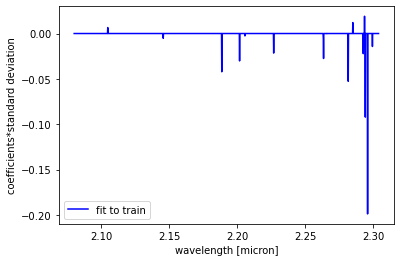

In [147]:
plt.plot(ressel[3],regr.coef_*resn2[5],'-',color='blue',label='fit to train')
plt.xlabel("wavelength [micron]")
plt.ylabel("coefficients*standard deviation")
plt.legend(loc="best")

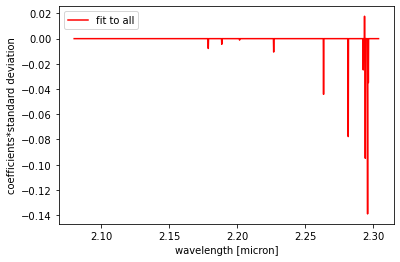

In [148]:
plt.plot(ressel[3],regr2.coef_*resn2[5],'-',color='red',label='fit to all')
plt.xlabel("wavelength [micron]")
plt.ylabel("coefficients*standard deviation")
plt.legend(loc="best")

Most are negative as it should be. 
There are clear differences in them, depsite that the results are not very different. There are not many values which non zero.

Now fitting the better normalized data. 

In [149]:
regr3 =Lasso(alpha=0.0035)
regr3.fit(xseln_train,y_train)
pred_test_lin2 = regr3.predict(xseln_test)
pred_train_lin2 = regr3.predict(xseln_train)
#using all data
regr4 =Lasso(alpha=0.0035)
regr4.fit(xseln.T,tar2[1])
pred_test_third3 = regr4.predict(xseln_test)
pred_train_third3 = regr4.predict(xseln_train)

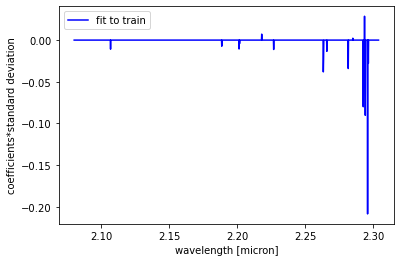

In [150]:
plt.plot(ressel[3],regr3.coef_*resn2[5],'-',color='blue',label='fit to train')
plt.xlabel("wavelength [micron]")
plt.ylabel("coefficients*standard deviation")
plt.legend(loc="best")

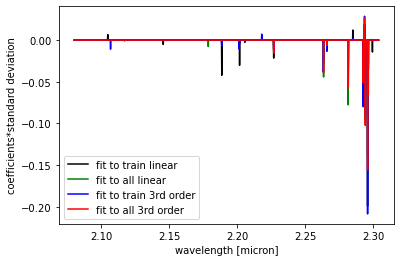

In [151]:
plt.plot(ressel[3],regr.coef_*resn2[5],'-',color='black',label='fit to train linear')
plt.plot(ressel[3],regr2.coef_*resn2[5],'-',color='green',label='fit to all linear')
plt.plot(ressel[3],regr3.coef_*resn2[5],'-',color='blue',label='fit to train 3rd order')
plt.plot(ressel[3],regr4.coef_*resn2[5],'-',color='red',label='fit to all 3rd order')
plt.xlabel("wavelength [micron]")
plt.ylabel("coefficients*standard deviation")
plt.legend(loc="best")

Now even more variation now with different data in which features are used. Clearly most connection is found with the strong CO feature. While there is connection in the training data on it, in practice it is knwon that using mainly it is not so best approach. 

In [152]:
#now using the some features combined data
regr =LinearRegression()
regr.fit(xseln9_train,y_train)
print("Intercept:", regr.intercept_)
pred_test_lin2 = regr.predict(xseln9_test)
pred_train_lin2 = regr.predict(xseln9_train)
print("Mean squared error of train: %.3f" % mean_squared_error(y_train,pred_train_lin2))
print("Mean squared error of test: %.3f" % mean_squared_error(y_test,pred_test_lin2))
print(f"standard deviation of train: {round(np.std(y_train-pred_train_lin2),3)}")    
print(f"standard deviation of test: {round(np.std(y_test-pred_test_lin2),3)}")   

Intercept: 7.464500872541412
Mean squared error of train: 0.000
Mean squared error of test: 0.262
standard deviation of train: 0.0
standard deviation of test: 0.499


In [153]:
resl3=np.zeros((5,15))
resl3[0,0]=0.2
resl3[0,1]=0.1
resl3[0,2]=0.05
resl3[0,3]=0.02
resl3[0,4]=0.01
resl3[0,5]=0.005
resl3[0,6]=0.0035
resl3[0,7]=0.003
resl3[0,8]=0.002
resl3[0,9]=0.001
resl3[0,10]=0.0005
resl3[0,11]=0.0002
resl3[0,12]=0.0001
resl3[0,13]=0.00005
resl3[0,14]=0.00002
for i in range(np.shape(resl3)[1]):
    regr =Lasso(alpha=resl3[0,i],max_iter=2000)
    regr.fit(xseln9_train,y_train)
    print("Intercept:", regr.intercept_)
    pred_test_lin2b = regr.predict(xseln9_test)
    pred_train_lin2b = regr.predict(xseln9_train)
    resl3[3,i]=mean_squared_error(y_train,pred_train_lin2b)
    resl3[4,i]=mean_squared_error(y_test,pred_test_lin2b)
    resl3[1,i]=np.std(y_train-pred_train_lin2b)
    resl3[2,i]=np.std(y_test-pred_test_lin2b)

Intercept: -0.3409413783783784
Intercept: -0.3409413783783784
Intercept: -0.3409413783783784
Intercept: -0.13360076113450875
Intercept: 1.289058048803728
Intercept: 2.000395931639228
Intercept: 2.615329900170854
Intercept: 2.8997799650250675
Intercept: 5.707450602046504
Intercept: 9.201677176116641
Intercept: 10.478991260634695
Intercept: 1.1307865604746
Intercept: -5.240483703125695
Intercept: -8.656647979683367
Intercept: -5.641441342007691


/home/tobias/anaconda3/lib/python3.8/site-packages/sklearn/linear_model/_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.700e-03, tolerance: 1.716e-03
  model = cd_fast.enet_coordinate_descent(


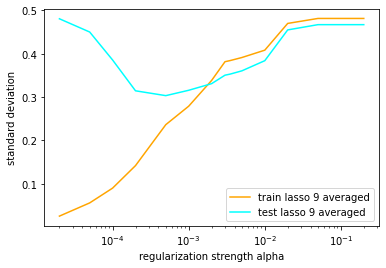

In [154]:
plt.plot(resl3[0,:],resl3[1,:],'-',color='orange',label='train lasso 9 averaged')
plt.plot(resl3[0,:],resl3[2,:],'-',color='cyan',label='test lasso 9 averaged')
plt.xlabel("regularization strength alpha")
#plt.title("model 3d")
plt.xscale("log")
plt.ylabel("standard deviation")
plt.legend(loc="best")

 standard deviation of train: 0.30802605245648346
 standard deviation of test: 0.29651499053468744


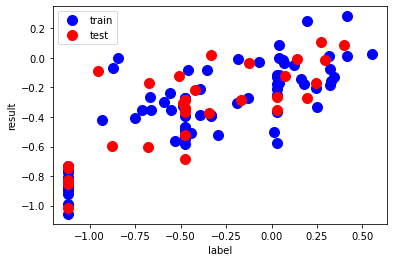

In [155]:
regr =LinearRegression()
regr.fit(xseln19_train,y_train)
pred_test_lin2 = regr.predict(xseln19_test)
pred_train_lin2 = regr.predict(xseln19_train)
regr3 =Lasso(alpha=0.0035)
regr3.fit(xseln_train,y_train)
pred_test_lin2 = regr3.predict(xseln_test)
pred_train_lin2 = regr3.predict(xseln_train)
print(f" standard deviation of train: {np.std(pred_train_lin2-y_train)}")
print(f" standard deviation of test: {np.std(pred_test_lin2-y_test)}")
plt.plot(y_train,pred_train_lin2,'o',color='blue',ms=10,label='train')
plt.plot(y_test,pred_test_lin2,'o',color='red',ms=10,label='test')
plt.xlabel("label")
plt.ylabel("result")
plt.legend(loc="best")

In [156]:
resl4=np.zeros((5,15))
resl4[0,0]=0.2
resl4[0,1]=0.1
resl4[0,2]=0.05
resl4[0,3]=0.02
resl4[0,4]=0.01
resl4[0,5]=0.005
resl4[0,6]=0.0035
resl4[0,7]=0.003
resl4[0,8]=0.002
resl4[0,9]=0.001
resl4[0,10]=0.0005
resl4[0,11]=0.0002
resl4[0,12]=0.0001
resl4[0,13]=0.00005
resl4[0,14]=0.00002
for i in range(np.shape(resl4)[1]):
    regr =Lasso(alpha=resl4[0,i],max_iter=2000)
    regr.fit(xseln19_train,y_train)
    print("Intercept:", regr.intercept_)
    pred_test_lin2b = regr.predict(xseln19_test)
    pred_train_lin2b = regr.predict(xseln19_train)
    resl4[3,i]=mean_squared_error(y_train,pred_train_lin2b)
    resl4[4,i]=mean_squared_error(y_test,pred_test_lin2b)
    resl4[1,i]=np.std(y_train-pred_train_lin2b)
    resl4[2,i]=np.std(y_test-pred_test_lin2b)

Intercept: -0.3409413783783784
Intercept: -0.3409413783783784
Intercept: -0.3409413783783784
Intercept: -0.3409413783783784
Intercept: 0.9012456116717946
Intercept: 2.0716554682267954
Intercept: 2.8457982633318992
Intercept: 3.8846630794500676
Intercept: 8.911495744998703
Intercept: 9.292063299225966
Intercept: 8.274779582918399
Intercept: 8.74692980958636
Intercept: 11.089257537326741
Intercept: 12.092979134551523
Intercept: 6.338050848884219


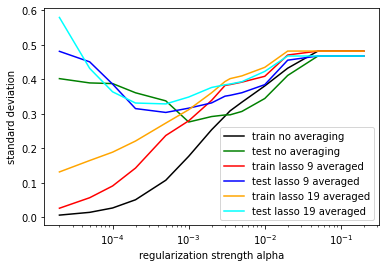

In [157]:
plt.plot(resl3[0,:],resl2[1,:],'-',color='black',label='train no averaging')
plt.plot(resl3[0,:],resl2[2,:],'-',color='green',label='test no averaging')
plt.plot(resl3[0,:],resl3[1,:],'-',color='red',label='train lasso 9 averaged')
plt.plot(resl3[0,:],resl3[2,:],'-',color='blue',label='test lasso 9 averaged')
plt.plot(resl3[0,:],resl4[1,:],'-',color='orange',label='train lasso 19 averaged')
plt.plot(resl3[0,:],resl4[2,:],'-',color='cyan',label='test lasso 19 averaged')
plt.xlabel("regularization strength alpha")
#plt.title("model 3d")
plt.xscale("log")
plt.ylabel("standard deviation")
plt.legend(loc="best")

Averaging worses the result. The best score on test is without averaging. 

 standard deviation of train: 0.003127804876423468
 standard deviation of test: 0.379497834744155


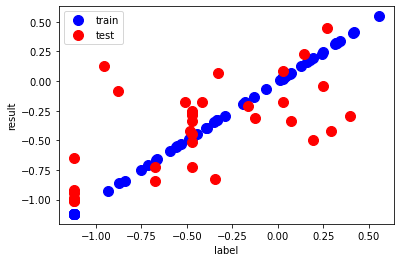

In [158]:
#now ridge l2 regularization 
regr5 =Ridge(alpha=0.0035)
regr5.fit(xseln_train,y_train)
pred_test_lin2 = regr5.predict(xseln_test)
pred_train_lin2 = regr5.predict(xseln_train)
print(f" standard deviation of train: {np.std(pred_train_lin2-y_train)}")
print(f" standard deviation of test: {np.std(pred_test_lin2-y_test)}")
plt.plot(y_train,pred_train_lin2,'o',color='blue',ms=10,label='train')
plt.plot(y_test,pred_test_lin2,'o',color='red',ms=10,label='test')
plt.xlabel("label")
plt.ylabel("result")
plt.legend(loc="best")
#means different alha needed for ridge 

In [159]:
resl5=np.zeros((5,18))
resl5[0,0]=2
resl5[0,1]=1
resl5[0,2]=0.5
resl5[0,3]=0.2
resl5[0,4]=0.1
resl5[0,5]=0.05
resl5[0,6]=0.02
resl5[0,7]=0.01
resl5[0,8]=0.005
resl5[0,9]=0.0035
resl5[0,10]=0.003
resl5[0,11]=0.002
resl5[0,12]=0.001
resl5[0,13]=0.0005
resl5[0,14]=0.0002
resl5[0,15]=0.0001
resl5[0,16]=0.00005
resl5[0,17]=0.00002
for i in range(np.shape(resl5)[1]):
    regr =Ridge(alpha=resl5[0,i],max_iter=2000)
    regr.fit(xseln_train,y_train)
    print(i)
    pred_test_lin2b = regr.predict(xseln_test)
    pred_train_lin2b = regr.predict(xseln_train)
    resl5[3,i]=mean_squared_error(y_train,pred_train_lin2b)
    resl5[4,i]=mean_squared_error(y_test,pred_test_lin2b)
    resl5[1,i]=np.std(y_train-pred_train_lin2b)
    resl5[2,i]=np.std(y_test-pred_test_lin2b)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17


miniumum of Lasso 0.27565887455638005
minimum of Ridge 0.29497411215579517


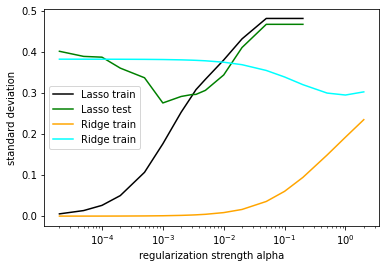

In [160]:
plt.plot(resl3[0,:],resl2[1,:],'-',color='black',label='Lasso train')
plt.plot(resl3[0,:],resl2[2,:],'-',color='green',label='Lasso test')
plt.plot(resl5[0,:],resl5[1,:],'-',color='orange',label='Ridge train')
plt.plot(resl5[0,:],resl5[2,:],'-',color='cyan',label='Ridge train')
plt.xlabel("regularization strength alpha")
#plt.title("model 3d")
plt.xscale("log")
plt.ylabel("standard deviation")
plt.legend(loc="best")
print(f"miniumum of Lasso {min(resl2[2])}")
print(f"minimum of Ridge {min(resl5[2])}")
#rdige is less problem likely that at the same time there are correlations and it are really many parameter

 standard deviation of train: 0.19230845890292642
 standard deviation of test: 0.29497411215579517


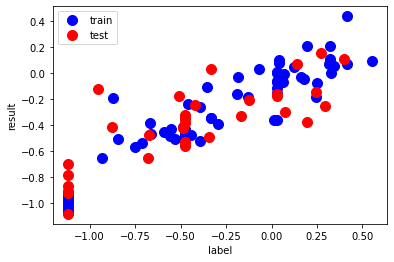

In [161]:
regr5 =Ridge(alpha=1)
regr5.fit(xseln_train,y_train)
pred_test_lin2 = regr5.predict(xseln_test)
pred_train_lin2 = regr5.predict(xseln_train)
print(f" standard deviation of train: {np.std(pred_train_lin2-y_train)}")
print(f" standard deviation of test: {np.std(pred_test_lin2-y_test)}")
plt.plot(y_train,pred_train_lin2,'o',color='blue',ms=10,label='train')
plt.plot(y_test,pred_test_lin2,'o',color='red',ms=10,label='test')
plt.xlabel("label")
plt.ylabel("result")
plt.legend(loc="best")

(-0.05, 0.03)

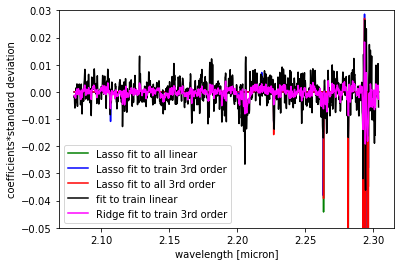

In [167]:
plt.plot(ressel[3],regr2.coef_*resn2[5],'-',color='green',label='Lasso fit to all linear')
plt.plot(ressel[3],regr3.coef_*resn2[5],'-',color='blue',label='Lasso fit to train 3rd order')
plt.plot(ressel[3],regr4.coef_*resn2[5],'-',color='red',label='Lasso fit to all 3rd order')
plt.plot(ressel[3],regr.coef_*resn2[5],'-',color='black',label='fit to train linear')
plt.plot(ressel[3],regr5.coef_*resn2[5],'-',color='magenta',label='Ridge fit to train 3rd order')
plt.xlabel("wavelength [micron]")
plt.ylabel("coefficients*standard deviation")
plt.legend(loc="best")
plt.ylim(-0.05,0.03)
#rdige does not set to zero only small , Lasso does beacuse lasso is just added L2 is Euclidian distance 